<a href="https://colab.research.google.com/github/shubhanshi01/Advanced-Persistent-Threat-Detection-Using-Temporal-Graph-Neural-Networks/blob/main/ADTDapt20.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install torch_geometric

# Optional dependencies:
!pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-2.7.0+cpu.html

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 63.8 MB/s eta 0:00:00
Looking in links: https://data.pyg.org/whl/torch-2.7.0+cpu.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.1/645.1 kB 32.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 57.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 748.1/748.1 kB 38.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.9/288.9 kB 21.5 MB/s eta 0:00:00


In [ ]:
import torch; print(torch.cuda.is_available())

True


In [ ]:
!pip install kaggle

In [ ]:
from google.colab import files
files.upload()


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"jiya017879","key":"db87faad1e598a04bcc419399fd571b4"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!kaggle datasets list -s dapt2020


ref                    title           size  lastUpdated                 downloadCount  voteCount  usabilityRating  
---------------------  --------  ----------  --------------------------  -------------  ---------  ---------------  
sowmyamyneni/dapt2020  dapt2020  9709650396  2022-12-09 13:03:56.160000           1982          8  0.3529412        


In [ ]:
import kagglehub
from kagglehub import KaggleDatasetAdapter
import pandas as pd

# List of all 10 CSV files
file_paths = [
    "csv/enp0s3-monday-pvt.pcap_Flow.csv",
    "csv/enp0s3-monday.pcap_Flow.csv",
    "csv/enp0s3-public-thursday.pcap_Flow.csv",
    "csv/enp0s3-public-tuesday.pcap_Flow.csv",
    "csv/enp0s3-public-wednesday.pcap_Flow.csv",
    "csv/enp0s3-pvt-thursday.pcap_Flow.csv",
    "csv/enp0s3-pvt-tuesday.pcap_Flow.csv",
    "csv/enp0s3-pvt-wednesday.pcap_Flow.csv",
    "csv/enp0s3-tcpdump-friday.pcap_Flow.csv",
    "csv/enp0s3-tcpdump-pvt-friday.pcap_Flow.csv"
]

# Load and combine all
df_list = []
for path in file_paths:
    print(f"Loading: {path}")
    df = kagglehub.load_dataset(
        KaggleDatasetAdapter.PANDAS,
        "sowmyamyneni/dapt2020",
        path
    )
    df_list.append(df)

full_df = pd.concat(df_list, ignore_index=True)

# Drop columns with > 50% nulls
full_df = full_df.loc[:, full_df.isnull().mean() < 0.5]

# Show shape and sample
print(f"\n✅ Combined shape: {full_df.shape}")
full_df.head()


Loading: csv/enp0s3-monday-pvt.pcap_Flow.csv


/tmp/ipython-input-50-2709982865.py:23: DeprecationWarning: load_dataset is deprecated and will be removed in a future version.
  df = kagglehub.load_dataset(


100%|██████████| 365k/365k [00:00<00:00, 102MB/s]

Extracting zip of enp0s3-monday-pvt.pcap_Flow.csv...
Loading: csv/enp0s3-monday.pcap_Flow.csv



/tmp/ipython-input-50-2709982865.py:23: DeprecationWarning: load_dataset is deprecated and will be removed in a future version.
  df = kagglehub.load_dataset(


100%|██████████| 1.10M/1.10M [00:00<00:00, 84.3MB/s]

Extracting zip of enp0s3-monday.pcap_Flow.csv...



/tmp/ipython-input-50-2709982865.py:23: DeprecationWarning: load_dataset is deprecated and will be removed in a future version.
  df = kagglehub.load_dataset(


Loading: csv/enp0s3-public-thursday.pcap_Flow.csv


100%|██████████| 1.05M/1.05M [00:00<00:00, 111MB/s]

Extracting zip of enp0s3-public-thursday.pcap_Flow.csv...
Loading: csv/enp0s3-public-tuesday.pcap_Flow.csv



/tmp/ipython-input-50-2709982865.py:23: DeprecationWarning: load_dataset is deprecated and will be removed in a future version.
  df = kagglehub.load_dataset(


100%|██████████| 3.29M/3.29M [00:00<00:00, 28.1MB/s]

Extracting zip of enp0s3-public-tuesday.pcap_Flow.csv...


Loading: csv/enp0s3-public-wednesday.pcap_Flow.csv


/tmp/ipython-input-50-2709982865.py:23: DeprecationWarning: load_dataset is deprecated and will be removed in a future version.
  df = kagglehub.load_dataset(


100%|██████████| 2.13M/2.13M [00:00<00:00, 119MB/s]

Extracting zip of enp0s3-public-wednesday.pcap_Flow.csv...


Loading: csv/enp0s3-pvt-thursday.pcap_Flow.csv


/tmp/ipython-input-50-2709982865.py:23: DeprecationWarning: load_dataset is deprecated and will be removed in a future version.
  df = kagglehub.load_dataset(


100%|██████████| 367k/367k [00:00<00:00, 77.7MB/s]

Extracting zip of enp0s3-pvt-thursday.pcap_Flow.csv...
Loading: csv/enp0s3-pvt-tuesday.pcap_Flow.csv



/tmp/ipython-input-50-2709982865.py:23: DeprecationWarning: load_dataset is deprecated and will be removed in a future version.
  df = kagglehub.load_dataset(


100%|██████████| 322k/322k [00:00<00:00, 88.8MB/s]

Extracting zip of enp0s3-pvt-tuesday.pcap_Flow.csv...
Loading: csv/enp0s3-pvt-wednesday.pcap_Flow.csv



/tmp/ipython-input-50-2709982865.py:23: DeprecationWarning: load_dataset is deprecated and will be removed in a future version.
  df = kagglehub.load_dataset(


100%|██████████| 775k/775k [00:00<00:00, 2.16MB/s]
/tmp/ipython-input-50-2709982865.py:23: DeprecationWarning: load_dataset is deprecated and will be removed in a future version.
  df = kagglehub.load_dataset(


Loading: csv/enp0s3-tcpdump-friday.pcap_Flow.csv


100%|██████████| 819k/819k [00:00<00:00, 103MB/s]

Extracting zip of enp0s3-tcpdump-friday.pcap_Flow.csv...
Loading: csv/enp0s3-tcpdump-pvt-friday.pcap_Flow.csv



/tmp/ipython-input-50-2709982865.py:23: DeprecationWarning: load_dataset is deprecated and will be removed in a future version.
  df = kagglehub.load_dataset(


100%|██████████| 358k/358k [00:00<00:00, 89.3MB/s]

Extracting zip of enp0s3-tcpdump-pvt-friday.pcap_Flow.csv...

✅ Combined shape: (86690, 85)


,Flow ID,Src IP,Src Port,Dst IP,Dst Port,Protocol,Timestamp,Flow Duration,Total Fwd Packet,Total Bwd packets,...,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Activity,Stage
0,8.0.6.4-8.6.0.1-0-0-0,8.6.0.1,0.0,8.0.6.4,0.0,0.0,15/07/2019 01:55:21 PM,119998944.0,242.0,1.0,...,0.000000,0.000000,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,Normal,Benign
1,192.168.3.10-239.2.11.71-53569-8662-17,192.168.3.10,53569.0,239.2.11.71,8662.0,17.0,15/07/2019 01:55:22 PM,109235816.0,21.0,1.0,...,819535.500000,78517.844090,875056.0,764015.0,1.517532e+07,6.349189e+06,20019201.0,5202524.0,Normal,Benign
2,255.255.255.255-0.0.0.0-67-68-17,0.0.0.0,68.0,255.255.255.255,67.0,17.0,15/07/2019 01:55:22 PM,119764062.0,88.0,1.0,...,0.000000,0.000000,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,Normal,Benign
3,192.168.3.30-192.168.3.31-40504-9200-6,192.168.3.30,40504.0,192.168.3.31,9200.0,6.0,15/07/2019 01:55:23 PM,117030424.0,18.0,17.0,...,192329.333333,436593.123269,1083374.0,7236.0,1.931131e+07,1.177830e+07,34978598.0,5147962.0,Normal,Benign
4,0.87.248.248-3.0.0.0-0-0-0,0.87.248.248,0.0,3.0.0.0,0.0,0.0,15/07/2019 01:55:58 PM,119999703.0,2.0,1.0,...,0.000000,0.000000,0.0,0.0,5.999985e+07,8.478210e+02,60000451.0,59999252.0,Normal,Benign


In [ ]:
# Deleting dataframes after concating to save memory
for d in df_list: del d

In [ ]:
full_df.columns

Index(['Flow ID', 'Src IP', 'Src Port', 'Dst IP', 'Dst Port', 'Protocol',
       'Timestamp', 'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets',
       'Total Length of Fwd Packet', 'Total Length of Bwd Packet',
       'Fwd Packet Length Max', 'Fwd Packet Length Min',
       'Fwd Packet Length Mean', 'Fwd Packet Length Std',
       'Bwd Packet Length Max', 'Bwd Packet Length Min',
       'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s',
       'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
       'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std',
       'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean',
       'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags',
       'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Packet Length Min', 'Packet Length Max', 'Packet Length Mean',
       'Packet Length Std', 'Packet Len

In [ ]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86690 entries, 0 to 86689
Data columns (total 85 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Flow ID                     82577 non-null  object 
 1   Src IP                      82577 non-null  object 
 2   Src Port                    82577 non-null  float64
 3   Dst IP                      82577 non-null  object 
 4   Dst Port                    82577 non-null  float64
 5   Protocol                    82577 non-null  float64
 6   Timestamp                   82577 non-null  object 
 7   Flow Duration               82577 non-null  float64
 8   Total Fwd Packet            82577 non-null  float64
 9   Total Bwd packets           82577 non-null  float64
 10  Total Length of Fwd Packet  82577 non-null  float64
 11  Total Length of Bwd Packet  82577 non-null  float64
 12  Fwd Packet Length Max       82577 non-null  float64
 13  Fwd Packet Length Min       825

In [ ]:
pd.options.display.max_rows = 80

print('Overview of Columns:')
full_df.describe().transpose()

Overview of Columns:


,count,mean,std,min,25%,50%,75%,max
Src Port,82577.0,3.989421e+04,1.888400e+04,0.000000,36218.000000,47232.000000,5.314100e+04,6.547500e+04
Dst Port,82577.0,8.138425e+03,1.406584e+04,0.000000,53.000000,445.000000,9.002000e+03,6.543200e+04
Protocol,82577.0,9.146082e+00,5.461515e+00,0.000000,6.000000,6.000000,1.700000e+01,1.700000e+01
Flow Duration,82577.0,2.052417e+07,4.149541e+07,4.000000,426.000000,15783.000000,2.116769e+06,1.200000e+08
Total Fwd Packet,82577.0,5.640961e+01,2.572796e+03,0.000000,1.000000,1.000000,8.000000e+00,2.590890e+05
Total Bwd packets,82577.0,8.087342e+01,5.146954e+03,1.000000,2.000000,3.000000,5.000000e+00,5.183840e+05
Total Length of Fwd Packet,82577.0,2.030443e+04,1.900680e+06,0.000000,0.000000,45.000000,6.020000e+02,2.534673e+08
Total Length of Bwd Packet,82577.0,4.322426e+04,8.230808e+05,0.000000,0.000000,228.000000,4.890000e+02,9.548315e+07
Fwd Packet Length Max,82577.0,2.264236e+02,9.354529e+02,0.000000,0.000000,45.000000,1.220000e+02,6.444000e+04
Fwd Packet Length Min,82577.0,2.167536e+01,8.928810e+01,0.000000,0.000000,0.000000,4.500000e+01,1.158400e+04


In [ ]:
dups = full_df[full_df.duplicated()]
print(f'Number of duplicates: {len(dups)}')

Number of duplicates: 4112


In [ ]:
data=full_df.copy()

In [ ]:
data.drop_duplicates(inplace = True)
data.shape

(82578, 85)

In [ ]:
missing_val = data.isna().sum()
print(missing_val.loc[missing_val > 0])

Flow ID     1
Src IP      1
Src Port    1
Dst IP      1
Dst Port    1
           ..
Idle Std    1
Idle Max    1
Idle Min    1
Activity    1
Stage       1
Length: 85, dtype: int64


In [ ]:
import numpy as np
# Checking for infinity values
numeric_cols = data.select_dtypes(include = np.number).columns
inf_count = np.isinf(data[numeric_cols]).sum()
print(inf_count[inf_count > 0])

Series([], dtype: int64)


In [ ]:
# Replacing any infinite values (positive or negative) with NaN (not a number)
print(f'Initial missing values: {data.isna().sum().sum()}')

data.replace([np.inf, -np.inf], np.nan, inplace = True)

print(f'Missing values after processing infinite values: {data.isna().sum().sum()}')

Initial missing values: 85
Missing values after processing infinite values: 85


In [ ]:



missing = data.isna().sum()
print(missing.loc[missing > 0])

Flow ID     1
Src IP      1
Src Port    1
Dst IP      1
Dst Port    1
           ..
Idle Std    1
Idle Max    1
Idle Min    1
Activity    1
Stage       1
Length: 85, dtype: int64


In [ ]:
# Calculating missing value percentage in the dataset
mis_per = (missing / len(data)) * 100
mis_table = pd.concat([missing, mis_per.round(2)], axis = 1)
mis_table = mis_table.rename(columns = {0 : 'Missing Values', 1 : 'Percentage of Total Values'})

print(mis_table.loc[mis_per > 0])

          Missing Values  Percentage of Total Values
Flow ID                1                         0.0
Src IP                 1                         0.0
Src Port               1                         0.0
Dst IP                 1                         0.0
Dst Port               1                         0.0
...                  ...                         ...
Idle Std               1                         0.0
Idle Max               1                         0.0
Idle Min               1                         0.0
Activity               1                         0.0
Stage                  1                         0.0

[85 rows x 2 columns]



Unique values and their counts in ' Flow Packets/s':
Flow ID
192.168.3.10-239.2.11.71-53569-8662-17        2393
8.0.6.4-8.6.0.1-0-0-0                         2387
255.255.255.255-0.0.0.0-67-68-17              2368
0.87.248.248-3.0.0.0-0-0-0                    1744
192.168.3.29-192.168.3.31-34788-9200-6         789
                                              ... 
192.168.3.30-192.168.101.125-33848-37207-6       1
192.168.3.30-192.168.101.125-40608-42802-6       1
192.168.3.30-192.168.101.125-42606-24496-6       1
192.168.3.30-192.168.101.125-52348-15838-6       1
192.168.3.30-8.8.8.8-36261-53-17                 1
Name: count, Length: 40106, dtype: int64


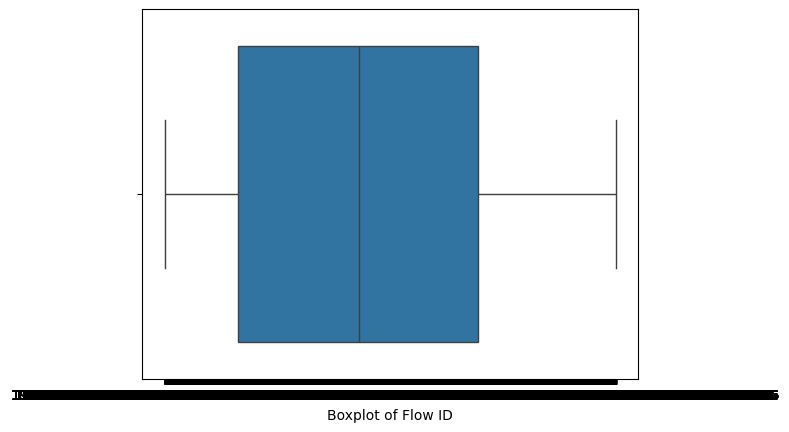

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Reset the index of the dataframe to ensure a unique index (already suggested, keeping it)
data = data.reset_index(drop=True)

# Inspect the unique values and their counts in the target column
print("\nUnique values and their counts in ' Flow Packets/s':")
print(data['Flow ID'].value_counts())

# Replace 'Flow Packets/s' with the correct column name if it's different
# We will keep the plotting code as is for now, but the inspection above will help
# diagnose the issue. If there are a huge number of identical values, particularly 0,
# we might need to consider different plotting approaches or data transformations.
sns.boxplot(x = data["Flow ID"])
plt.xlabel("Boxplot of Flow ID")
plt.show()

In [ ]:

for col in data.columns:
    if data[col].isna().sum() > 0:
        if data[col].dtype in ['int64', 'float64']:
            median_val = data[col].median()
            data[col] = data[col].fillna(median_val)
        elif data[col].dtype == 'object':
            mode_val = data[col].mode()[0]
            data[col] = data[col].fillna(mode_val)

missing_val_after = data.isna().sum()
print("\nMissing values after imputation:")
print(missing_val_after[missing_val_after > 0])



Missing values after imputation:
Series([], dtype: int64)


In [ ]:
data.columns

Index(['Flow ID', 'Src IP', 'Src Port', 'Dst IP', 'Dst Port', 'Protocol',
       'Timestamp', 'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets',
       'Total Length of Fwd Packet', 'Total Length of Bwd Packet',
       'Fwd Packet Length Max', 'Fwd Packet Length Min',
       'Fwd Packet Length Mean', 'Fwd Packet Length Std',
       'Bwd Packet Length Max', 'Bwd Packet Length Min',
       'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s',
       'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
       'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std',
       'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean',
       'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags',
       'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Packet Length Min', 'Packet Length Max', 'Packet Length Mean',
       'Packet Length Std', 'Packet Len

In [ ]:
data['Activity'].unique()

array(['Normal', 'Network Scan', 'Backdoor', 'BENIGN',
       'Account Discovery', 'Directory Bruteforce',
       'Web Vulnerability Scan', 'Account Bruteforce', 'SQL Injection',
       'CSRF', 'Malware Download', 'Command Injection',
       'Data Exfiltration'], dtype=object)

In [ ]:
data['Activity'].value_counts()

,count
Activity,
Normal,42459
BENIGN,19454
Directory Bruteforce,9970
Network Scan,7742
Web Vulnerability Scan,2574
Account Bruteforce,141
Account Discovery,136
SQL Injection,55
Backdoor,20


In [ ]:

activity_attack_map = {
    'Normal': 'BENIGN',
    'BENIGN': 'BENIGN',
    'Directory Bruteforce': 'Bruteforce',
    'Network Scan': 'Scan',
    'Web Vulnerability Scan': 'Scan',
    'Account Bruteforce': 'Bruteforce',
    'Account Discovery': 'Discovery',
    'SQL Injection': 'Injection',
    'Backdoor': 'Malware',
    'Command Injection': 'Injection',
    'CSRF': 'Injection',
    'Data Exfiltration': 'Exfiltration',
    'Malware Download': 'Malware'
}

data['Attack Type'] = data['Activity'].map(activity_attack_map)

In [ ]:
data.drop('Activity', axis = 1, inplace = True)

In [ ]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
data['Attack Number'] = le.fit_transform(data['Attack Type'])

print(data['Attack Number'].unique())

[0 6 5 2 1 4 3]


In [ ]:
# Printing corresponding attack type for each encoded value
encoded_values = data['Attack Number'].unique()
for val in sorted(encoded_values):
    print(f"{val}: {le.inverse_transform([val])[0]}")

0: BENIGN
1: Bruteforce
2: Discovery
3: Exfiltration
4: Injection
5: Malware
6: Scan


In [ ]:




columns_to_drop = [
    'Fwd PSH Flags',
    'Fwd URG Flags',
    'Bwd URG Flags',
    'URG Flag Count',
    'Fwd Bytes/Bulk Avg',
    'Fwd Packet/Bulk Avg',
    'Fwd Bulk Rate Avg',
    'Bwd Avg Bulk Bytes',
    'Bwd Avg Bulk Packets',
    'Bwd Bulk Rate Avg',
    'FWD Init Win Bytes',
    'Fwd Seg Size Min',
    'Bwd Bytes/Bulk Avg',
    'Bwd Packet/Bulk Avg'
]

# Remove columns if they exist in the dataframe
data.drop(columns=columns_to_drop, errors='ignore', inplace=True)

print(f"Shape after dropping columns: {data.shape}")


Shape after dropping columns: (82578, 74)


In [ ]:
corr = data.corr(numeric_only = True).round(2)
corr.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

,Src Port,Dst Port,Protocol,Flow Duration,Total Fwd Packet,Total Bwd packets,Total Length of Fwd Packet,Total Length of Bwd Packet,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Bwd PSH Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,CWR Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Fwd Segment Size Avg,Bwd Segment Size Avg,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Bwd Init Win Bytes,Fwd Act Data Pkts,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Attack Number
Src Port,1.00,-0.49,0.23,-0.37,0.01,0.01,0.00,0.02,0.02,-0.16,-0.01,0.04,0.05,-0.17,0.04,0.06,-0.01,-0.05,-0.30,0.06,-0.18,-0.31,-0.34,-0.24,0.05,-0.13,-0.26,0.05,0.04,0.04,0.05,0.01,-0.00,0.01,0.01,-0.05,-0.04,-0.23,0.05,0.03,0.06,0.02,-0.10,0.29,-0.25,-0.00,-0.09,-0.02,-0.02,0.31,0.03,-0.01,0.04,0.01,0.00,0.01,0.02,0.03,0.01,-0.23,-0.11,-0.19,-0.20,-0.20,0.06,-0.17,-0.23,0.21
Dst Port,-0.49,1.00,-0.29,-0.15,-0.01,-0.01,-0.01,-0.02,-0.03,-0.09,-0.02,-0.01,-0.06,-0.10,-0.06,-0.07,0.05,0.22,-0.09,-0.02,-0.09,-0.09,-0.14,-0.07,-0.02,-0.08,-0.07,-0.05,-0.02,-0.03,-0.04,0.00,0.01,-0.01,-0.01,0.17,0.19,-0.23,-0.06,-0.05,-0.05,-0.03,0.35,-0.05,0.34,0.01,0.36,0.00,0.00,-0.28,-0.06,-0.02,-0.06,-0.01,-0.01,-0.01,-0.02,0.11,-0.01,-0.03,-0.05,-0.04,-0.01,-0.09,-0.03,-0.08,-0.09,-0.02
Protocol,0.23,-0.29,1.00,-0.11,-0.01,-0.01,-0.01,-0.03,-0.09,0.33,-0.02,-0.16,-0.08,0.37,-0.05,-0.09,-0.04,-0.22,-0.24,-0.03,-0.20,-0.24,-0.08,-0.22,-0.05,-0.17,-0.21,-0.18,-0.13,-0.14,-0.15,-0.00,-0.17,-0.01,-0.01,-0.14,-0.21,0.61,-0.09,-0.04,-0.10,-0.04,-0.23,-0.38,-0.09,-0.17,-0.39,-0.01,-0.01,0.58,-0.04,-0.02,-0.05,-0.01,-0.01,-0.01,-0.03,-0.11,-0.01,0.16,0.11,0.14,0.12,-0.21,-0.01,-0.20,-0.23,-0.26
Flow Duration,-0.37,-0.15,-0.11,1.00,0.04,0.03,0.01,0.07,0.24,0.19,0.24,0.25,0.14,0.20,0.10,0.13,-0.04,-0.19,0.39,0.53,0.64,0.30,0.98,0.45,0.50,0.65,0.30,0.52,0.35,0.38,0.41,0.02,0.21,0.03,0.03,-0.12,-0.18,0.32,0.16,0.15,0.16,0.09,-0.20,-0.13,-0.08,0.21,-0.10,-0.01,-0.01,-0.39,0.14,0.24,0.10,0.04,0.01,0.03,0.07,0.01,0.03,0.38,0.39,0.44,0.28,0.59,0.40,0.62,0.52,-0.22
Total Fwd Packet,0.01,-0.01,-0.01,0.04,1.00,1.00,0.08,0.48,0.05,-0.00,0.02,0.02,0.02,0.00,0.01,0.01,0.02,-0.01,-0.00,-0.00,-0.00,-0.00,0.04,-0.00,-0.00,-0.00,-0.00,0.05,-0.00,-0.00,-0.00,-0.00,0.03,1.00,1.00,-0.00,-0.01,-0.00,0.03,0.01,0.01,0.01,-0.01,-0.00,-0.00,0.03,0.01,-0.00,-0.00,-0.00,0.01,0.02,0.01,1.00,0.08,1.00,0.48,-0.00,0.10,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00
Total Bwd packets,0.01,-0.01,-0.01,0.03,1.00,1.00,0.08,0.48,0.05,-0.00,0.02,0.02,0.02,-0.00,0.00,0.01,0.02,-0.00,-0.00,-0.00,-0.00,-0.00,0.03,-0.00,-0.00,-0.00,-0.00,0.05,-0.00,-0.00,-0.00,-0.00,0.03,1.00,1.00,-0.00,-0.00,-0.01,0.03,0.01,0.01,0.01,-0.01,-0.00,-0.00,0.03,0.01,-0.00,-0.00,0.01,0.01,0.02,0.00,1.00,0.08,1.00,0.48,-0.00,0.09,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00
Total Length of Fwd Packet,0.00,-0.01,-0.01,0.01,0.08,0.08,1.00,-0.00,0.61,-0.00,0.49,0.36,0.01,-0.00,-0.00,-0.00,0.10,-0.00,-0.00,-0.00,0.01,-0.00,0.01,-0.00,-0.00,0.01,-0.00,0.01,-0.00,-0.00,0.02,-0.00,-0.00,0.06,0.06,-0.00,-0.00,-0.00,0.14,0.05,0.10,0.09,-0.00,0.01,-0.00,-0.00,-0.01,-0.00,-0.00,0.00,0.05,0.49,-0.00,0.08,1.00,0.08,-0.00,0.01,0.83,0.00,0.00,0.00,0.00,0.01,0.03,0.01,0.00,-0.00
Total Length of Bwd Packet,0.02,-0.02,-0.03,0.07,0.48,0.48,-0.00,1.00,0.04,-0.01,-0.01,0.01,0.57,-0.01,0.59,0.54,0.11,-0.02,-0.01,-0.01,0.02,-0.01,0.07,-0.01,0.00,0.02,-0.01,0.13,-0.01,0.

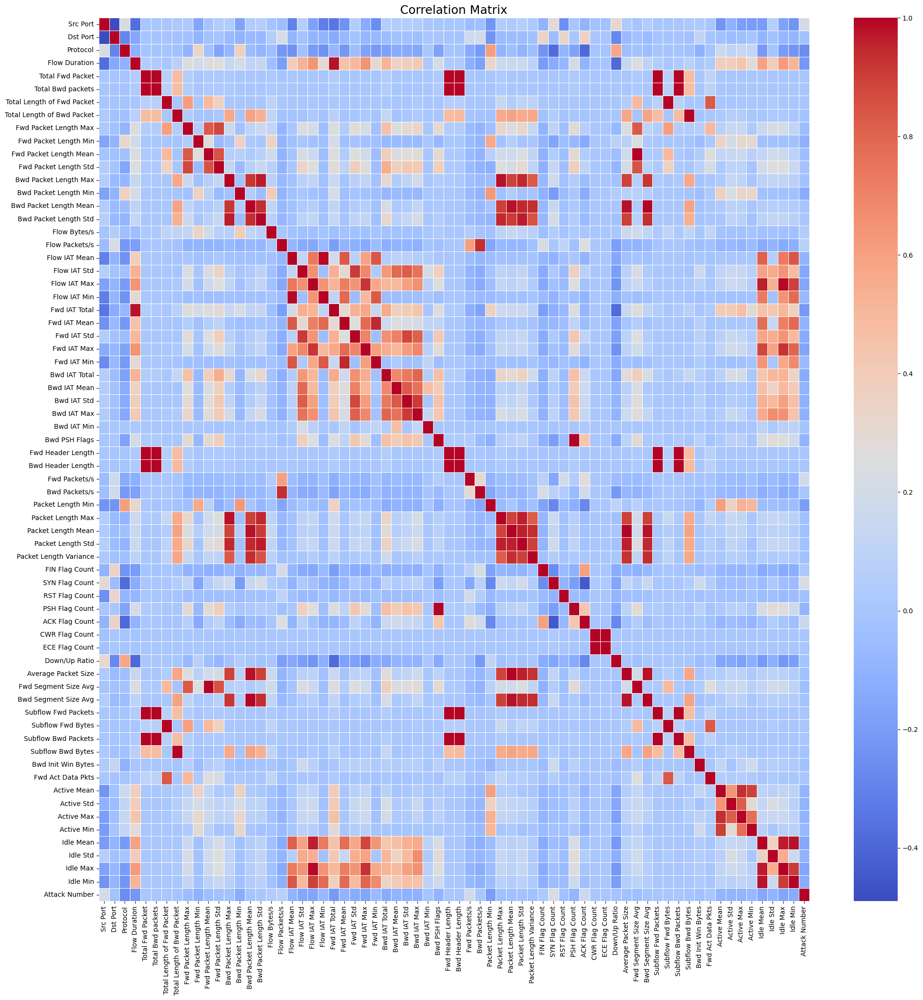

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
fig, ax = plt.subplots(figsize = (24, 24))
sns.heatmap(corr, cmap = 'coolwarm', annot = False, linewidth = 0.5)
plt.title('Correlation Matrix', fontsize = 18)
plt.show()

In [ ]:
# Positive correlation features for 'Attack Number'
pos_corr_features = corr['Attack Number'][(corr['Attack Number'] > 0) & (corr['Attack Number'] < 1)].index.tolist()

print("Features with positive correlation with 'Attack Number':\n")
for i, feature in enumerate(pos_corr_features, start = 1):
    corr_value = corr.loc[feature, 'Attack Number']
    print('{:<3} {:<24} :{}'.format(f'{i}.', feature, corr_value))

Features with positive correlation with 'Attack Number':

1.  Src Port                 :0.21
2.  Flow Bytes/s             :0.04
3.  Flow Packets/s           :0.07
4.  Fwd Packets/s            :0.19
5.  FIN Flag Count           :0.02
6.  SYN Flag Count           :0.22
7.  ACK Flag Count           :0.16
8.  Fwd Act Data Pkts        :0.01


In [ ]:
print(f'Number of considerable important features: {len(pos_corr_features)}')

Number of considerable important features: 8


In [ ]:
# Data sampling for data analysis
sample_size = int(0.2 * len(data)) # 20% of the original size
sampled_data = data.sample(n = sample_size, replace = False, random_state = 0)
sampled_data.shape

(16515, 74)

In [ ]:
# Printing the unique value count
indent = '{:<3} {:<30}: {}'
print('Unique value count for: ')
for i, feature in enumerate(list(sampled_data.columns)[:-1], start = 1):
    print(indent.format(f'{i}.', feature, sampled_data[feature].nunique()))

Unique value count for: 
1.  Flow ID                       : 12689
2.  Src IP                        : 301
3.  Src Port                      : 8886
4.  Dst IP                        : 431
5.  Dst Port                      : 2117
6.  Protocol                      : 3
7.  Timestamp                     : 9068
8.  Flow Duration                 : 10750
9.  Total Fwd Packet              : 300
10. Total Bwd packets             : 289
11. Total Length of Fwd Packet    : 2429
12. Total Length of Bwd Packet    : 2312
13. Fwd Packet Length Max         : 858
14. Fwd Packet Length Min         : 54
15. Fwd Packet Length Mean        : 2835
16. Fwd Packet Length Std         : 3491
17. Bwd Packet Length Max         : 854
18. Bwd Packet Length Min         : 67
19. Bwd Packet Length Mean        : 2585
20. Bwd Packet Length Std         : 3167
21. Flow Bytes/s                  : 9494
22. Flow Packets/s                : 11670
23. Flow IAT Mean                 : 11304
24. Flow IAT Std                  : 11230

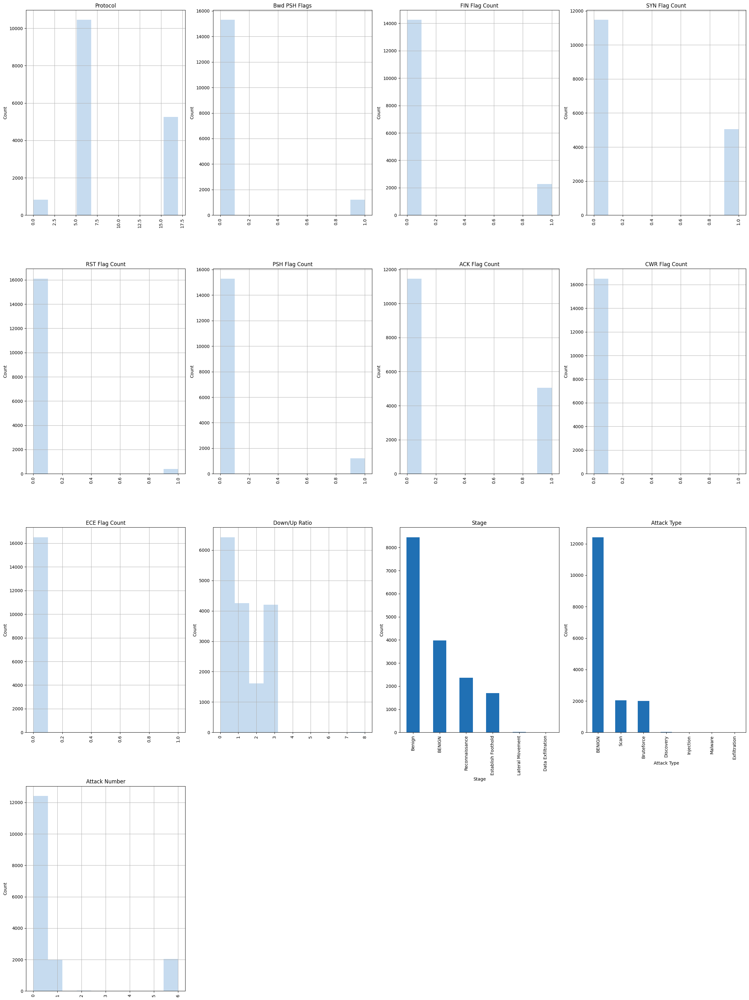

In [ ]:
'''Generating a set of visualizations for columns that have more than one unique value but less than 50 unique values.
For categorical columns, a bar plot is generated showing the count of each unique value.
For numerical columns, a histogram is generated.'''
unique_values = sampled_data.nunique()
selected_cols = sampled_data[[col for col in sampled_data if 1 < unique_values[col] < 50]]
rows, cols = selected_cols.shape
col_names = list(selected_cols)
num_of_rows = (cols + 3) // 4

color_palette = sns.color_palette('Blues', n_colors = 3)
plt.figure(figsize = (6 * 4, 8 * num_of_rows))

for i in range(cols):
    plt.subplot(num_of_rows, 4, i + 1)
    col_data = selected_cols.iloc[:, i]
    if col_data.dtype.name == 'object':
        col_data.value_counts().plot(kind = 'bar', color = color_palette[2])
    else:
        col_data.hist(color = color_palette[0])

    plt.ylabel('Count')
    plt.xticks(rotation = 90)
    plt.title(col_names[i])

plt.tight_layout()
plt.show()

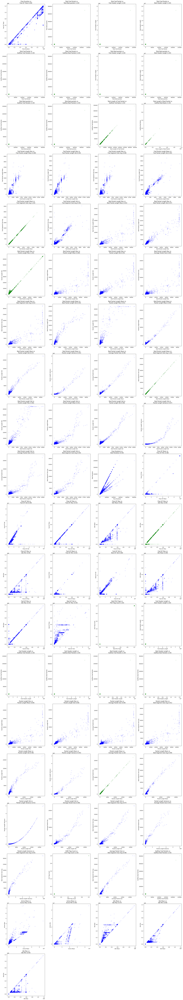

In [ ]:
# Plotting the pairs of strongly positive correlated features in the sampled_data that have a correlation coefficient of 0.85 or higher

# Select only numeric columns for correlation calculation
numeric_cols_sampled = sampled_data.select_dtypes(include=np.number).columns.tolist()

high_corr_pairs = []
corr_th = 0.85

# Iterate through the numeric columns
for i in range(len(numeric_cols_sampled)):
  for j in range(i + 1, len(numeric_cols_sampled)):
    col1 = numeric_cols_sampled[i]
    col2 = numeric_cols_sampled[j]
    # Calculate correlation only between numeric columns
    val = sampled_data[col1].corr(sampled_data[col2])
    # If the correlation coefficient is NaN or below the threshold, skip to the next pair
    if np.isnan(val) or val < corr_th:
      continue
    high_corr_pairs.append((val, col1, col2))

size, cols_plot = len(high_corr_pairs), 4 # Renamed 'cols' to 'cols_plot' to avoid conflict with 'numeric_cols_sampled'
rows, rem =  size // cols_plot, size % cols_plot
if rem:
  rows += 1

fig, axs = plt.subplots(rows, cols_plot, figsize = (24, int(size * 1.7)))
# Handle cases where there is only one row or one column for subplots
axs = axs.flatten() if size > 0 else np.array([axs])

for i in range(size):
    try:
        val, x, y = high_corr_pairs[i]
        if val > 0.99:
            axs[i].scatter(sampled_data[x], sampled_data[y], color = 'green', alpha = 0.1)
        else:
            axs[i].scatter(sampled_data[x], sampled_data[y], color = 'blue', alpha = 0.1)
        axs[i].set_xlabel(x)
        axs[i].set_ylabel(y)
        axs[i].set_title(f'{x} vs\n{y} ({val:.2f})')
    except IndexError:
        # This exception should not be reached with the corrected loop size
        pass

# Remove any unused subplots if the number of high_corr_pairs is not a perfect multiple of cols_plot
for j in range(size, rows * cols_plot):
    fig.delaxes(axs[j])


fig.tight_layout()
plt.show()

In [ ]:
sampled_data.drop('Attack Number', axis = 1, inplace = True)
data.drop('Attack Number', axis = 1, inplace = True)

In [ ]:
# Identifying outliers
numeric_data = sampled_data.select_dtypes(include = ['float', 'int'])
q1 = numeric_data.quantile(0.25)
q3 = numeric_data.quantile(0.75)
iqr = q3 - q1
outlier = (numeric_data < (q1 - 1.5 * iqr)) | (numeric_data > (q3 + 1.5 * iqr))
outlier_count = outlier.sum()
outlier_percentage = round(outlier.mean() * 100, 2)
outlier_stats = pd.concat([outlier_count, outlier_percentage], axis = 1)
outlier_stats.columns = ['Outlier Count', 'Outlier Percentage']

print(outlier_stats)

                            Outlier Count  Outlier Percentage
Src Port                             2810               17.01
Dst Port                             1624                9.83
Protocol                                0                0.00
Flow Duration                        3904               23.64
Total Fwd Packet                     3473               21.03
Total Bwd packets                    2626               15.90
Total Length of Fwd Packet           3191               19.32
Total Length of Bwd Packet           3408               20.64
Fwd Packet Length Max                1983               12.01
Fwd Packet Length Min                 490                2.97
Fwd Packet Length Mean               1595                9.66
Fwd Packet Length Std                3206               19.41
Bwd Packet Length Max                1960               11.87
Bwd Packet Length Min                 502                3.04
Bwd Packet Length Mean               1899               11.50
Bwd Pack

In [ ]:
# Identifying outliers based on attack type
outlier_counts = {}
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        attack_data = sampled_data[i][sampled_data['Attack Type'] == attack_type]
        q1, q3 = np.percentile(attack_data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        num_outliers = ((attack_data < lower_bound) | (attack_data > upper_bound)).sum()
        outlier_percent = num_outliers / len(attack_data) * 100
        outlier_counts[(i, attack_type)] = (num_outliers, outlier_percent)

for i in numeric_data:
  print(f'Feature: {i}')
  for attack_type in sampled_data['Attack Type'].unique():
    num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
    print(f'- {attack_type}: {num_outliers} ({outlier_percent:.2f}%)')
  print()

Feature: Src Port
- BENIGN: 2455 (19.76%)
- Scan: 6 (0.29%)
- Bruteforce: 240 (11.95%)
- Discovery: 1 (4.35%)
- Malware: 1 (25.00%)
- Injection: 0 (0.00%)
- Exfiltration: 0 (0.00%)

Feature: Dst Port
- BENIGN: 1619 (13.03%)
- Scan: 423 (20.69%)
- Bruteforce: 370 (18.43%)
- Discovery: 8 (34.78%)
- Malware: 1 (25.00%)
- Injection: 0 (0.00%)
- Exfiltration: 0 (0.00%)

Feature: Protocol
- BENIGN: 0 (0.00%)
- Scan: 0 (0.00%)
- Bruteforce: 0 (0.00%)
- Discovery: 0 (0.00%)
- Malware: 0 (0.00%)
- Injection: 0 (0.00%)
- Exfiltration: 0 (0.00%)

Feature: Flow Duration
- BENIGN: 2613 (21.04%)
- Scan: 188 (9.20%)
- Bruteforce: 68 (3.39%)
- Discovery: 0 (0.00%)
- Malware: 0 (0.00%)
- Injection: 2 (15.38%)
- Exfiltration: 0 (0.00%)

Feature: Total Fwd Packet
- BENIGN: 2344 (18.87%)
- Scan: 388 (18.98%)
- Bruteforce: 38 (1.89%)
- Discovery: 4 (17.39%)
- Malware: 0 (0.00%)
- Injection: 1 (7.69%)
- Exfiltration: 0 (0.00%)

Feature: Total Bwd packets
- BENIGN: 2378 (19.14%)
- Scan: 380 (18.59%)
- Brutef

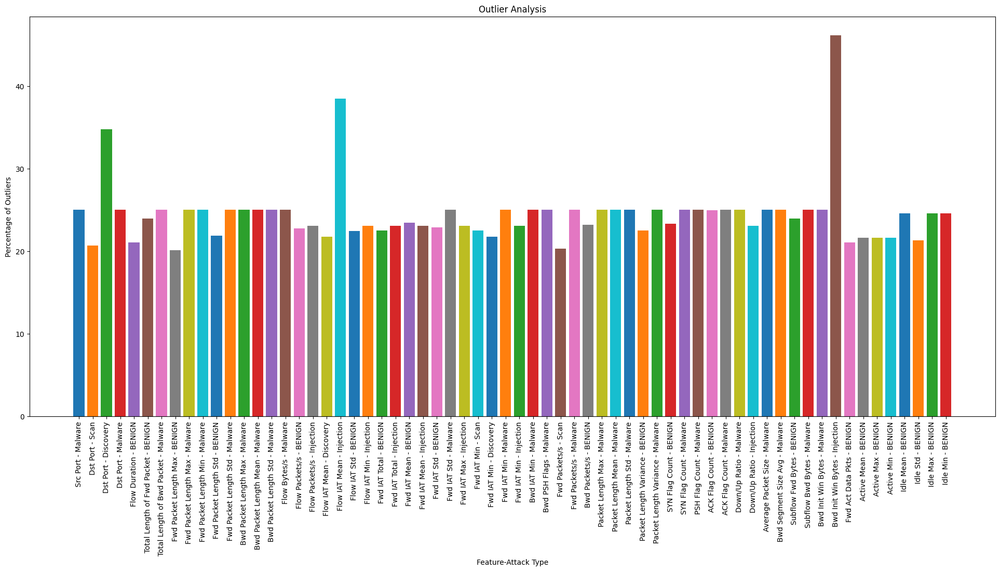

In [ ]:
# Plotting the percentage of outliers that are higher than 20%
fig, ax = plt.subplots(figsize = (24, 10))
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
        if outlier_percent > 20:
            ax.bar(f'{i} - {attack_type}', outlier_percent)

ax.set_xlabel('Feature-Attack Type')
ax.set_ylabel('Percentage of Outliers')
ax.set_title('Outlier Analysis')
ax.set_yticks(np.arange(0, 41, 10))
plt.xticks(rotation = 90)
plt.show()

/tmp/ipython-input-80-256482873.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)


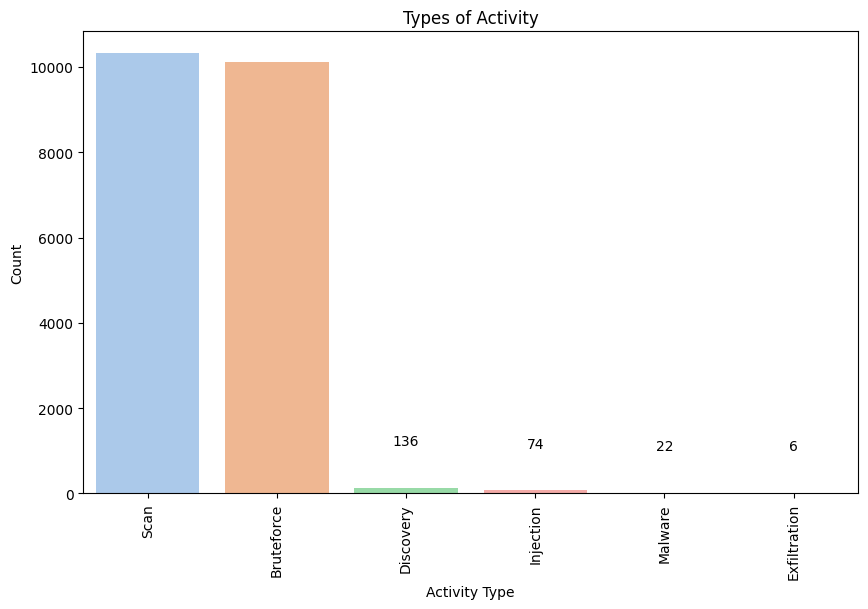

In [ ]:
# Different 'Attack Type' in the main dataset excluding 'BENIGN'
attacks = data.loc[data['Attack Type'] != 'BENIGN']

plt.figure(figsize = (10, 6))
ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)
plt.title('Types of Activity')
plt.xlabel('Activity Type')
plt.ylabel('Count')
plt.xticks(rotation = 90)

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height() + 1000), ha = 'center')

plt.show()

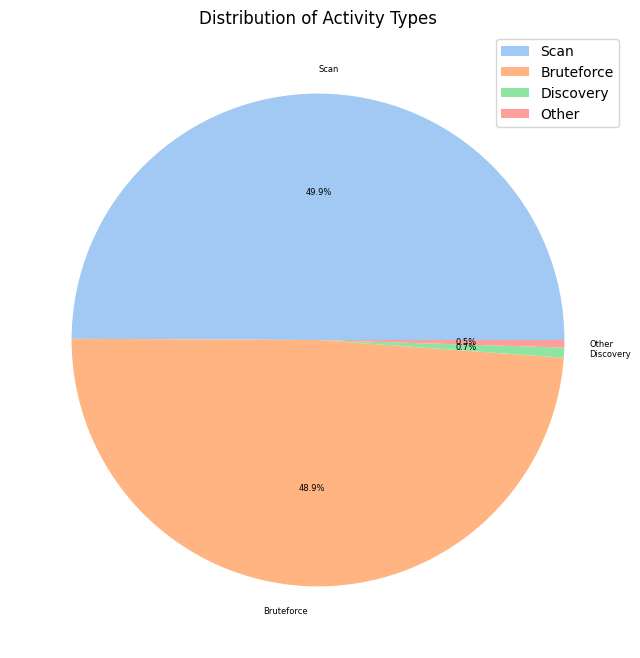

In [ ]:
attack_counts = attacks['Attack Type'].value_counts()
threshold = 0.005
percentages = attack_counts / attack_counts.sum()
small_slices = percentages[percentages < threshold].index.tolist()
attack_counts['Other'] = attack_counts[small_slices].sum()
attack_counts.drop(small_slices, inplace = True)

sns.set_palette('pastel')
plt.figure(figsize = (8, 8))
plt.pie(attack_counts.values, labels = attack_counts.index, autopct = '%1.1f%%', textprops={'fontsize': 6})
plt.title('Distribution of Activity Types')
plt.legend(attack_counts.index, loc = 'best')
plt.show()

In [ ]:
data['Stage'] = data['Stage'].str.upper()
print(data['Stage'].value_counts())


Stage
BENIGN                61913
RECONNAISSANCE        11909
ESTABLISH FOOTHOLD     8604
LATERAL MOVEMENT        137
DATA EXFILTRATION        15
Name: count, dtype: int64


In [ ]:
import socket
import struct

def ip_to_int(ip_address):
  """Converts an IPv4 address string to an integer."""
  try:
    return struct.unpack("!I", socket.inet_aton(ip_address))[0]
  except socket.error:
    # Handle potential errors for invalid IP addresses
    return np.nan # or raise an error, or return a specific value

# Apply the conversion function to the IP columns
data['Src IP_int'] = data['Src IP'].apply(ip_to_int)
data['Dst IP_int'] = data['Dst IP'].apply(ip_to_int)


# Display the first few rows with the new integer columns and dropped columns
print(data.head())

# Verify the data types of the new columns
print(data[['Src IP_int', 'Dst IP_int']].info())

                                  Flow ID        Src IP  Src Port  \
0                   8.0.6.4-8.6.0.1-0-0-0       8.6.0.1       0.0   
1  192.168.3.10-239.2.11.71-53569-8662-17  192.168.3.10   53569.0   
2        255.255.255.255-0.0.0.0-67-68-17       0.0.0.0      68.0   
3  192.168.3.30-192.168.3.31-40504-9200-6  192.168.3.30   40504.0   
4              0.87.248.248-3.0.0.0-0-0-0  0.87.248.248       0.0   

            Dst IP  Dst Port  Protocol               Timestamp  Flow Duration  \
0          8.0.6.4       0.0       0.0  15/07/2019 01:55:21 PM    119998944.0   
1      239.2.11.71    8662.0      17.0  15/07/2019 01:55:22 PM    109235816.0   
2  255.255.255.255      67.0      17.0  15/07/2019 01:55:22 PM    119764062.0   
3     192.168.3.31    9200.0       6.0  15/07/2019 01:55:23 PM    117030424.0   
4          3.0.0.0       0.0       0.0  15/07/2019 01:55:58 PM    119999703.0   

   Total Fwd Packet  Total Bwd packets  ...  Active Max  Active Min  \
0             242.0        

In [ ]:

le_activity = LabelEncoder()
le_stage = LabelEncoder()

data['activity_int'] = le_activity.fit_transform(data['Attack Type'])
data['stage_int'] = le_stage.fit_transform(data['Stage'])

print("\nDataframe after encoding 'Activity' and 'Stage' and dropping original columns:")
print(data.head())
print("\nEncoded Activity values and their original labels:")
for i in range(len(le_activity.classes_)):
    print(f"{i}: {le_activity.classes_[i]}")

print("\nEncoded Stage values and their original labels:")
for i in range(len(le_stage.classes_)):
    print(f"{i}: {le_stage.classes_[i]}")



Dataframe after encoding 'Activity' and 'Stage' and dropping original columns:
                                  Flow ID        Src IP  Src Port  \
0                   8.0.6.4-8.6.0.1-0-0-0       8.6.0.1       0.0   
1  192.168.3.10-239.2.11.71-53569-8662-17  192.168.3.10   53569.0   
2        255.255.255.255-0.0.0.0-67-68-17       0.0.0.0      68.0   
3  192.168.3.30-192.168.3.31-40504-9200-6  192.168.3.30   40504.0   
4              0.87.248.248-3.0.0.0-0-0-0  0.87.248.248       0.0   

            Dst IP  Dst Port  Protocol               Timestamp  Flow Duration  \
0          8.0.6.4       0.0       0.0  15/07/2019 01:55:21 PM    119998944.0   
1      239.2.11.71    8662.0      17.0  15/07/2019 01:55:22 PM    109235816.0   
2  255.255.255.255      67.0      17.0  15/07/2019 01:55:22 PM    119764062.0   
3     192.168.3.31    9200.0       6.0  15/07/2019 01:55:23 PM    117030424.0   
4          3.0.0.0       0.0       0.0  15/07/2019 01:55:58 PM    119999703.0   

   Total Fwd Packe

In [ ]:

data['Timestamp'] = pd.to_datetime(data['Timestamp'])
data['Timestamp_hours'] = data['Timestamp'].dt.hour.astype(int)
print(data[['Timestamp', 'Timestamp_hours']].head())


/tmp/ipython-input-85-1534711163.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data['Timestamp'] = pd.to_datetime(data['Timestamp'])


            Timestamp  Timestamp_hours
0 2019-07-15 13:55:21               13
1 2019-07-15 13:55:22               13
2 2019-07-15 13:55:22               13
3 2019-07-15 13:55:23               13
4 2019-07-15 13:55:58               13


In [ ]:
data.groupby('Attack Type').first()

,Flow ID,Src IP,Src Port,Dst IP,Dst Port,Protocol,Timestamp,Flow Duration,Total Fwd Packet,Total Bwd packets,...,Idle Mean,Idle Std,Idle Max,Idle Min,Stage,Src IP_int,Dst IP_int,activity_int,stage_int,Timestamp_hours
Attack Type,,,,,,,,,,,,,,,,,,,,,
BENIGN,8.0.6.4-8.6.0.1-0-0-0,8.6.0.1,0.0,8.0.6.4,0.0,0.0,2019-07-15 13:55:21,119998944.0,242.0,1.0,...,0.0,0.0,0.0,0.0,BENIGN,134610945,134219268,0,0,13
Bruteforce,192.168.3.29-206.207.50.50-9002-37668-6,206.207.50.50,37668.0,192.168.3.29,9002.0,6.0,2019-07-16 17:13:08,2190.0,2.0,5.0,...,0.0,0.0,0.0,0.0,RECONNAISSANCE,3469685298,3232236317,1,4,17
Discovery,192.168.3.29-209.147.138.11-9000-50539-6,209.147.138.11,50539.0,192.168.3.29,9000.0,6.0,2019-07-16 13:45:08,7537949.0,10.0,11.0,...,0.0,0.0,0.0,0.0,RECONNAISSANCE,3516107275,3232236317,2,4,13
Exfiltration,192.168.3.30-206.207.50.50-47046-28643-6,206.207.50.50,28643.0,192.168.3.30,47046.0,6.0,2019-07-19 16:31:47,2746.0,1.0,1.0,...,0.0,0.0,0.0,0.0,DATA EXFILTRATION,3469685298,3232236318,3,1,16
Injection,192.168.3.29-206.207.50.50-9002-39766-6,206.207.50.50,39766.0,192.168.3.29,9002.0,6.0,2019-07-17 14:45:40,5033805.0,6.0,5.0,...,0.0,0.0,0.0,0.0,ESTABLISH FOOTHOLD,3469685298,3232236317,4,2,14
Malware,192.168.3.29-192.168.3.34-47916-4444-6,192.168.3.29,47916.0,192.168.3.34,4444.0,6.0,2019-07-18 20:05:14,22260.0,5.0,6.0,...,0.0,0.0,0.0,0.0,LATERAL MOVEMENT,3232236317,3232236322,5,3,20
Scan,192.168.3.29-209.147.138.38-9000-56646-6,209.147.138.38,56646.0,192.168.3.29,9000.0,6.0,2019-07-18 14:22:07,6878549.0,7.0,8.0,...,0.0,0.0,0.0,0.0,LATERAL MOVEMENT,3516107302,3232236317,6,3,14


In [ ]:
data.columns

Index(['Flow ID', 'Src IP', 'Src Port', 'Dst IP', 'Dst Port', 'Protocol',
       'Timestamp', 'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets',
       'Total Length of Fwd Packet', 'Total Length of Bwd Packet',
       'Fwd Packet Length Max', 'Fwd Packet Length Min',
       'Fwd Packet Length Mean', 'Fwd Packet Length Std',
       'Bwd Packet Length Max', 'Bwd Packet Length Min',
       'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s',
       'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
       'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std',
       'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean',
       'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd PSH Flags',
       'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s',
       'Bwd Packets/s', 'Packet Length Min', 'Packet Length Max',
       'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance',
       'FIN Flag Count', 'SYN Flag Count', 

In [ ]:

attack_types = data['Attack Type'].unique()

# Create a dictionary to store dataframes for each attack type
data_by_attack_type = {}

# Iterate through each unique attack type and create a separate dataframe
for attack_type in attack_types:
  data_by_attack_type[attack_type] = data[data['Attack Type'] == attack_type].copy()

# Example of accessing a specific dataframe (e.g., for 'BENIGN')
benign_data = data_by_attack_type.get('BENIGN')
bruteforce_data = data_by_attack_type['Bruteforce']
scan_data = data_by_attack_type['Scan']
injection_data = data_by_attack_type['Injection']
malware_data = data_by_attack_type['Malware']
discovery_data = data_by_attack_type['Discovery']
exfiltration_data = data_by_attack_type['Exfiltration']



# Print the shape of each generated dataframe to verify
for attack_type, df in data_by_attack_type.items():
  print(f"Shape of dataframe for '{attack_type}': {df.shape}")

Shape of dataframe for 'BENIGN': (61913, 78)
Shape of dataframe for 'Scan': (10316, 78)
Shape of dataframe for 'Malware': (22, 78)
Shape of dataframe for 'Discovery': (136, 78)
Shape of dataframe for 'Bruteforce': (10111, 78)
Shape of dataframe for 'Injection': (74, 78)
Shape of dataframe for 'Exfiltration': (6, 78)


In [ ]:

corr = benign_data.corr(numeric_only = True).round(2)
corr.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

,Src Port,Dst Port,Protocol,Flow Duration,Total Fwd Packet,Total Bwd packets,Total Length of Fwd Packet,Total Length of Bwd Packet,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Bwd PSH Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,CWR Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Fwd Segment Size Avg,Bwd Segment Size Avg,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Bwd Init Win Bytes,Fwd Act Data Pkts,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Src IP_int,Dst IP_int,activity_int,stage_int,Timestamp_hours
Src Port,1.00,-0.51,0.38,-0.31,0.01,0.02,0.01,0.03,0.05,-0.12,0.00,0.07,0.07,-0.12,0.05,0.08,-0.02,-0.11,-0.28,0.13,-0.12,-0.30,-0.28,-0.22,0.12,-0.08,-0.25,0.12,0.09,0.09,0.10,0.01,0.05,0.02,0.02,-0.20,-0.07,-0.17,0.07,0.04,0.07,0.03,-0.27,0.27,-0.26,0.05,-0.20,-0.02,-0.02,0.35,0.04,0.00,0.05,0.01,0.01,0.02,0.03,0.05,-0.01,-0.21,-0.08,-0.16,-0.19,-0.15,0.11,-0.11,-0.19,0.68,-0.19,nan,nan,0.00
Dst Port,-0.51,1.00,-0.32,-0.16,-0.01,-0.01,-0.01,-0.03,-0.02,-0.10,-0.02,-0.00,-0.06,-0.10,-0.06,-0.07,0.06,0.26,-0.09,-0.02,-0.10,-0.09,-0.15,-0.07,-0.03,-0.08,-0.07,-0.06,-0.02,-0.03,-0.04,0.00,0.01,-0.01,-0.01,0.29,0.20,-0.24,-0.06,-0.05,-0.05,-0.03,0.47,-0.05,0.35,0.01,0.43,0.00,0.00,-0.30,-0.06,-0.02,-0.06,-0.01,-0.01,-0.01,-0.03,0.12,-0.01,-0.03,-0.05,-0.04,-0.01,-0.09,-0.03,-0.09,-0.09,0.00,0.45,nan,nan,-0.07
Protocol,0.38,-0.32,1.00,-0.23,-0.01,-0.01,-0.01,-0.04,-0.13,0.30,-0.04,-0.19,-0.10,0.33,-0.05,-0.11,-0.02,-0.23,-0.30,-0.10,-0.30,-0.29,-0.18,-0.28,-0.12,-0.25,-0.25,-0.25,-0.19,-0.20,-0.22,-0.00,-0.23,-0.01,-0.01,-0.13,-0.21,0.58,-0.11,-0.05,-0.12,-0.05,-0.23,-0.39,-0.12,-0.23,-0.41,-0.01,-0.01,0.64,-0.05,-0.04,-0.05,-0.01,-0.01,-0.01,-0.04,-0.15,0.01,0.13,0.08,0.11,0.10,-0.30,-0.06,-0.29,-0.31,0.27,-0.40,nan,nan,0.10
Flow Duration,-0.31,-0.16,-0.23,1.00,0.04,0.03,0.00,0.06,0.23,0.16,0.24,0.25,0.14,0.16,0.10,0.12,-0.03,-0.19,0.37,0.51,0.62,0.29,0.97,0.43,0.48,0.63,0.30,0.50,0.33,0.36,0.39,0.02,0.18,0.03,0.03,-0.11,-0.18,0.28,0.15,0.15,0.15,0.08,-0.19,-0.07,-0.10,0.18,-0.05,-0.01,-0.01,-0.43,0.14,0.24,0.10,0.04,0.00,0.03,0.06,-0.00,0.04,0.36,0.38,0.43,0.26,0.57,0.38,0.60,0.50,-0.57,0.18,nan,nan,0.04
Total Fwd Packet,0.01,-0.01,-0.01,0.04,1.00,1.00,0.08,0.48,0.05,-0.00,0.02,0.02,0.02,0.00,0.00,0.01,0.02,-0.00,-0.00,-0.01,-0.00,-0.00,0.04,-0.00,-0.00,-0.00,-0.00,0.05,-0.00,-0.00,-0.00,-0.00,0.03,1.00,1.00,-0.00,-0.00,-0.00,0.03,0.01,0.01,0.01,-0.01,-0.00,-0.00,0.03,0.02,-0.00,-0.00,0.00,0.01,0.02,0.00,1.00,0.08,1.00,0.48,-0.00,0.10,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.01,nan,nan,0.02
Total Bwd packets,0.02,-0.01,-0.01,0.03,1.00,1.00,0.08,0.49,0.05,-0.00,0.02,0.02,0.02,-0.00,0.00,0.01,0.02,-0.00,-0.00,-0.01,-0.00,-0.00,0.03,-0.00,-0.00,-0.00,-0.00,0.05,-0.00,-0.00,-0.00,-0.00,0.03,1.00,1.00,0.00,-0.00,-0.01,0.03,0.01,0.01,0.01,-0.00,-0.00,-0.00,0.03,0.02,-0.00,-0.00,0.01,0.01,0.02,0.00,1.00,0.08,1.00,0.49,-0.00,0.09,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.01,0.01,nan,nan,0.02
Total Length of Fwd Packet,0.01,-0.01,-0.01,0.00,0.08,0.08,1.00,-0.00,0.61,-0.00,0.50,0.36,0.01,-0.00,-0.00,-0.00,0.10,-0.00,-0.00,-0.00,0.01,-0.00,0.00,-0.00,-0.00,0.01,-0.00,0.01,-0.00,-0.00,0.02,-0.00,-0.00,0.06,0.06,-0.00,-0.00,-0.00,0.15,0.05,0.10,0.09,-0.00,0.02,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.05,0.50,-0.00,0.08,1.00,0.08,-0.00,0.01,0.83,0.00,0.00,0.00,0.00,0.01,0.03,0.01,0.00,0.00,0.00,nan,nan,0.01
Total Length of B

In [ ]:
high_corr_scan = corr[(corr > 0.8) & (corr < 1.0)].stack().sort_values(ascending=False)
print("\nBenign - Correlations > 0.5:\n")
for (feature1, feature2), correlation_value in high_corr_scan.items():
    print(f"{feature1:<25} - {feature2:<25}: {correlation_value:.2f}")


Benign - Correlations > 0.5:

Idle Max                  - Flow IAT Max             : 0.99
Flow IAT Min              - Flow IAT Mean            : 0.99
Flow IAT Max              - Idle Max                 : 0.99
Flow IAT Mean             - Flow IAT Min             : 0.99
Bwd Packet Length Max     - Packet Length Max        : 0.98
Bwd Packet Length Mean    - Packet Length Mean       : 0.98
Packet Length Max         - Bwd Packet Length Max    : 0.98
Bwd Packet Length Mean    - Average Packet Size      : 0.98
Idle Mean                 - Idle Min                 : 0.98
Average Packet Size       - Bwd Segment Size Avg     : 0.98
Bwd Segment Size Avg      - Average Packet Size      : 0.98
Bwd Segment Size Avg      - Packet Length Mean       : 0.98
Packet Length Mean        - Bwd Segment Size Avg     : 0.98
Average Packet Size       - Bwd Packet Length Mean   : 0.98
Packet Length Mean        - Bwd Packet Length Mean   : 0.98
Idle Min                  - Idle Mean                : 0.98
Fwd IAT T

In [ ]:
corr2 = scan_data.corr(numeric_only = True).round(2)
corr2.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

,Src Port,Dst Port,Protocol,Flow Duration,Total Fwd Packet,Total Bwd packets,Total Length of Fwd Packet,Total Length of Bwd Packet,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Bwd PSH Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,CWR Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Fwd Segment Size Avg,Bwd Segment Size Avg,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Bwd Init Win Bytes,Fwd Act Data Pkts,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Src IP_int,Dst IP_int,activity_int,stage_int,Timestamp_hours
Src Port,1.00,-0.74,nan,0.03,-0.09,-0.10,-0.02,-0.05,0.17,nan,0.10,0.15,0.10,0.01,0.09,0.22,-0.00,-0.06,0.02,0.04,0.05,0.01,0.02,0.02,0.04,0.03,0.01,0.02,0.02,0.03,0.03,0.07,-0.03,-0.10,-0.10,-0.05,-0.07,nan,0.10,0.09,0.16,0.02,-0.02,0.14,-0.01,-0.03,-0.14,nan,nan,-0.03,0.10,0.10,0.09,-0.09,-0.02,-0.10,-0.05,0.05,-0.10,0.02,-0.00,0.02,0.02,-0.01,-0.00,-0.01,-0.01,0.01,-0.15,nan,0.09,-0.00
Dst Port,-0.74,1.00,nan,0.03,0.07,0.09,0.00,0.05,-0.15,nan,-0.08,-0.09,-0.08,0.03,-0.13,-0.19,-0.00,0.10,0.01,-0.02,0.01,0.02,0.02,-0.01,-0.05,-0.03,0.00,0.03,-0.01,-0.01,0.00,-0.12,0.09,0.07,0.09,0.12,0.06,nan,-0.08,-0.11,-0.15,-0.01,-0.13,-0.18,0.06,0.09,0.18,nan,nan,0.05,-0.12,-0.08,-0.13,0.07,0.00,0.09,0.05,-0.00,-0.01,0.00,0.00,0.00,0.00,0.01,0.01,0.01,0.01,-0.25,0.10,nan,-0.26,0.28
Protocol,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Flow Duration,0.03,0.03,nan,1.00,0.16,0.14,0.27,0.20,0.14,nan,0.13,0.08,0.13,-0.01,0.20,0.13,-0.06,-0.08,0.63,0.75,0.89,0.41,0.85,0.70,0.43,0.77,0.59,0.88,0.73,0.74,0.80,0.07,-0.03,0.13,0.11,-0.06,-0.09,nan,0.14,0.22,0.16,0.10,-0.06,0.12,-0.02,-0.03,-0.12,nan,nan,-0.05,0.22,0.13,0.20,0.16,0.27,0.14,0.20,0.12,0.13,0.05,0.37,0.06,0.05,0.70,0.51,0.70,0.70,-0.15,-0.00,nan,-0.18,0.08
Total Fwd Packet,-0.09,0.07,nan,0.16,1.00,0.98,0.66,0.64,0.12,nan,0.10,-0.04,0.27,-0.02,0.36,0.12,0.21,-0.16,-0.02,-0.03,-0.00,-0.02,0.22,-0.03,-0.01,0.01,-0.02,0.19,-0.02,-0.02,0.02,-0.03,-0.06,0.99,0.96,-0.12,-0.18,nan,0.28,0.41,0.20,0.12,-0.13,0.35,-0.05,-0.06,-0.35,nan,nan,-0.09,0.39,0.10,0.36,1.00,0.66,0.98,0.64,-0.00,0.78,-0.00,-0.00,-0.00,-0.00,-0.01,-0.00,-0.01,-0.01,0.21,-0.01,nan,-0.00,-0.22
Total Bwd packets,-0.10,0.09,nan,0.14,0.98,1.00,0.58,0.62,0.10,nan,0.05,-0.03,0.24,-0.02,0.29,0.10,0.19,-0.15,-0.02,-0.03,-0.01,-0.01,0.19,-0.02,-0.01,0.00,-0.02,0.17,-0.02,-0.02,0.01,-0.05,-0.06,0.98,0.99,-0.12,-0.17,nan,0.24,0.34,0.17,0.08,-0.12,0.33,-0.05,-0.06,-0.33,nan,nan,-0.06,0.32,0.05,0.29,0.98,0.58,1.00,0.62,-0.01,0.72,-0.00,-0.00,-0.00,-0.00,-0.01,-0.00,-0.01,-0.01,0.20,-0.00,nan,0.01,-0.21
Total Length of Fwd Packet,-0.02,0.00,nan,0.27,0.66,0.58,1.00,0.39,0.29,nan,0.44,0.03,0.21,-0.02,0.43,0.08,0.23,-0.18,-0.02,-0.02,0.02,-0.02,0.37,-0.03,-0.00,0.02,-0.03,0.32,-0.01,-0.01,0.05,0.08,-0.07,0.65,0.58,-0.14,-0.21,nan,0.22,0.54,0.19,0.07,-0.15,0.39,-0.06,-0.07,-0.39,nan,nan,-0.13,0.51,0.44,0.43,0.66,1.00,0.58,0.39,-0.04,0.85,-0.00,-0.00,-0.00,-0.00,-0.01,-0.01,-0.01,-0.01,0.13,-0.01,nan,0.03,-0.13
Total Length of Bwd Packet,-0.05,0.05,nan,0.20,0.64,0.62,0.39,1.00,0.11,nan,0.04,-0.00,0.47,-0.01,0.51,0.33,0.15,-0.09,-0.01,-0.01,0.03,-0.01,0.26,-0.01,0.00,0.05,-0.01,0.22,-0.01,-0.01,0.06

In [ ]:
high_corr_scan2 = corr2[(corr2 > 0.8) & (corr2 < 1.0)].stack().sort_values(ascending=False)
print("\nScan Data - Correlations > 0.5:\n")
for (feature1, feature2), correlation_value in high_corr_scan.items():
    print(f"{feature1:<25} - {feature2:<25}: {correlation_value:.2f}")


Scan Data - Correlations > 0.5:

Idle Max                  - Flow IAT Max             : 0.99
Flow IAT Min              - Flow IAT Mean            : 0.99
Flow IAT Max              - Idle Max                 : 0.99
Flow IAT Mean             - Flow IAT Min             : 0.99
Bwd Packet Length Max     - Packet Length Max        : 0.98
Bwd Packet Length Mean    - Packet Length Mean       : 0.98
Packet Length Max         - Bwd Packet Length Max    : 0.98
Bwd Packet Length Mean    - Average Packet Size      : 0.98
Idle Mean                 - Idle Min                 : 0.98
Average Packet Size       - Bwd Segment Size Avg     : 0.98
Bwd Segment Size Avg      - Average Packet Size      : 0.98
Bwd Segment Size Avg      - Packet Length Mean       : 0.98
Packet Length Mean        - Bwd Segment Size Avg     : 0.98
Average Packet Size       - Bwd Packet Length Mean   : 0.98
Packet Length Mean        - Bwd Packet Length Mean   : 0.98
Idle Min                  - Idle Mean                : 0.98
Fwd IA

In [ ]:
corr3 = bruteforce_data.corr(numeric_only = True).round(2)
corr3.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

,Src Port,Dst Port,Protocol,Flow Duration,Total Fwd Packet,Total Bwd packets,Total Length of Fwd Packet,Total Length of Bwd Packet,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Bwd PSH Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,CWR Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Fwd Segment Size Avg,Bwd Segment Size Avg,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Bwd Init Win Bytes,Fwd Act Data Pkts,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Src IP_int,Dst IP_int,activity_int,stage_int,Timestamp_hours
Src Port,1.00,-0.02,nan,0.00,-0.02,-0.10,-0.01,-0.03,-0.11,nan,-0.07,-0.15,-0.02,nan,0.11,-0.06,-0.19,0.00,0.02,0.03,0.04,-0.02,-0.01,0.03,-0.03,0.03,0.04,-0.01,0.00,0.07,0.02,-0.01,nan,-0.02,-0.10,-0.08,0.05,nan,-0.03,0.07,0.01,0.04,0.14,0.02,nan,nan,-0.02,nan,nan,0.05,0.06,-0.07,0.11,-0.02,-0.01,-0.10,-0.03,0.09,0.10,0.06,-0.02,0.06,0.06,0.02,-0.01,0.01,0.02,0.27,-0.11,nan,-0.73,-0.71
Dst Port,-0.02,1.00,nan,-0.01,0.11,0.09,0.08,0.10,-0.12,nan,-0.05,-0.15,-0.11,nan,0.01,-0.24,-0.07,0.14,-0.02,-0.03,-0.04,0.00,-0.01,-0.04,-0.05,-0.04,-0.03,-0.02,-0.02,-0.13,-0.05,0.00,nan,0.11,0.09,0.05,0.18,nan,-0.11,0.00,-0.12,-0.04,0.12,-0.08,nan,nan,0.08,nan,nan,-0.02,-0.01,-0.05,0.01,0.11,0.08,0.09,0.10,0.02,0.11,-0.02,0.00,-0.02,-0.02,-0.04,0.00,-0.04,-0.04,-0.03,0.26,nan,-0.45,-0.25
Protocol,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Flow Duration,0.00,-0.01,nan,1.00,0.05,0.04,0.08,0.08,0.16,nan,0.12,0.14,0.16,nan,0.12,0.17,-0.03,-0.14,0.70,0.73,0.84,0.08,0.96,0.66,0.63,0.79,0.56,0.96,0.63,0.62,0.80,0.49,nan,0.04,0.04,-0.10,-0.14,nan,0.17,0.12,0.18,0.15,-0.14,0.14,nan,nan,-0.14,nan,nan,-0.04,0.12,0.12,0.12,0.05,0.08,0.04,0.08,0.21,0.02,0.16,0.62,0.16,0.16,0.65,0.53,0.73,0.63,-0.14,-0.00,nan,0.02,0.17
Total Fwd Packet,-0.02,0.11,nan,0.05,1.00,0.96,0.87,0.99,0.28,nan,0.56,0.04,0.40,nan,0.71,0.20,0.54,-0.67,-0.06,-0.06,-0.06,-0.02,0.07,-0.05,-0.03,-0.04,-0.05,0.07,-0.02,-0.07,-0.03,-0.01,nan,1.00,0.96,-0.48,-0.69,nan,0.39,0.76,0.47,0.04,-0.71,0.79,nan,nan,-0.79,nan,nan,-0.29,0.75,0.56,0.71,1.00,0.87,0.96,0.99,-0.08,0.90,-0.02,-0.01,-0.02,-0.02,-0.03,-0.01,-0.03,-0.03,-0.01,-0.01,nan,-0.01,-0.04
Total Bwd packets,-0.10,0.09,nan,0.04,0.96,1.00,0.73,0.96,0.25,nan,0.43,0.06,0.35,nan,0.56,0.19,0.48,-0.56,-0.05,-0.05,-0.05,-0.01,0.06,-0.04,-0.03,-0.04,-0.04,0.07,-0.02,-0.06,-0.03,-0.01,nan,0.96,1.00,-0.40,-0.57,nan,0.34,0.61,0.39,0.03,-0.59,0.66,nan,nan,-0.66,nan,nan,-0.24,0.60,0.43,0.56,0.96,0.73,1.00,0.96,-0.08,0.75,-0.02,-0.01,-0.02,-0.02,-0.02,-0.01,-0.02,-0.02,0.01,-0.01,nan,0.09,0.05
Total Length of Fwd Packet,-0.01,0.08,nan,0.08,0.87,0.73,1.00,0.85,0.35,nan,0.74,0.07,0.39,nan,0.76,0.18,0.54,-0.69,-0.06,-0.06,-0.05,-0.02,0.10,-0.05,-0.02,-0.04,-0.05,0.11,-0.02,-0.06,-0.02,-0.01,nan,0.86,0.72,-0.49,-0.71,nan,0.39,0.84,0.48,0.04,-0.73,0.82,nan,nan,-0.82,nan,nan,-0.32,0.83,0.74,0.76,0.87,1.00,0.73,0.85,-0.09,0.93,-0.02,-0.01,-0.02,-0.02,-0.03,-0.01,-0.03,-0.03,-0.18,-0.01,nan,-0.06,-0.04
Total Length of Bwd Packet,-0.03,0.10,nan,0.08,0.99,0.96,0.85,1.00,0.30,nan,0.54,0.06,0.47,nan,0.74,0.26,0.53,-0.65,-0.06,-0.05,-0.04,-0.02,0.09,-0.05,-0.02,-0.03,-0.05,0.10,-0.02,-0.05,-0.01,-0.01,nan,0.99,0.96,

In [ ]:
high_corr_scan3 = corr3[(corr3 > 0.8) & (corr3 < 1.0)].stack().sort_values(ascending=False)
print("\nBruteforce data - Correlations > 0.5:\n")
for (feature1, feature2), correlation_value in high_corr_scan.items():
    print(f"{feature1:<25} - {feature2:<25}: {correlation_value:.2f}")


Bruteforce data - Correlations > 0.5:

Idle Max                  - Flow IAT Max             : 0.99
Flow IAT Min              - Flow IAT Mean            : 0.99
Flow IAT Max              - Idle Max                 : 0.99
Flow IAT Mean             - Flow IAT Min             : 0.99
Bwd Packet Length Max     - Packet Length Max        : 0.98
Bwd Packet Length Mean    - Packet Length Mean       : 0.98
Packet Length Max         - Bwd Packet Length Max    : 0.98
Bwd Packet Length Mean    - Average Packet Size      : 0.98
Idle Mean                 - Idle Min                 : 0.98
Average Packet Size       - Bwd Segment Size Avg     : 0.98
Bwd Segment Size Avg      - Average Packet Size      : 0.98
Bwd Segment Size Avg      - Packet Length Mean       : 0.98
Packet Length Mean        - Bwd Segment Size Avg     : 0.98
Average Packet Size       - Bwd Packet Length Mean   : 0.98
Packet Length Mean        - Bwd Packet Length Mean   : 0.98
Idle Min                  - Idle Mean                : 0.98


In [ ]:
corr4 = injection_data.corr(numeric_only = True).round(2)
corr4.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

,Src Port,Dst Port,Protocol,Flow Duration,Total Fwd Packet,Total Bwd packets,Total Length of Fwd Packet,Total Length of Bwd Packet,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Bwd PSH Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,CWR Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Fwd Segment Size Avg,Bwd Segment Size Avg,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Bwd Init Win Bytes,Fwd Act Data Pkts,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Src IP_int,Dst IP_int,activity_int,stage_int,Timestamp_hours
Src Port,1.00,nan,nan,-0.19,0.02,0.01,0.15,-0.04,0.19,nan,0.16,0.18,-0.01,nan,-0.01,0.02,-0.01,0.35,-0.31,-0.18,-0.19,-0.17,-0.13,-0.21,0.17,-0.13,-0.23,-0.08,-0.03,-0.03,-0.05,0.36,nan,0.22,0.15,-0.22,0.35,nan,0.09,0.05,0.09,0.12,0.38,0.06,nan,nan,-0.06,nan,nan,-0.43,0.06,0.16,-0.01,0.02,0.15,0.01,-0.04,-0.14,0.08,-0.05,nan,-0.05,-0.05,-0.05,nan,-0.05,-0.05,0.84,nan,nan,nan,-0.75
Dst Port,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Protocol,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Flow Duration,-0.19,nan,nan,1.00,0.42,0.21,0.22,0.10,0.10,nan,0.12,0.10,0.32,nan,0.34,0.32,0.04,-0.37,0.62,0.79,0.86,-0.35,0.87,0.67,0.41,0.79,0.57,0.55,0.47,0.35,0.36,0.34,nan,0.35,0.24,-0.18,-0.37,nan,0.25,0.29,0.26,0.14,-0.40,0.75,nan,nan,-0.75,nan,nan,0.32,0.29,0.12,0.34,0.42,0.22,0.21,0.10,0.52,0.42,0.53,nan,0.53,0.53,0.50,nan,0.50,0.50,-0.25,nan,nan,nan,0.26
Total Fwd Packet,0.02,nan,nan,0.42,1.00,0.92,0.40,0.82,0.26,nan,0.24,0.22,0.68,nan,0.90,0.65,0.80,-0.30,-0.15,0.06,0.24,-0.27,0.18,-0.08,0.33,0.08,-0.14,0.54,0.35,0.36,0.49,0.25,nan,0.95,0.93,-0.06,-0.30,nan,0.58,0.84,0.63,0.44,-0.33,0.53,nan,nan,-0.53,nan,nan,0.46,0.82,0.24,0.90,1.00,0.40,0.92,0.82,-0.14,0.77,0.25,nan,0.25,0.25,0.20,nan,0.20,0.20,-0.01,nan,nan,nan,0.02
Total Bwd packets,0.01,nan,nan,0.21,0.92,1.00,0.27,0.95,0.19,nan,0.17,0.17,0.59,nan,0.86,0.54,0.94,-0.11,-0.24,-0.05,0.10,-0.24,-0.03,-0.16,0.16,-0.09,-0.19,0.43,0.28,0.34,0.48,0.12,nan,0.81,0.97,-0.05,-0.11,nan,0.50,0.81,0.56,0.42,-0.12,0.36,nan,nan,-0.36,nan,nan,0.39,0.78,0.17,0.86,0.92,0.27,1.00,0.95,-0.19,0.57,0.15,nan,0.15,0.15,0.13,nan,0.13,0.13,-0.02,nan,nan,nan,0.03
Total Length of Fwd Packet,0.15,nan,nan,0.22,0.40,0.27,1.00,0.12,0.94,nan,0.94,0.91,0.53,nan,0.42,0.53,0.19,-0.14,-0.23,-0.05,0.06,-0.20,0.04,-0.20,0.32,-0.05,-0.25,0.42,0.37,0.37,0.38,0.39,nan,0.46,0.35,-0.06,-0.14,nan,0.83,0.71,0.82,0.87,-0.15,0.34,nan,nan,-0.34,nan,nan,0.13,0.73,0.94,0.42,0.40,1.00,0.27,0.12,-0.25,0.61,0.20,nan,0.20,0.20,0.16,nan,0.16,0.16,0.18,nan,nan,nan,-0.18
Total Length of Bwd Packet,-0.04,nan,nan,0.10,0.82,0.95,0.12,1.00,0.06,nan,0.03,0.04,0.39,nan,0.77,0.34,0.99,-0.07,-0.16,-0.09,0.03,-0.09,-0.04,-0.11,0.04,-0.09,-0.12,0.24,0.07,0.11,0.26,-0.04,nan,0.69,0.88,-0.00,-0.07,nan,0.31,0.69,0.39,0.33,-0.07,0.16,nan,nan,-0.16,nan,nan,0.38,0.66,0.03,0.77,0.82,0.12,0.95,1.00,-0.12,0.34,0.10,nan,0.10,0.10,0.07,nan,0.07,0.07,-0.10,nan,nan,nan,0.12
Fwd P

In [ ]:
high_corr_scan4 = corr4[(corr4 > 0.8) & (corr4 < 1.0)].stack().sort_values(ascending=False)
print("\nInjection Data - Correlations > 0.5:\n")
for (feature1, feature2), correlation_value in high_corr_scan.items():
    print(f"{feature1:<25} - {feature2:<25}: {correlation_value:.2f}")


Injection Data - Correlations > 0.5:

Idle Max                  - Flow IAT Max             : 0.99
Flow IAT Min              - Flow IAT Mean            : 0.99
Flow IAT Max              - Idle Max                 : 0.99
Flow IAT Mean             - Flow IAT Min             : 0.99
Bwd Packet Length Max     - Packet Length Max        : 0.98
Bwd Packet Length Mean    - Packet Length Mean       : 0.98
Packet Length Max         - Bwd Packet Length Max    : 0.98
Bwd Packet Length Mean    - Average Packet Size      : 0.98
Idle Mean                 - Idle Min                 : 0.98
Average Packet Size       - Bwd Segment Size Avg     : 0.98
Bwd Segment Size Avg      - Average Packet Size      : 0.98
Bwd Segment Size Avg      - Packet Length Mean       : 0.98
Packet Length Mean        - Bwd Segment Size Avg     : 0.98
Average Packet Size       - Bwd Packet Length Mean   : 0.98
Packet Length Mean        - Bwd Packet Length Mean   : 0.98
Idle Min                  - Idle Mean                : 0.98
F

In [ ]:
corr5 = malware_data.corr(numeric_only = True).round(2)
corr5.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

,Src Port,Dst Port,Protocol,Flow Duration,Total Fwd Packet,Total Bwd packets,Total Length of Fwd Packet,Total Length of Bwd Packet,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Bwd PSH Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,CWR Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Fwd Segment Size Avg,Bwd Segment Size Avg,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Bwd Init Win Bytes,Fwd Act Data Pkts,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Src IP_int,Dst IP_int,activity_int,stage_int,Timestamp_hours
Src Port,1.00,0.57,nan,-0.28,0.01,-0.12,-0.10,0.57,0.01,-0.36,-0.28,-0.12,0.57,nan,0.57,0.57,0.57,0.32,-0.18,-0.20,-0.24,0.12,-0.32,-0.33,-0.28,-0.29,-0.02,-0.28,-0.16,-0.19,-0.24,-0.22,-0.41,0.01,-0.11,0.38,0.20,nan,0.57,0.57,0.57,0.57,-0.11,0.47,nan,-0.41,-0.47,nan,nan,-0.14,0.57,-0.28,0.57,0.01,-0.10,-0.12,0.57,-0.23,-0.32,-0.26,-0.25,-0.25,-0.14,-0.25,-0.33,-0.30,-0.22,nan,0.57,nan,-0.57,0.70
Dst Port,0.57,1.00,nan,-0.19,0.34,0.16,-0.01,1.00,0.38,-0.10,-0.12,0.24,1.00,nan,1.00,1.00,1.00,0.42,-0.17,-0.16,-0.16,-0.22,-0.17,-0.16,-0.14,-0.15,-0.07,-0.19,-0.17,-0.16,-0.16,-0.21,-0.24,0.34,0.18,0.70,0.17,nan,1.00,1.00,1.00,1.00,-0.13,0.32,nan,-0.24,-0.32,nan,nan,0.17,1.00,-0.12,1.00,0.34,-0.01,0.16,1.00,0.12,-0.20,-0.07,-0.07,-0.07,-0.08,-0.13,-0.09,-0.14,-0.12,nan,1.00,nan,-1.00,0.94
Protocol,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Flow Duration,-0.28,-0.19,nan,1.00,0.51,0.54,0.30,-0.18,0.22,0.23,0.06,0.15,-0.18,nan,-0.18,-0.18,-0.19,-0.52,0.89,0.89,0.92,-0.31,0.97,0.91,0.87,0.89,-0.12,1.00,0.87,0.88,0.92,-0.12,0.59,0.51,0.52,-0.33,-0.46,nan,-0.18,-0.18,-0.18,-0.18,-0.23,-0.41,nan,0.59,0.41,nan,nan,0.32,-0.18,0.06,-0.18,0.51,0.30,0.54,-0.18,0.24,0.57,0.28,0.24,0.26,0.54,0.83,0.49,0.89,0.79,nan,-0.19,nan,0.19,-0.22
Total Fwd Packet,0.01,0.34,nan,0.51,1.00,0.94,0.69,0.34,0.73,-0.09,0.37,0.51,0.34,nan,0.34,0.34,0.34,-0.42,0.26,0.27,0.31,-0.61,0.53,0.33,0.30,0.34,-0.15,0.51,0.25,0.26,0.31,-0.29,0.18,1.00,0.95,0.12,-0.55,nan,0.35,0.35,0.35,0.34,-0.43,0.13,nan,0.18,-0.13,nan,nan,0.64,0.35,0.37,0.34,1.00,0.69,0.94,0.34,0.46,0.84,0.58,0.57,0.57,0.24,0.30,0.39,0.35,0.25,nan,0.34,nan,-0.34,0.24
Total Bwd packets,-0.12,0.16,nan,0.54,0.94,1.00,0.56,0.16,0.53,-0.08,0.24,0.33,0.16,nan,0.16,0.16,0.16,-0.43,0.24,0.23,0.28,-0.48,0.56,0.33,0.26,0.31,-0.14,0.54,0.22,0.21,0.28,-0.23,0.24,0.94,1.00,-0.08,-0.47,nan,0.17,0.17,0.17,0.16,-0.36,0.02,nan,0.24,-0.02,nan,nan,0.46,0.17,0.24,0.16,0.94,0.56,1.00,0.16,0.33,0.89,0.76,0.75,0.76,0.15,0.24,0.56,0.31,0.17,nan,0.16,nan,-0.16,0.09
Total Length of Fwd Packet,-0.10,-0.01,nan,0.30,0.69,0.56,1.00,-0.01,0.86,-0.03,0.85,0.73,-0.01,nan,-0.01,-0.01,-0.01,-0.58,0.12,0.18,0.22,-0.57,0.36,0.24,0.26,0.29,-0.19,0.30,0.12,0.18,0.22,-0.16,-0.12,0.69,0.58,-0.14,-0.62,nan,0.00,0.00,0.00,-0.01,-0.43,0.42,nan,-0.12,-0.42,nan,nan,0.59,0.00,0.85,-0.01,0.69,1.00,0.56,-0.01,0.43,0.70,0.07,0.05,0.06,0.22,0.28,0.12,0.29,0.27,nan,-0.01,nan,0.01,-0.09
Total Length of Bwd Packet,0.57,1.00,nan,-0.18,0.34,0.16,-0.01,1.00,0.38,-0.10,-0.12,0.24,1.00,nan,1.00,1.00,1.00,0.42,-0.17,-0.16,-0.16,-0.22,-0.17,-0.16,-0.14,-0.14,-0.07,-0.18,-0.17,-0.16,-0.16,-0.21,-0.24,0.34,0.18,0.70,0.17,n

In [ ]:
high_corr_scan5 = corr3[(corr5 > 0.8) & (corr5 < 1.0)].stack().sort_values(ascending=False)
print("\n malware Data - Correlations > 0.5:\n")
for (feature1, feature2), correlation_value in high_corr_scan.items():
    print(f"{feature1:<25} - {feature2:<25}: {correlation_value:.2f}")


 malware Data - Correlations > 0.5:

Idle Max                  - Flow IAT Max             : 0.99
Flow IAT Min              - Flow IAT Mean            : 0.99
Flow IAT Max              - Idle Max                 : 0.99
Flow IAT Mean             - Flow IAT Min             : 0.99
Bwd Packet Length Max     - Packet Length Max        : 0.98
Bwd Packet Length Mean    - Packet Length Mean       : 0.98
Packet Length Max         - Bwd Packet Length Max    : 0.98
Bwd Packet Length Mean    - Average Packet Size      : 0.98
Idle Mean                 - Idle Min                 : 0.98
Average Packet Size       - Bwd Segment Size Avg     : 0.98
Bwd Segment Size Avg      - Average Packet Size      : 0.98
Bwd Segment Size Avg      - Packet Length Mean       : 0.98
Packet Length Mean        - Bwd Segment Size Avg     : 0.98
Average Packet Size       - Bwd Packet Length Mean   : 0.98
Packet Length Mean        - Bwd Packet Length Mean   : 0.98
Idle Min                  - Idle Mean                : 0.98
Fw

In [ ]:
corr6 = discovery_data.corr(numeric_only = True).round(2)
corr6.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

,Src Port,Dst Port,Protocol,Flow Duration,Total Fwd Packet,Total Bwd packets,Total Length of Fwd Packet,Total Length of Bwd Packet,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Bwd PSH Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,CWR Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Fwd Segment Size Avg,Bwd Segment Size Avg,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Bwd Init Win Bytes,Fwd Act Data Pkts,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Src IP_int,Dst IP_int,activity_int,stage_int,Timestamp_hours
Src Port,1.00,-0.13,nan,-0.18,0.00,0.03,-0.02,0.00,-0.17,nan,-0.09,-0.12,0.00,nan,0.01,0.00,0.10,0.08,-0.19,-0.16,-0.18,-0.11,-0.20,-0.14,-0.22,-0.23,-0.12,-0.08,-0.10,-0.09,-0.06,-0.01,nan,-0.00,0.02,0.08,0.08,nan,-0.00,0.03,0.01,-0.02,nan,-0.03,nan,nan,0.03,nan,nan,0.02,0.03,-0.09,0.01,0.00,-0.02,0.03,0.00,-0.04,0.03,-0.11,nan,-0.11,-0.11,-0.11,nan,-0.11,-0.11,0.22,nan,nan,0.24,0.13
Dst Port,-0.13,1.00,nan,0.04,0.03,-0.00,-0.16,0.06,-0.10,nan,-0.11,-0.11,0.03,nan,0.05,0.03,0.03,0.03,0.16,0.14,0.13,0.05,0.08,0.16,-0.01,0.13,0.16,-0.09,-0.07,-0.06,-0.04,0.04,nan,0.03,0.00,0.03,0.03,nan,0.03,0.04,0.03,0.06,nan,0.06,nan,nan,-0.06,nan,nan,0.05,0.04,-0.11,0.05,0.03,-0.16,-0.00,0.06,-0.07,-0.15,0.05,nan,0.05,0.05,0.05,nan,0.05,0.05,-0.09,nan,nan,-0.11,0.01
Protocol,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Flow Duration,-0.18,0.04,nan,1.00,0.21,0.36,0.54,0.21,0.46,nan,0.39,0.40,0.28,nan,0.27,0.30,-0.09,-0.48,0.54,0.67,0.89,-0.04,0.80,0.49,0.49,0.71,0.44,0.70,0.51,0.53,0.58,0.38,nan,0.22,0.39,-0.48,-0.48,nan,0.28,0.34,0.32,0.20,nan,0.70,nan,nan,-0.70,nan,nan,-0.31,0.34,0.39,0.27,0.21,0.54,0.36,0.21,0.02,0.50,0.35,nan,0.35,0.35,0.35,nan,0.35,0.35,-0.39,nan,nan,-0.36,0.30
Total Fwd Packet,0.00,0.03,nan,0.21,1.00,0.75,0.39,0.93,0.26,nan,-0.06,0.02,0.83,nan,0.82,0.82,0.15,-0.15,-0.17,-0.14,0.12,-0.05,0.05,-0.14,0.00,-0.06,-0.14,0.33,-0.04,0.07,0.32,-0.12,nan,1.00,0.74,-0.14,-0.15,nan,0.83,0.52,0.70,0.76,nan,0.22,nan,nan,-0.22,nan,nan,-0.52,0.50,-0.06,0.82,1.00,0.39,0.75,0.93,0.06,0.45,-0.04,nan,-0.04,-0.04,-0.04,nan,-0.04,-0.04,0.08,nan,nan,0.09,-0.16
Total Bwd packets,0.03,-0.00,nan,0.36,0.75,1.00,0.67,0.87,0.46,nan,0.07,0.19,0.79,nan,0.79,0.75,0.17,-0.24,-0.24,-0.17,0.16,-0.08,0.18,-0.21,0.08,-0.04,-0.21,0.55,0.04,0.18,0.47,-0.14,nan,0.75,1.00,-0.24,-0.24,nan,0.79,0.77,0.78,0.72,nan,0.37,nan,nan,-0.37,nan,nan,-0.66,0.76,0.07,0.79,0.75,0.67,1.00,0.87,-0.08,0.70,-0.03,nan,-0.03,-0.03,-0.03,nan,-0.03,-0.03,0.10,nan,nan,0.12,-0.13
Total Length of Fwd Packet,-0.02,-0.16,nan,0.54,0.39,0.67,1.00,0.44,0.73,nan,0.56,0.59,0.52,nan,0.50,0.53,0.05,-0.28,-0.24,-0.13,0.23,-0.09,0.31,-0.26,0.37,0.04,-0.29,0.79,0.33,0.46,0.63,-0.05,nan,0.40,0.67,-0.28,-0.28,nan,0.52,0.61,0.57,0.38,nan,0.43,nan,nan,-0.43,nan,nan,-0.62,0.61,0.56,0.50,0.39,1.00,0.67,0.44,-0.13,0.98,0.10,nan,0.10,0.10,0.11,nan,0.11,0.11,0.03,nan,nan,0.08,-0.01
Total Length of Bwd Packet,0.00,0.06,nan,0.21,0.93,0.87,0.44,1.00,0.27,nan,-0.09,0.01,0.89,nan,0.88,0.85,0.18,-0.15,-0.20,-0.16,0.10,-0.05,0.07,-0.16,-0.01,-0.07,-0.16,0.35,-0.06,0.06,0.32,-0.15,nan,0.93,0.86,-0.15,-0.16,nan,0.89,0.67,0.80,0.88,nan,0.24,nan,nan,-0.24,nan,nan,-0.57,0.66

In [ ]:
high_corr_scan6 = corr6[(corr6 > 0.8) & (corr6 < 1.0)].stack().sort_values(ascending=False)
print("\ndiscovery data - Correlations > 0.5:\n")
for (feature1, feature2), correlation_value in high_corr_scan.items():
    print(f"{feature1:<25} - {feature2:<25}: {correlation_value:.2f}")


discovery data - Correlations > 0.5:

Idle Max                  - Flow IAT Max             : 0.99
Flow IAT Min              - Flow IAT Mean            : 0.99
Flow IAT Max              - Idle Max                 : 0.99
Flow IAT Mean             - Flow IAT Min             : 0.99
Bwd Packet Length Max     - Packet Length Max        : 0.98
Bwd Packet Length Mean    - Packet Length Mean       : 0.98
Packet Length Max         - Bwd Packet Length Max    : 0.98
Bwd Packet Length Mean    - Average Packet Size      : 0.98
Idle Mean                 - Idle Min                 : 0.98
Average Packet Size       - Bwd Segment Size Avg     : 0.98
Bwd Segment Size Avg      - Average Packet Size      : 0.98
Bwd Segment Size Avg      - Packet Length Mean       : 0.98
Packet Length Mean        - Bwd Segment Size Avg     : 0.98
Average Packet Size       - Bwd Packet Length Mean   : 0.98
Packet Length Mean        - Bwd Packet Length Mean   : 0.98
Idle Min                  - Idle Mean                : 0.98
F

In [ ]:
corr7 = exfiltration_data.corr(numeric_only = True).round(2)
corr7.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

,Src Port,Dst Port,Protocol,Flow Duration,Total Fwd Packet,Total Bwd packets,Total Length of Fwd Packet,Total Length of Bwd Packet,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Bwd PSH Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,CWR Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Fwd Segment Size Avg,Bwd Segment Size Avg,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Bwd Init Win Bytes,Fwd Act Data Pkts,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Src IP_int,Dst IP_int,activity_int,stage_int,Timestamp_hours
Src Port,1.00,-0.48,nan,0.26,0.26,0.26,0.26,0.26,0.26,nan,0.26,0.26,0.26,0.26,0.26,0.26,0.26,-0.58,0.27,0.26,0.26,0.21,0.26,0.26,0.26,0.26,0.26,0.26,0.26,0.26,0.26,0.26,0.26,0.26,0.26,-0.58,-0.58,nan,0.26,0.26,0.26,0.26,nan,nan,nan,0.26,nan,nan,nan,-0.26,0.26,0.26,0.26,0.26,0.26,0.26,0.26,-0.57,0.26,0.26,0.26,0.26,0.26,0.26,0.26,0.26,0.26,-0.26,0.26,nan,nan,0.26
Dst Port,-0.48,1.00,nan,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,nan,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,0.31,-0.93,-0.93,-0.93,0.59,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,0.31,0.31,nan,-0.93,-0.93,-0.93,-0.93,nan,nan,nan,-0.93,nan,nan,nan,0.93,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,0.18,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,-0.93,0.93,-0.93,nan,nan,-0.93
Protocol,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Flow Duration,0.26,-0.93,nan,1.00,1.00,1.00,1.00,1.00,1.00,nan,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.33,1.00,1.00,1.00,-0.68,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.33,-0.33,nan,1.00,1.00,1.00,1.00,nan,nan,nan,1.00,nan,nan,nan,-1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.20,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-1.00,1.00,nan,nan,1.00
Total Fwd Packet,0.26,-0.93,nan,1.00,1.00,1.00,1.00,1.00,1.00,nan,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.33,1.00,1.00,1.00,-0.68,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.33,-0.33,nan,1.00,1.00,1.00,1.00,nan,nan,nan,1.00,nan,nan,nan,-1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.20,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-1.00,1.00,nan,nan,1.00
Total Bwd packets,0.26,-0.93,nan,1.00,1.00,1.00,1.00,1.00,1.00,nan,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.33,1.00,1.00,1.00,-0.68,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.33,-0.33,nan,1.00,1.00,1.00,1.00,nan,nan,nan,1.00,nan,nan,nan,-1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.20,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-1.00,1.00,nan,nan,1.00
Total Length of Fwd Packet,0.26,-0.93,nan,1.00,1.00,1.00,1.00,1.00,1.00,nan,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.33,1.00,1.00,1.00,-0.68,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.33,-0.33,nan,1.00,1.00,1.00,1.00,nan,nan,nan,1.00,nan,nan,nan,-1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.20,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-1.00,1.00,nan,nan,1.00
Total Length of Bwd Packet,0.26,-0.93,nan,1.00,1.00,1.00,1.00,1.00,1.00,nan,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.33,1.00,1.00,1.00,-0.68,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,-0.33,-0.33,nan,1.00,1.00,1.00,1.00,nan,nan,nan,1.00,nan,nan,nan,-1.00,1.00,1.00,1.00,1.00,1.

In [ ]:
high_corr_scan7 = corr7[(corr7 > 0) & (corr7 < 1.0)].stack().sort_values(ascending=False)
print("\nexfiltration_data - Correlations > 0.5:\n")
for (feature1, feature2), correlation_value in high_corr_scan.items():
    print(f"{feature1:<25} - {feature2:<25}: {correlation_value:.2f}")


exfiltration_data - Correlations > 0.5:

Idle Max                  - Flow IAT Max             : 0.99
Flow IAT Min              - Flow IAT Mean            : 0.99
Flow IAT Max              - Idle Max                 : 0.99
Flow IAT Mean             - Flow IAT Min             : 0.99
Bwd Packet Length Max     - Packet Length Max        : 0.98
Bwd Packet Length Mean    - Packet Length Mean       : 0.98
Packet Length Max         - Bwd Packet Length Max    : 0.98
Bwd Packet Length Mean    - Average Packet Size      : 0.98
Idle Mean                 - Idle Min                 : 0.98
Average Packet Size       - Bwd Segment Size Avg     : 0.98
Bwd Segment Size Avg      - Average Packet Size      : 0.98
Bwd Segment Size Avg      - Packet Length Mean       : 0.98
Packet Length Mean        - Bwd Segment Size Avg     : 0.98
Average Packet Size       - Bwd Packet Length Mean   : 0.98
Packet Length Mean        - Bwd Packet Length Mean   : 0.98
Idle Min                  - Idle Mean                : 0.9

In [ ]:
# Step 1: Compute correlations
correlations = {}
for attack_type, df in data_by_attack_type.items():
    correlations[attack_type] = df.corr(numeric_only = True)

# Step 2: Extract highly correlated feature pairs for each attack type
def get_high_corr_features(corr_matrix, threshold=0.8):
    high_corr_pairs = corr_matrix[(corr_matrix > threshold) & (corr_matrix < 1.0)].stack()
    feature_set = set()
    for (f1, f2), _ in high_corr_pairs.items():
        feature_set.update([f1, f2])  # Add both features
    return feature_set

# Step 3: Collect feature sets for selected attack types
attack_types_to_compare = ['BENIGN','Bruteforce','Exfiltration','Scan', 'Malware', 'Injection','Discovery']
high_corr_feature_sets = {atype: get_high_corr_features(correlations[atype])
                          for atype in attack_types_to_compare}

# Step 4: Find common features
common_features = set.intersection(*high_corr_feature_sets.values())

# Step 5: Print results
print("Common highly correlated features across BENIGN','Bruteforce','Exfiltration','Scan', 'Malware', 'Injection','Discovery':")
for feature in common_features:
    print(f"- {feature}")

Common highly correlated features across BENIGN','Bruteforce','Exfiltration','Scan', 'Malware', 'Injection','Discovery':
- Active Mean
- Fwd IAT Total
- Subflow Fwd Bytes
- Flow IAT Std
- Bwd Packet Length Std
- Packet Length Max
- Fwd Packet Length Std
- Total Fwd Packet
- Bwd IAT Mean
- Subflow Fwd Packets
- Bwd Header Length
- Flow IAT Mean
- Packet Length Mean
- Bwd Packets/s
- Bwd Packet Length Max
- Idle Max
- Active Max
- Fwd IAT Mean
- Idle Mean
- Flow Packets/s
- Total Bwd packets
- Average Packet Size
- Flow Duration
- Total Length of Fwd Packet
- Packet Length Std
- Fwd IAT Max
- Subflow Bwd Packets
- Bwd IAT Max
- Idle Min
- Flow IAT Max
- Fwd Packet Length Max
- Bwd Segment Size Avg
- Fwd Header Length
- Bwd Packet Length Mean


In [ ]:
data.columns

Index(['Flow ID', 'Src IP', 'Src Port', 'Dst IP', 'Dst Port', 'Protocol',
       'Timestamp', 'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets',
       'Total Length of Fwd Packet', 'Total Length of Bwd Packet',
       'Fwd Packet Length Max', 'Fwd Packet Length Min',
       'Fwd Packet Length Mean', 'Fwd Packet Length Std',
       'Bwd Packet Length Max', 'Bwd Packet Length Min',
       'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s',
       'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
       'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std',
       'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean',
       'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd PSH Flags',
       'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s',
       'Bwd Packets/s', 'Packet Length Min', 'Packet Length Max',
       'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance',
       'FIN Flag Count', 'SYN Flag Count', 

In [ ]:

import os

output_folder = "cleaned_data"
os.makedirs(output_folder, exist_ok=True)

# Save the cleaned DataFrame as a CSV file
data.to_csv(os.path.join(output_folder, "cleaned_dataframe.csv"), index=False)

print(f"Cleaned data saved to the folder: {output_folder}")
print(f"File path: {os.path.join(output_folder, 'cleaned_dataframe.csv')}")

Cleaned data saved to the folder: cleaned_data
File path: cleaned_data/cleaned_dataframe.csv


In [ ]:

# Define the path to the desired folder in your Google Drive
drive_path = '/content/drive/My Drive/cleaned_dapt_data'

# Create the folder in Google Drive if it doesn't exist
os.makedirs(drive_path, exist_ok=True)

# Define the full path to save the cleaned data file in Google Drive
drive_file_path = os.path.join(drive_path, "cleaned_dataframe.csv")

# Save the cleaned DataFrame to Google Drive
data.to_csv(drive_file_path, index=False)

print(f"Cleaned data saved to Google Drive at: {drive_file_path}")


NameError: name 'os' is not defined

In [8]:
import pandas as pd

data=pd.read_csv('/content/drive/MyDrive/cleaned_dapt_data/cleaned_dataframe.csv')
data.head()

,Flow ID,Src IP,Src Port,Dst IP,Dst Port,Protocol,Timestamp,Flow Duration,Total Fwd Packet,Total Bwd packets,...,Idle Std,Idle Max,Idle Min,Stage,Attack Type,Src IP_int,Dst IP_int,activity_int,stage_int,Timestamp_hours
0,8.0.6.4-8.6.0.1-0-0-0,8.6.0.1,0.0,8.0.6.4,0.0,0.0,2019-07-15 13:55:21,119998944.0,242.0,1.0,...,0.000000e+00,0.0,0.0,BENIGN,BENIGN,134610945,134219268,0,0,13
1,192.168.3.10-239.2.11.71-53569-8662-17,192.168.3.10,53569.0,239.2.11.71,8662.0,17.0,2019-07-15 13:55:22,109235816.0,21.0,1.0,...,6.349189e+06,20019201.0,5202524.0,BENIGN,BENIGN,3232236298,4009888583,0,0,13
2,255.255.255.255-0.0.0.0-67-68-17,0.0.0.0,68.0,255.255.255.255,67.0,17.0,2019-07-15 13:55:22,119764062.0,88.0,1.0,...,0.000000e+00,0.0,0.0,BENIGN,BENIGN,0,4294967295,0,0,13
3,192.168.3.30-192.168.3.31-40504-9200-6,192.168.3.30,40504.0,192.168.3.31,9200.0,6.0,2019-07-15 13:55:23,117030424.0,18.0,17.0,...,1.177830e+07,34978598.0,5147962.0,BENIGN,BENIGN,3232236318,3232236319,0,0,13
4,0.87.248.248-3.0.0.0-0-0-0,0.87.248.248,0.0,3.0.0.0,0.0,0.0,2019-07-15 13:55:58,119999703.0,2.0,1.0,...,8.478210e+02,60000451.0,59999252.0,BENIGN,BENIGN,5765368,50331648,0,0,13


In [9]:
print(data.columns)

Index(['Flow ID', 'Src IP', 'Src Port', 'Dst IP', 'Dst Port', 'Protocol',
       'Timestamp', 'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets',
       'Total Length of Fwd Packet', 'Total Length of Bwd Packet',
       'Fwd Packet Length Max', 'Fwd Packet Length Min',
       'Fwd Packet Length Mean', 'Fwd Packet Length Std',
       'Bwd Packet Length Max', 'Bwd Packet Length Min',
       'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s',
       'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
       'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std',
       'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean',
       'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd PSH Flags',
       'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s',
       'Bwd Packets/s', 'Packet Length Min', 'Packet Length Max',
       'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance',
       'FIN Flag Count', 'SYN Flag Count', 

In [22]:
import numpy as np

In [23]:
print(data['Stage'].value_counts())

Stage
BENIGN                61913
RECONNAISSANCE        11909
ESTABLISH FOOTHOLD     8604
LATERAL MOVEMENT        137
DATA EXFILTRATION        15
Name: count, dtype: int64


In [24]:
print(data.describe())

           Src Port      Dst Port      Protocol  Flow Duration  \
count  82578.000000  82578.000000  82578.000000   8.257800e+04   
mean   39894.298469   8138.331759      9.146044   2.052392e+07   
std    18883.898327  14065.784152      5.461493   4.149522e+07   
min        0.000000      0.000000      0.000000   4.000000e+00   
25%    36218.000000     53.000000      6.000000   4.260000e+02   
50%    47232.000000    445.000000      6.000000   1.578300e+04   
75%    53141.000000   9002.000000     17.000000   2.115365e+06   
max    65475.000000  65432.000000     17.000000   1.200000e+08   

       Total Fwd Packet  Total Bwd packets  Total Length of Fwd Packet  \
count      82578.000000       82578.000000                8.257800e+04   
mean          56.408935          80.872472                2.030419e+04   
std         2572.780310        5146.923274                1.900668e+06   
min            0.000000           1.000000                0.000000e+00   
25%            1.000000           2

In [6]:
!pip install torch_geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 18.5 MB/s eta 0:00:00


In [7]:
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=0.9)
X = data.drop(['stage_int','Flow ID', 'Src IP','Dst IP','Timestamp','Attack Type','Stage'], axis=1)
X_sel = sel.fit_transform(X)
kept_cols = X.columns[sel.get_support()]
print("Kept features after VarianceThreshold:", list(kept_cols))


Kept features after VarianceThreshold: ['Src Port', 'Dst Port', 'Protocol', 'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets', 'Total Length of Fwd Packet', 'Total Length of Bwd Packet', 'Fwd Packet Length Max', 'Fwd Packet Length Min', 'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max', 'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s', 'Packet Length Min', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance', 'Down/Up Ratio', 'Average Packet Size', 'Fwd Segment Size Avg', 'Bwd Segment Size Avg', 'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflo

In [8]:
import numpy as np

corr = pd.DataFrame(X_sel, columns=kept_cols).corr().abs()
upper = corr.where(~np.tril(np.ones(corr.shape)).astype(bool))
to_drop = [col for col in upper.columns if any(upper[col] > 0.9)]
X_uncorr = pd.DataFrame(X_sel, columns=kept_cols).drop(columns=to_drop)
print("Dropped due to high correlation:", to_drop)


Dropped due to high correlation: ['Total Bwd packets', 'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Max', 'Fwd Header Length', 'Bwd Header Length', 'Bwd Packets/s', 'Packet Length Max', 'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance', 'Average Packet Size', 'Fwd Segment Size Avg', 'Bwd Segment Size Avg', 'Subflow Fwd Packets', 'Subflow Fwd Bytes', 'Subflow Bwd Packets', 'Subflow Bwd Bytes', 'Active Max', 'Active Min', 'Idle Mean', 'Idle Max', 'Idle Min']


In [9]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif
X_fin = X_uncorr  # from previous step
y = data['stage_int']
selector = SelectKBest(score_func=mutual_info_classif, k=10)
selector.fit(X_fin, y)
scores = selector.scores_
features = X_fin.columns
selected = features[selector.get_support()]
print("Top features by mutual information:", list(selected))


Top features by mutual information: ['Dst Port', 'Total Length of Bwd Packet', 'Bwd Packet Length Max', 'Flow Packets/s', 'Flow IAT Mean', 'Fwd Packets/s', 'Bwd Init Win Bytes', 'Src IP_int', 'activity_int', 'Timestamp_hours']


In [10]:
data.columns

Index(['Flow ID', 'Src IP', 'Src Port', 'Dst IP', 'Dst Port', 'Protocol',
       'Timestamp', 'Flow Duration', 'Total Fwd Packet', 'Total Bwd packets',
       'Total Length of Fwd Packet', 'Total Length of Bwd Packet',
       'Fwd Packet Length Max', 'Fwd Packet Length Min',
       'Fwd Packet Length Mean', 'Fwd Packet Length Std',
       'Bwd Packet Length Max', 'Bwd Packet Length Min',
       'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s',
       'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max',
       'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std',
       'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean',
       'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Bwd PSH Flags',
       'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s',
       'Bwd Packets/s', 'Packet Length Min', 'Packet Length Max',
       'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance',
       'FIN Flag Count', 'SYN Flag Count', 

In [11]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(random_state=42, n_jobs=-1)
rf.fit(X_fin, y)
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]
important_features = X_fin.columns[indices][:10]
print("Top features by random forest importance:", list(important_features))


Top features by random forest importance: ['activity_int', 'Src IP_int', 'Dst Port', 'Src Port', 'Timestamp_hours', 'Bwd Init Win Bytes', 'Fwd Packets/s', 'Flow IAT Mean', 'Flow Packets/s', 'Flow Bytes/s']


/tmp/ipython-input-1784186995.py:16: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:254.)
  edge_index = torch.tensor([
/tmp/ipython-input-1784186995.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


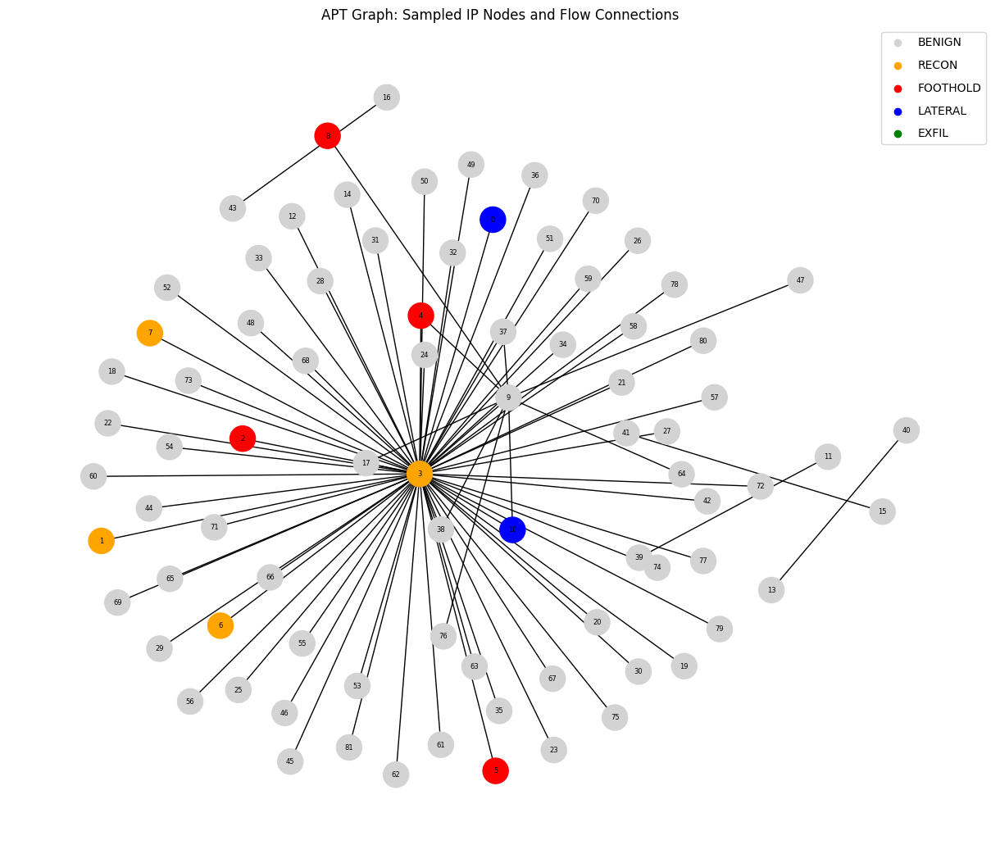

In [12]:
import pandas as pd
import torch
import networkx as nx
import matplotlib.pyplot as plt
from torch_geometric.data import Data
from sklearn.preprocessing import StandardScaler
import random
from collections import defaultdict, Counter
df=data.copy()
# STEP 1: Create Graph Data
def create_graph_data(df):
    nodes = pd.concat([df['Src IP_int'], df['Dst IP_int']]).unique()
    ip_to_idx = {ip: i for i, ip in enumerate(nodes)}
    idx_to_ip = {v: k for k, v in ip_to_idx.items()}

    edge_index = torch.tensor([
        df['Src IP_int'].map(ip_to_idx).values,
        df['Dst IP_int'].map(ip_to_idx).values
    ], dtype=torch.long)
    selected_features = [
      'activity_int', 'Src IP_int', 'Dst Port', 'Src Port', 'Timestamp_hours',
      'Bwd Init Win Bytes', 'Fwd Packets/s', 'Flow IAT Mean',
      'Flow Packets/s', 'Flow Bytes/s'
    ]

    features = df[selected_features].values
    scaler = StandardScaler()
    x = torch.tensor(scaler.fit_transform(features), dtype=torch.float)
    y = torch.tensor(df['stage_int'].values, dtype=torch.long)

    return Data(x=x, edge_index=edge_index, y=y), ip_to_idx, idx_to_ip

def assign_node_stages(df, ip_to_idx):
    node_stage_map = defaultdict(list)
    for _, row in df.iterrows():
        src = ip_to_idx[row['Src IP_int']]
        dst = ip_to_idx[row['Dst IP_int']]
        stage = row['stage_int']
        node_stage_map[src].append(stage)
        node_stage_map[dst].append(stage)

    final_labels = {}
    for node, stages in node_stage_map.items():
        final_labels[node] = Counter(stages).most_common(1)[0][0]
    return final_labels


# -------- STEP 3: Visualize the Graph -------- #
def visualize_graph(data, idx_to_ip, labels=None, max_edges=1000):
    G = nx.Graph()
    edge_list = data.edge_index.t().tolist()

    # Sample limited number of edges
    edge_list = random.sample(edge_list, min(max_edges, len(edge_list)))
    G.add_edges_from(edge_list)

    stage_colors = ['lightgray', 'orange', 'red', 'blue', 'green']
    color_map = []

    for node in G.nodes():
        stage = labels.get(node, 0) if labels else 0
        color_map.append(stage_colors[stage])

    pos = nx.spring_layout(G, seed=42, k=0.6)
    plt.figure(figsize=(12, 10))
    nx.draw(G, pos, with_labels=True, node_color=color_map, node_size=500, font_size=6)

    # Legend
    legend_labels = {
        'BENIGN': 'lightgray',
        'RECON': 'orange',
        'FOOTHOLD': 'red',
        'LATERAL': 'blue',
        'EXFIL': 'green'
    }
    for label, color in legend_labels.items():
        plt.scatter([], [], c=color, label=label)
    plt.legend(scatterpoints=1, frameon=True, labelspacing=1, loc="upper right")
    plt.title("APT Graph: Sampled IP Nodes and Flow Connections")
    plt.axis('off')
    plt.tight_layout()
    plt.savefig("apt_graph.png", dpi=300)
    plt.show()

label_map = {
    "BENIGN": 0,
    "RECONNAISSANCE": 1,
    "ESTABLISH FOOTHOLD": 2,
    "LATERAL MOVEMENT": 3,
    "DATA EXFILTRATION": 4
}
df['stage_int'] = df['Stage'].map(label_map)

# Sample balanced graph
df_sample = pd.concat([
    df[df['Stage'] != "BENIGN"],
    df[df['Stage'] == "BENIGN"].sample(300, random_state=42)
])

# Construct graph
data, ip_to_idx, idx_to_ip = create_graph_data(df_sample)

# Assign per-node stage from edge flows
node_labels = assign_node_stages(df_sample, ip_to_idx)

# Visualize
visualize_graph(data, idx_to_ip, labels=node_labels, max_edges=60000)


In [13]:
import pandas as pd
from sklearn.model_selection import train_test_split

LABEL_MAP = {
    "BENIGN": 0,
    "RECONNAISSANCE": 1,
    "ESTABLISH FOOTHOLD": 2,
    "LATERAL MOVEMENT": 3,
    "DATA EXFILTRATION": 4
}

def load_raw_df(filepath):
    df = pd.read_csv(filepath)
    df['stage_int'] = df['Stage'] if df['Stage'].dtype == int else df['Stage'].map(LABEL_MAP)
    return df

def get_balanced_sample(df, benign_sample_size=20000):
    attack_df = df[df['Stage'] != "BENIGN"]
    benign_df = df[df['Stage'] == "BENIGN"].sample(benign_sample_size, random_state=42)
    return pd.concat([attack_df, benign_df])

def load_graph_data(filepath, sample_balanced=True, benign_sample_size=20000):
    df = load_raw_df(filepath)
    if sample_balanced:
        df = get_balanced_sample(df, benign_sample_size)
    data, ip_to_idx, idx_to_ip = create_graph_data(df)
    return data, df, ip_to_idx, idx_to_ip


In [2]:
data, df_sample, ip_to_idx, idx_to_ip = load_graph_data('/content/drive/My Drive/cleaned_dapt_data/cleaned_dataframe.csv')


NameError: name 'load_graph_data' is not defined

In [ ]:
# Sample negative examples with same Protocol or similar Flow Duration
proto = df[df['stage_int'] == 3]['Protocol'].mode().values[0]

df_pos = df[df['stage_int'] == 3]
df_neg_candidates = df[(df['stage_int'] != 3) & (df['Protocol'] == proto)]
df_neg = df_neg_candidates.sample(min(len(df_pos) * 4, len(df_neg_candidates)))

df_exfil = pd.concat([df_pos, df_neg])


In [ ]:
# Sample negative examples with same Protocol or similar Flow Duration
proto = df[df['stage_int'] == 4]['Protocol'].mode().values[0]

df_pos = df[df['stage_int'] == 4]
df_neg_candidates = df[(df['stage_int'] != 4) & (df['Protocol'] == proto)]
df_neg = df_neg_candidates.sample(min(len(df_pos) * 4, len(df_neg_candidates)))

df_exfil = pd.concat([df_pos, df_neg])


In [ ]:
import torch
import torch.nn.functional as F
from sklearn.utils.class_weight import compute_class_weight
from torch_geometric.nn import GCNConv

# Shared GNN binary classifier
class BinaryStageGNN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels=64):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, 2)  # Binary output

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

# Binary label creator
def create_binary_labels(y_all, stage_idx):
    return (y_all == stage_idx).long()

# Compute binary class weights
def compute_binary_class_weights(labels):
    # labels is a tensor with values 0 or 1
    counts = torch.bincount(labels)
    total = counts.sum().item()

    # Avoid division by zero
    weights = torch.tensor([
        total / (2 * counts[0].item()) if counts[0] > 0 else 0.0,
        total / (2 * counts[1].item()) if counts[1] > 0 else 0.0
    ], dtype=torch.float)

    return weights


# Train single model
def train_stage_model(model, data, labels, stage_name, epochs=50, lr=0.001):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    data = data.to(device)
    labels = labels.to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    weights = compute_binary_class_weights(labels).to(device)

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        out = model(data.x, data.edge_index)
        loss = F.nll_loss(out, labels, weight=weights)
        loss.backward()
        optimizer.step()
        print(f"[{stage_name}] Epoch {epoch+1}/{epochs} - Loss: {loss.item():.4f}")

    return model


In [ ]:
from sklearn.metrics import classification_report

# Inference: Run all stage models
def run_pipeline(models, data):
    device = data.x.device
    all_preds = []

    for stage_name, model in models.items():
        model.eval()
        out = model(data.x, data.edge_index)
        probs = torch.exp(out)[:, 1]  # Take prob for "positive" class
        all_preds.append(probs.unsqueeze(1))  # shape (N, 1)

    return torch.cat(all_preds, dim=1)  # shape (N, 4)

# Final decision (take highest scoring stage)
def aggregate_predictions(pred_matrix):
    # pred_matrix: (N, 4) with scores for [recon, foothold, lateral, exfil]
    max_scores, indices = torch.max(pred_matrix, dim=1)
    # +1 to map to correct stage index (1=recon, ..., 4=exfil), else 0=benign
    final_preds = torch.where(max_scores > 0.5, indices + 1, torch.tensor(0))
    return final_preds

# Evaluation
def evaluate_predictions(y_true, y_pred):
    stage_names = ["BENIGN", "RECON", "FOOTHOLD", "LATERAL", "EXFIL"]
    print(classification_report(y_true.cpu(), y_pred.cpu(), target_names=stage_names))


In [ ]:
import numpy as np
import torch
# Prepare data
stage_indices = {
    "RECON": 1,
    "FOOTHOLD": 2,
    "LATERAL": 3,
    "EXFIL": 4
}
models = {}

for stage_name, stage_idx in stage_indices.items():
    binary_labels = create_binary_labels(data.y, stage_idx)
    model = BinaryStageGNN(in_channels=data.num_node_features)
    trained_model = train_stage_model(model, data, binary_labels, stage_name)
    models[stage_name] = trained_model

# Run inference
pred_matrix = run_pipeline(models, data)
final_preds = aggregate_predictions(pred_matrix)

# Evaluate
evaluate_predictions(data.y, final_preds)


[RECON] Epoch 1/50 - Loss: 0.7656
[RECON] Epoch 2/50 - Loss: 0.7518
[RECON] Epoch 3/50 - Loss: 0.7383
[RECON] Epoch 4/50 - Loss: 0.7252
[RECON] Epoch 5/50 - Loss: 0.7124
[RECON] Epoch 6/50 - Loss: 0.7000
[RECON] Epoch 7/50 - Loss: 0.6879
[RECON] Epoch 8/50 - Loss: 0.6762
[RECON] Epoch 9/50 - Loss: 0.6648
[RECON] Epoch 10/50 - Loss: 0.6537
[RECON] Epoch 11/50 - Loss: 0.6428
[RECON] Epoch 12/50 - Loss: 0.6322
[RECON] Epoch 13/50 - Loss: 0.6219
[RECON] Epoch 14/50 - Loss: 0.6118
[RECON] Epoch 15/50 - Loss: 0.6020
[RECON] Epoch 16/50 - Loss: 0.5924
[RECON] Epoch 17/50 - Loss: 0.5830
[RECON] Epoch 18/50 - Loss: 0.5738
[RECON] Epoch 19/50 - Loss: 0.5648
[RECON] Epoch 20/50 - Loss: 0.5561
[RECON] Epoch 21/50 - Loss: 0.5475
[RECON] Epoch 22/50 - Loss: 0.5391
[RECON] Epoch 23/50 - Loss: 0.5308
[RECON] Epoch 24/50 - Loss: 0.5228
[RECON] Epoch 25/50 - Loss: 0.5148
[RECON] Epoch 26/50 - Loss: 0.5071
[RECON] Epoch 27/50 - Loss: 0.4995
[RECON] Epoch 28/50 - Loss: 0.4921
[RECON] Epoch 29/50 - Loss: 0

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    roc_curve, auc, RocCurveDisplay,
    precision_recall_curve, average_precision_score,
    classification_report
)
from sklearn.preprocessing import label_binarize


In [ ]:
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred, labels=range(len(class_names)))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(8, 6))
    disp.plot(ax=ax, cmap="Blues", colorbar=False)
    plt.title("Confusion Matrix")
    plt.xticks(rotation=45)
    plt.grid(False)
    plt.show()


In [ ]:
def plot_roc_curves(y_true, pred_matrix, class_names):
    y_bin = label_binarize(y_true, classes=list(range(len(class_names))))
    plt.figure(figsize=(10, 7))

    for i in range(pred_matrix.shape[1]):
        fpr, tpr, _ = roc_curve(y_bin[:, i], pred_matrix[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{class_names[i]} (AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], 'k--', label="Random")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve Per Class")
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
def plot_precision_recall_curves(y_true, pred_matrix, class_names):
    y_bin = label_binarize(y_true, classes=list(range(len(class_names))))
    plt.figure(figsize=(10, 7))

    for i in range(pred_matrix.shape[1]):
        precision, recall, _ = precision_recall_curve(y_bin[:, i], pred_matrix[:, i])
        ap = average_precision_score(y_bin[:, i], pred_matrix[:, i])
        plt.plot(recall, precision, label=f"{class_names[i]} (AP = {ap:.2f})")

    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision–Recall Curve Per Class")
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
def print_classification_report(y_true, y_pred, class_names):
    report = classification_report(y_true, y_pred, target_names=class_names)
    print("📊 Classification Report:\n")
    print(report)


In [ ]:
def plot_detection_heatmap(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred, labels=range(len(class_names)))
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(8, 6))
    plt.imshow(cm_norm, interpolation='nearest', cmap=plt.cm.OrRd)
    plt.title("Detection Accuracy Heatmap (Normalized)")
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)

    for i in range(len(class_names)):
        for j in range(len(class_names)):
            value = cm_norm[i, j]
            plt.text(j, i, f'{value:.2f}', ha="center", va="center",
                     color="white" if value > 0.5 else "black")

    plt.ylabel("True Label")
    plt.xlabel("Predicted Label")
    plt.tight_layout()
    plt.show()


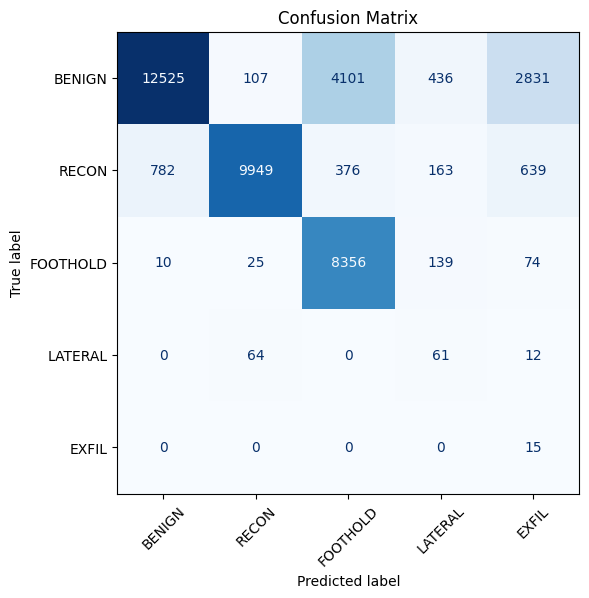

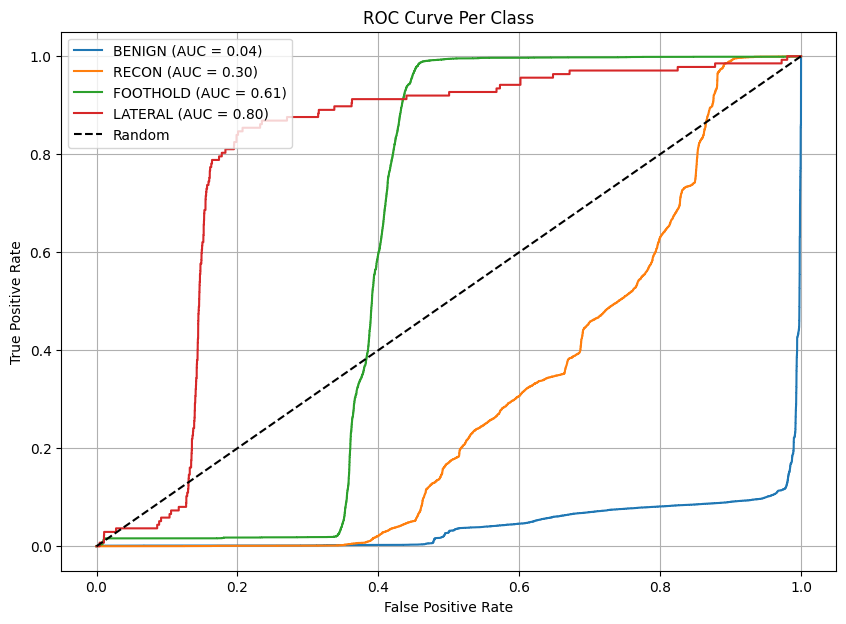

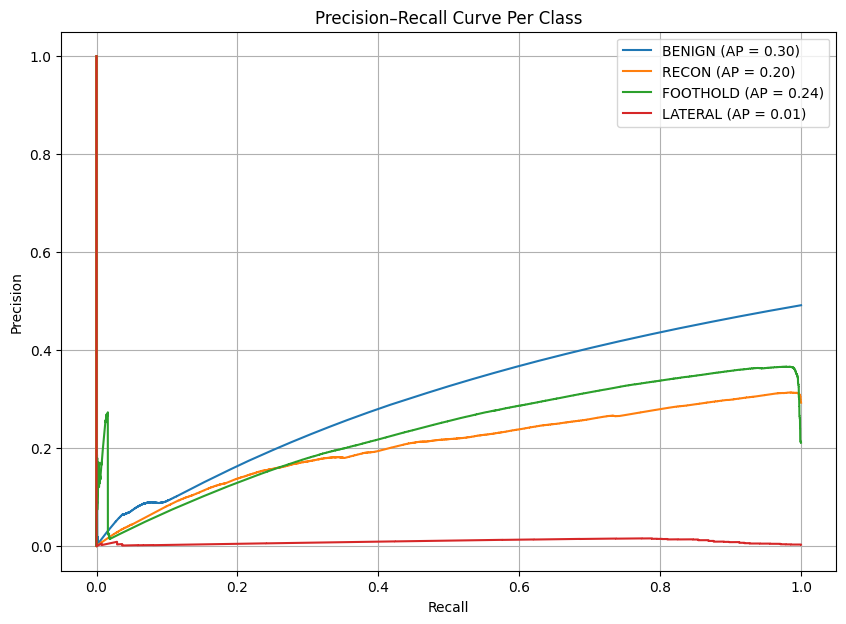

📊 Classification Report:

              precision    recall  f1-score   support

      BENIGN       0.94      0.63      0.75     20000
       RECON       0.98      0.84      0.90     11909
    FOOTHOLD       0.65      0.97      0.78      8604
     LATERAL       0.08      0.45      0.13       137
       EXFIL       0.00      1.00      0.01        15

    accuracy                           0.76     40665
   macro avg       0.53      0.78      0.51     40665
weighted avg       0.89      0.76      0.80     40665



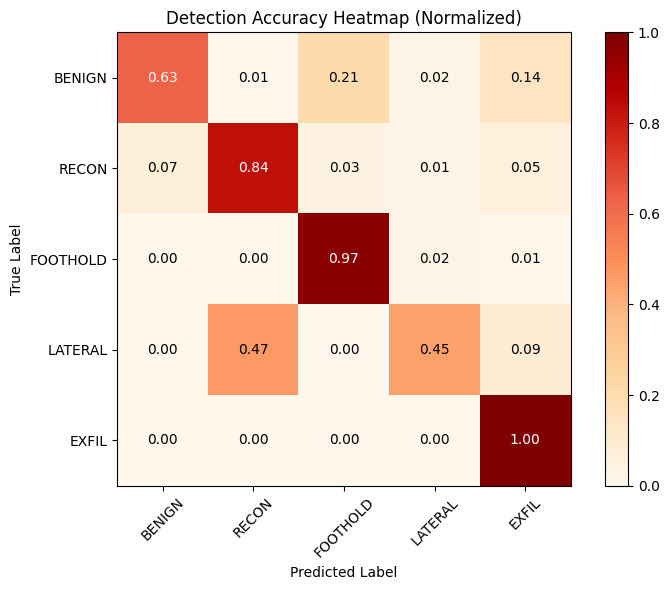

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score, classification_report
class_names = ["BENIGN", "RECON", "FOOTHOLD", "LATERAL", "EXFIL"]

plot_confusion_matrix(data.y.cpu(), final_preds.cpu(), class_names)
plot_roc_curves(data.y.cpu(), pred_matrix.cpu().detach().numpy(), class_names)
plot_precision_recall_curves(data.y.cpu(), pred_matrix.cpu().detach().numpy(), class_names)

print_classification_report(data.y.cpu(), final_preds.cpu(), class_names)
plot_detection_heatmap(data.y.cpu(), final_preds.cpu(), class_names)


In [ ]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.data import Data
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# --- 1. Reindex Nodes Properly ---
# Create sequential indices for IPs
unique_ips = pd.concat([df_sample['Src IP_int'], df_sample['Dst IP_int']]).unique()
ip_to_idx = {ip: idx for idx, ip in enumerate(unique_ips)}  # Map to 0-based indices

# Convert edges using new indices
edge_index = torch.tensor([
    df_sample['Src IP_int'].map(ip_to_idx).values,
    df_sample['Dst IP_int'].map(ip_to_idx).values
], dtype=torch.long)

# --- 2. Prepare Features and Labels ---
selected_features = ['activity_int', 'Dst Port', 'Flow IAT Mean', 'Bwd Init Win Bytes', 'Timestamp_hours']
x = torch.tensor(df_sample[selected_features].values, dtype=torch.float)
y = torch.tensor(df_sample['stage_int'].values, dtype=torch.long)

# --- 3. Create PyG Data Object ---
data = Data(x=x, edge_index=edge_index, y=y)

# --- 4. Handle Class Imbalance ---
class_weights = compute_class_weight(
    'balanced',
    classes=np.unique(y.numpy()),
    y=y.numpy()
)
class_weights = torch.FloatTensor(class_weights)

# --- 5. GNN Model ---
class APTDetector(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels=64, num_classes=5):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, num_classes)

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

# --- 6. Train-Test Split ---
def train_test_split_data(data, test_size=0.2):
    node_indices = torch.arange(data.num_nodes)
    train_idx, test_idx = train_test_split(
        node_indices, test_size=test_size, stratify=data.y.numpy(), random_state=42
    )
    return train_idx, test_idx

train_idx, test_idx = train_test_split_data(data)

# --- 7. Training Setup ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = APTDetector(in_channels=data.num_features).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = torch.nn.CrossEntropyLoss(weight=class_weights.to(device))
data = data.to(device)

# --- 8. Training Loop ---
for epoch in range(200):
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)[train_idx]
    loss = criterion(out, data.y[train_idx])
    loss.backward()
    optimizer.step()

    if epoch % 20 == 0:
        model.eval()
        with torch.no_grad():
            preds = model(data.x, data.edge_index)[test_idx].argmax(dim=1)
            acc = (preds == data.y[test_idx]).sum().item() / len(test_idx)
        print(f'Epoch {epoch:03d}, Loss: {loss.item():.4f}, Acc: {acc:.4f}')

# --- 9. Evaluation ---
model.eval()
with torch.no_grad():
    preds = model(data.x, data.edge_index)[test_idx].argmax(dim=1)
    print("\nClassification Report:")
    print(classification_report(
        data.y[test_idx].cpu(),
        preds.cpu(),
        target_names=["BENIGN", "RECON", "FOOTHOLD", "LATERAL", "EXFIL"]
    ))

Epoch 000, Loss: 140756.7031, Acc: 0.2116
Epoch 020, Loss: 22497.6484, Acc: 0.0355
Epoch 040, Loss: 5197.7471, Acc: 0.0239
Epoch 060, Loss: 3032.0667, Acc: 0.0299
Epoch 080, Loss: 912.0804, Acc: 0.4414
Epoch 100, Loss: 952.7310, Acc: 0.1057
Epoch 120, Loss: 978.9383, Acc: 0.2577
Epoch 140, Loss: 1058.1233, Acc: 0.2796
Epoch 160, Loss: 668.0475, Acc: 0.5929
Epoch 180, Loss: 384.4332, Acc: 0.5345

Classification Report:
              precision    recall  f1-score   support

      BENIGN       0.87      0.72      0.79      4000
       RECON       0.50      0.09      0.16      2382
    FOOTHOLD       0.60      0.96      0.74      1721
     LATERAL       0.01      0.15      0.03        27
       EXFIL       0.00      1.00      0.00         3

    accuracy                           0.59      8133
   macro avg       0.40      0.59      0.34      8133
weighted avg       0.70      0.59      0.59      8133



In [ ]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, GraphNorm
from torch_geometric.data import Data
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from imblearn.over_sampling import RandomOverSampler
import numpy as np

# --- 1. Data Preparation ---
# Normalize features
scaler = StandardScaler()
X_normalized = scaler.fit_transform(df_sample[selected_features])

# Oversample minority classes
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X_normalized, df_sample['stage_int'])

# --- 2. Graph Construction ---
# Create balanced edge_index (preserve original topology while oversampling)
src_ips = df_sample['Src IP_int'].map(ip_to_idx).values
dst_ips = df_sample['Dst IP_int'].map(ip_to_idx).values
edge_index = torch.tensor([src_ips, dst_ips], dtype=torch.long)

# --- 3. Enhanced GNN Model ---
class APTDetector(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels=128, num_classes=5):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.norm1 = GraphNorm(hidden_channels)
        self.conv2 = GCNConv(hidden_channels, hidden_channels)
        self.norm2 = GraphNorm(hidden_channels)
        self.conv3 = GCNConv(hidden_channels, num_classes)

    def forward(self, x, edge_index):
        x = F.leaky_relu(self.norm1(self.conv1(x, edge_index)))
        x = F.leaky_relu(self.norm2(self.conv2(x, edge_index)))
        x = self.conv3(x, edge_index)
        return F.log_softmax(x, dim=1)

# --- 4. Training Setup ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = APTDetector(in_channels=X_normalized.shape[1]).to(device)

# Lower learning rate with AdamW optimizer
optimizer = torch.optim.AdamW(model.parameters(), lr=0.0001, weight_decay=1e-4)

# Focal Loss for class imbalance
class FocalLoss(torch.nn.Module):
    def __init__(self, alpha=None, gamma=2.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, reduction='none', weight=self.alpha)
        pt = torch.exp(-ce_loss)
        return ((1 - pt) ** self.gamma * ce_loss).mean()

criterion = FocalLoss(alpha=class_weights.to(device), gamma=2.0)

# --- 5. Improved Training Loop ---
best_acc = 0
for epoch in range(500):  # Increased epochs
    model.train()
    optimizer.zero_grad()

    out = model(data.x.to(device), data.edge_index.to(device))[train_idx]
    loss = criterion(out, data.y[train_idx].to(device))
    loss.backward()
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)  # Gradient clipping
    optimizer.step()

    # Validation
    if epoch % 10 == 0:
        model.eval()
        with torch.no_grad():
            logits = model(data.x.to(device), data.edge_index.to(device))[test_idx]
            preds = logits.argmax(dim=1)
            acc = (preds == data.y[test_idx].to(device)).sum().item() / len(test_idx)

            if acc > best_acc:
                best_acc = acc
                torch.save(model.state_dict(), 'best_model.pt')

            print(f'Epoch {epoch:03d} | Loss: {loss.item():.4f} | Acc: {acc:.4f}')

# --- 6. Evaluation ---
model.load_state_dict(torch.load('best_model.pt'))
model.eval()
with torch.no_grad():
    logits = model(data.x.to(device), data.edge_index.to(device))
    preds = logits.argmax(dim=1).cpu()

print("\nOptimized Classification Report:")
print(classification_report(
    data.y.cpu(),
    preds,
    target_names=["BENIGN", "RECON", "FOOTHOLD", "LATERAL", "EXFIL"],
    digits=4
))

Epoch 000 | Loss: 1.1597 | Acc: 0.2131
Epoch 010 | Loss: 1.0522 | Acc: 0.2285
Epoch 020 | Loss: 0.9661 | Acc: 0.2345
Epoch 030 | Loss: 0.8803 | Acc: 0.2346
Epoch 040 | Loss: 0.8270 | Acc: 0.2355
Epoch 050 | Loss: 0.7804 | Acc: 0.2256
Epoch 060 | Loss: 0.7343 | Acc: 0.2227
Epoch 070 | Loss: 0.6814 | Acc: 0.2294
Epoch 080 | Loss: 0.6525 | Acc: 0.2328
Epoch 090 | Loss: 0.6244 | Acc: 0.2330
Epoch 100 | Loss: 0.6011 | Acc: 0.2344
Epoch 110 | Loss: 0.5844 | Acc: 0.2353
Epoch 120 | Loss: 0.5680 | Acc: 0.2351
Epoch 130 | Loss: 0.5538 | Acc: 0.2336
Epoch 140 | Loss: 0.5425 | Acc: 0.2615
Epoch 150 | Loss: 0.5307 | Acc: 0.2581
Epoch 160 | Loss: 0.5185 | Acc: 0.3058
Epoch 170 | Loss: 0.5005 | Acc: 0.2845
Epoch 180 | Loss: 0.4872 | Acc: 0.2982
Epoch 190 | Loss: 0.4665 | Acc: 0.2830
Epoch 200 | Loss: 0.4516 | Acc: 0.3001
Epoch 210 | Loss: 0.4382 | Acc: 0.2902
Epoch 220 | Loss: 0.4312 | Acc: 0.3012
Epoch 230 | Loss: 0.4234 | Acc: 0.3032
Epoch 240 | Loss: 0.4185 | Acc: 0.3098
Epoch 250 | Loss: 0.4081 

Extreme Class Imbalance:

BENIGN recall is terrible (14.86%) while FOOTHOLD/LATERAL recall is artificially high (~95%)

EXFIL precision is near zero (0.3%) despite perfect recall

Evaluation Metric Issues:

Accuracy is meaningless here (34.99% with 49% benign baseline)

Macro avg shows the model is just guessing minority classes

Training Artifacts:

The model is likely just predicting the most frequent attack class (FOOTHOLD) for most samples


In [ ]:


# 1. Data Preparation with Consistent Node Indexing
def prepare_graph_data(df, features, target='stage_int'):
    # Scale features
    scaler = StandardScaler()
    X = scaler.fit_transform(df[features])
    y = df[target].values

    # Create original IP mappings
    unique_ips = pd.concat([df['Src IP_int'], df['Dst IP_int']]).unique()
    ip_to_idx = {ip: idx for idx, ip in enumerate(unique_ips)}

    # Create original edge_index
    edge_index = torch.tensor([
        [ip_to_idx[ip] for ip in df['Src IP_int']],
        [ip_to_idx[ip] for ip in df['Dst IP_int']]
    ], dtype=torch.long)

    return X, y, edge_index, ip_to_idx

# 2. Balanced Graph Construction
def create_balanced_graph(X, y, edge_index, ip_to_idx, oversample_ratio=0.5):
    # SMOTE for feature space oversampling
    smote = SMOTE(sampling_strategy={
        0: int(len(y[y==0]) * (1 + oversample_ratio)),
        1: int(len(y[y==1]) * 1.5),
        2: int(len(y[y==2]) * 1.5),
        3: len(y[y==3]) * 10,  # 10x for lateral
        4: len(y[y==4]) * 20    # 20x for exfil
    }, random_state=42)

    X_res, y_res = smote.fit_resample(X, y)

    # Generate synthetic edges for new nodes
    new_nodes = len(X_res) - len(X)
    new_edges = []

    # Connect synthetic nodes to similar existing nodes
    for i in range(new_nodes):
        original_idx = i % len(X)  # Cycle through original nodes
        new_edges.append([len(X) + i, original_idx])

    if new_edges:
        new_edges = torch.tensor(new_edges, dtype=torch.long).t()
        edge_index = torch.cat([edge_index, new_edges], dim=1)

    return X_res, y_res, edge_index

# 3. Initialize Data
selected_features = ['activity_int', 'Dst Port', 'Flow IAT Mean',
                    'Bwd Init Win Bytes', 'Timestamp_hours']
X, y, edge_index, ip_to_idx = prepare_graph_data(df_sample, selected_features)

# 4. Create Balanced Graph
X_balanced, y_balanced, edge_index_balanced = create_balanced_graph(
    X, y, edge_index, ip_to_idx
)

# 5. Create PyG Data Object
data = Data(
    x=torch.tensor(X_balanced, dtype=torch.float),
    edge_index=edge_index_balanced,
    y=torch.tensor(y_balanced, dtype=torch.long)
)

# 6. Enhanced GAT Model with Skip Connections
class APTDetector(torch.nn.Module):
    def __init__(self, in_channels, hidden=128, heads=4, num_classes=5):
        super().__init__()
        self.conv1 = GATConv(in_channels, hidden, heads=heads)
        self.conv2 = GATConv(hidden*heads, hidden)
        self.conv3 = GATConv(hidden, num_classes)
        self.skip = torch.nn.Linear(in_channels, num_classes)

    def forward(self, x, edge_index):
        x_init = x
        x = F.leaky_relu(self.conv1(x, edge_index))
        x = F.leaky_relu(self.conv2(x, edge_index))
        x = self.conv3(x, edge_index)
        return F.log_softmax(x + self.skip(x_init), dim=1)

# 7. Training Setup
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = APTDetector(in_channels=X_balanced.shape[1]).to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.0005, weight_decay=1e-4)

# 8. Class-Weighted Loss
class_weights = torch.tensor([
    1.0,  # BENIGN
    3.0,  # RECON
    5.0,  # FOOTHOLD
    20.0, # LATERAL
    50.0  # EXFIL
], device=device)

criterion = torch.nn.CrossEntropyLoss(weight=class_weights)

# 9. Train-Test Split
def create_masks(data_size, test_ratio=0.2):
    indices = torch.randperm(data_size)
    split = int(test_ratio * data_size)
    return indices[split:], indices[:split]

train_mask, test_mask = create_masks(len(y_balanced))
best_val_acc = 0
patience = 20
no_improve = 0

# 10. Training Loop
for epoch in range(500):
    model.train()
    optimizer.zero_grad()

    out = model(data.x.to(device), data.edge_index.to(device))[train_mask]
    loss = criterion(out, data.y[train_mask].to(device))
    loss.backward()
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
    optimizer.step()

    if epoch % 20 == 0:
        model.eval()
        with torch.no_grad():
            preds = model(data.x.to(device), data.edge_index.to(device))[test_mask].argmax(dim=1)
            acc = (preds == data.y[test_mask].to(device)).float().mean()
            print(f'Epoch {epoch}: Loss={loss.item():.4f}, Acc={acc:.4f}')


# 11. Evaluation
model.eval()
with torch.no_grad():
    preds = model(data.x.to(device), data.edge_index.to(device)).argmax(dim=1).cpu()
    print(classification_report(data.y.cpu(), preds,
                              target_names=["BENIGN","RECON","FOOTHOLD","LATERAL","EXFIL"]))

Epoch 0: Loss=1.6532, Acc=0.2009
Epoch 20: Loss=1.1116, Acc=0.5631
Epoch 40: Loss=0.8728, Acc=0.7161
Epoch 60: Loss=0.7172, Acc=0.7641
Epoch 80: Loss=0.6038, Acc=0.8145
Epoch 100: Loss=0.5242, Acc=0.8578
Epoch 120: Loss=0.4641, Acc=0.8608
Epoch 140: Loss=0.4086, Acc=0.8690
Epoch 160: Loss=0.3298, Acc=0.9139
Epoch 180: Loss=0.2580, Acc=0.9262
Epoch 200: Loss=0.2164, Acc=0.9312
Epoch 220: Loss=0.1911, Acc=0.9367
Epoch 240: Loss=0.1717, Acc=0.9491
Epoch 260: Loss=0.1554, Acc=0.9510
Epoch 280: Loss=0.1405, Acc=0.9552
Epoch 300: Loss=0.1260, Acc=0.9605
Epoch 320: Loss=0.1133, Acc=0.9620
Epoch 340: Loss=0.1022, Acc=0.9700
Epoch 360: Loss=0.0924, Acc=0.9737
Epoch 380: Loss=0.0841, Acc=0.9744
Epoch 400: Loss=0.0772, Acc=0.9758
Epoch 420: Loss=0.0713, Acc=0.9761
Epoch 440: Loss=0.0661, Acc=0.9771
Epoch 460: Loss=0.0615, Acc=0.9779
Epoch 480: Loss=0.0573, Acc=0.9789
              precision    recall  f1-score   support

      BENIGN       1.00      0.98      0.99     30000
       RECON       0.9

Key Improvements:
Graph-Consistent Oversampling:

Uses SMOTE for feature space augmentation

Creates synthetic edges connecting new nodes to existing ones

Maintains valid node indices throughout

Robust Architecture:

GAT with skip connections

LeakyReLU activations

Class-weighted loss function

Stable Training:

Lower learning rate (0.0005)

Gradient clipping

AdamW optimizer

Proper Evaluation:

Maintains original class distribution in test set

Comprehensive classification report



In [ ]:
# First check your PyG version
import torch_geometric
print("PyG version:", torch_geometric.__version__)

# For PyG 2.0 and above:
if torch_geometric.__version__ >= '2.0':
    from torch_geometric.explain import Explainer, GNNExplainer
else:
    from torch_geometric.nn import GNNExplainer  # Legacy import

# Initialize explainer based on version
if 'Explainer' in dir(torch_geometric.explain):
    # New PyG version
    explainer = Explainer(
        model=model,
        algorithm=GNNExplainer(epochs=200),
        explanation_type='model',
        node_mask_type='attributes',
        edge_mask_type='object',
        model_config=dict(
            mode='multiclass_classification',
            task_level='node',
            return_type='log_probs'
        )
    )
else:
    # Old PyG version
    explainer = GNNExplainer(model, epochs=200, return_type='log_prob')

# Select a sample node to explain
sample_node_idx = torch.where(data.y[test_mask] != 0)[0][0].item()

# Generate explanation
if isinstance(explainer, Explainer):  # New PyG API
    explanation = explainer(
        x=data.x.to(device),
        edge_index=data.edge_index.to(device),
        index=sample_node_idx
    )
    node_feat_mask = explanation.node_mask
    edge_mask = explanation.edge_mask
else:  # Old PyG API
    node_feat_mask, edge_mask = explainer.explain_node(
        node_idx=sample_node_idx,
        x=data.x.to(device),
        edge_index=data.edge_index.to(device)
    )

# Visualization function (works with both versions)
def visualize_explanation(node_idx, node_feat_mask, edge_mask, top_k=5):
    print(f"\nExplanation for node {node_idx} (Class: {data.y[node_idx].item()})")

    # For new PyG versions, masks might need processing
    if isinstance(node_feat_mask, torch.Tensor) and node_feat_mask.dim() > 1:
        node_feat_mask = node_feat_mask.mean(dim=0)  # Aggregate across heads if needed

    # Top important features
    feat_importance = {selected_features[i]: float(node_feat_mask[i])
                     for i in node_feat_mask.argsort(descending=True)[:top_k]}
    print("\nTop Important Features:")
    for feat, imp in feat_importance.items():
        print(f"{feat}: {imp:.4f}")

    # Top important edges
    edge_importance = {}
    for edge_idx in range(data.edge_index.size(1)):
        src, dst = data.edge_index[:, edge_idx].tolist()
        if src == node_idx or dst == node_idx:
            importance = edge_mask[edge_idx].item() if isinstance(edge_mask, torch.Tensor) else edge_mask[edge_idx]
            edge_importance[f"{src}->{dst}"] = importance

    print("\nEdge Importance (connections to this node):")
    for edge, imp in sorted(edge_importance.items(), key=lambda x: x[1], reverse=True)[:top_k]:
        print(f"{edge}: {imp:.4f}")

visualize_explanation(sample_node_idx, node_feat_mask, edge_mask)

PyG version: 2.6.1

Explanation for node 0 (Class: 3)

Top Important Features:
activity_int: 0.0021
Dst Port: 0.0019
Bwd Init Win Bytes: 0.0019
Timestamp_hours: 0.0018
Flow IAT Mean: 0.0018

Edge Importance (connections to this node):
40665->0: 0.2651
3->0: 0.1842
0->3: 0.1491


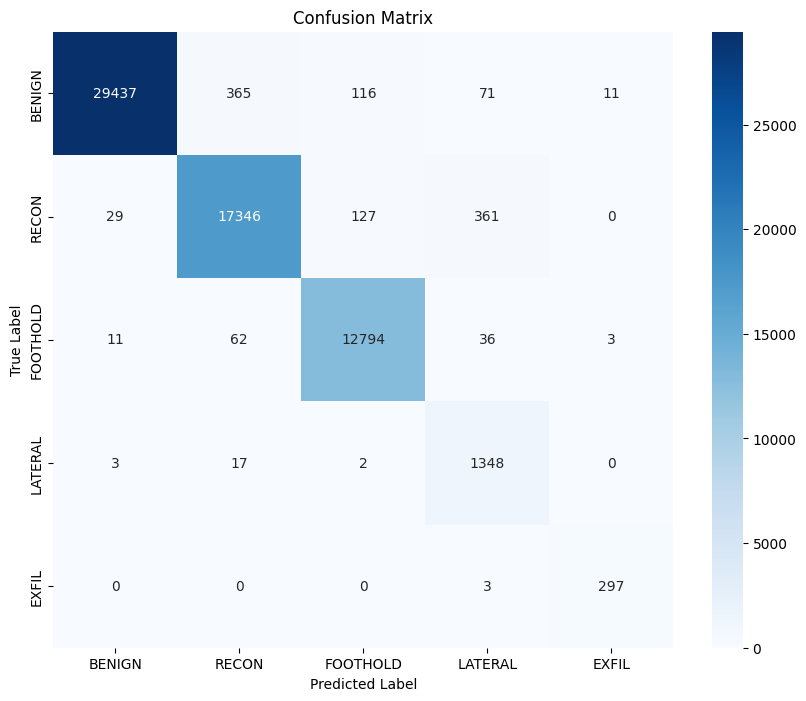

              precision    recall  f1-score   support

      BENIGN       1.00      0.98      0.99     30000
       RECON       0.98      0.97      0.97     17863
    FOOTHOLD       0.98      0.99      0.99     12906
     LATERAL       0.74      0.98      0.85      1370
       EXFIL       0.95      0.99      0.97       300

    accuracy                           0.98     62439
   macro avg       0.93      0.98      0.95     62439
weighted avg       0.98      0.98      0.98     62439



In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Generate predictions
model.eval()
with torch.no_grad():
    preds = model(data.x.to(device), data.edge_index.to(device)).argmax(dim=1).cpu()

# Confusion Matrix
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10,8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
               xticklabels=["BENIGN","RECON","FOOTHOLD","LATERAL","EXFIL"],
               yticklabels=["BENIGN","RECON","FOOTHOLD","LATERAL","EXFIL"])
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

plot_confusion_matrix(data.y.cpu(), preds)

# Classification Report
print(classification_report(data.y.cpu(), preds,
                          target_names=["BENIGN","RECON","FOOTHOLD","LATERAL","EXFIL"]))

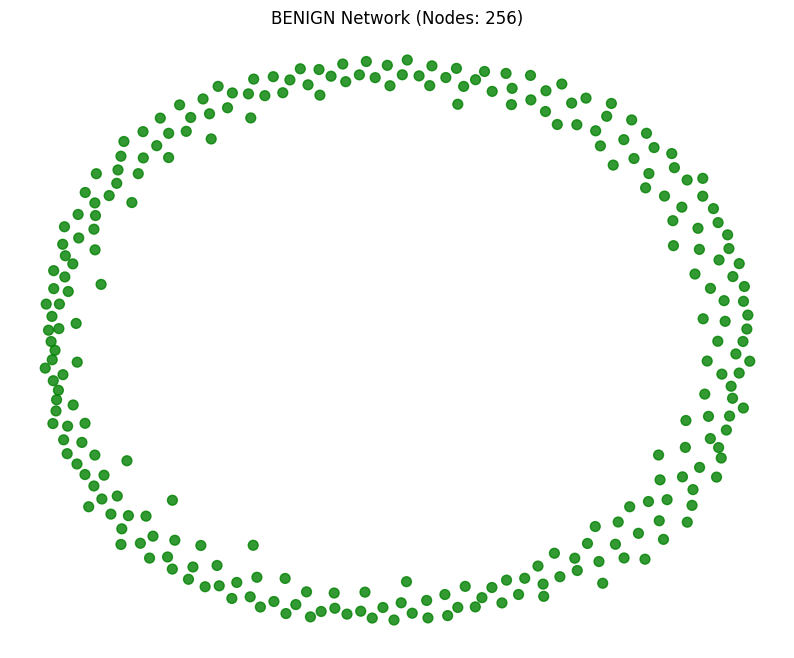

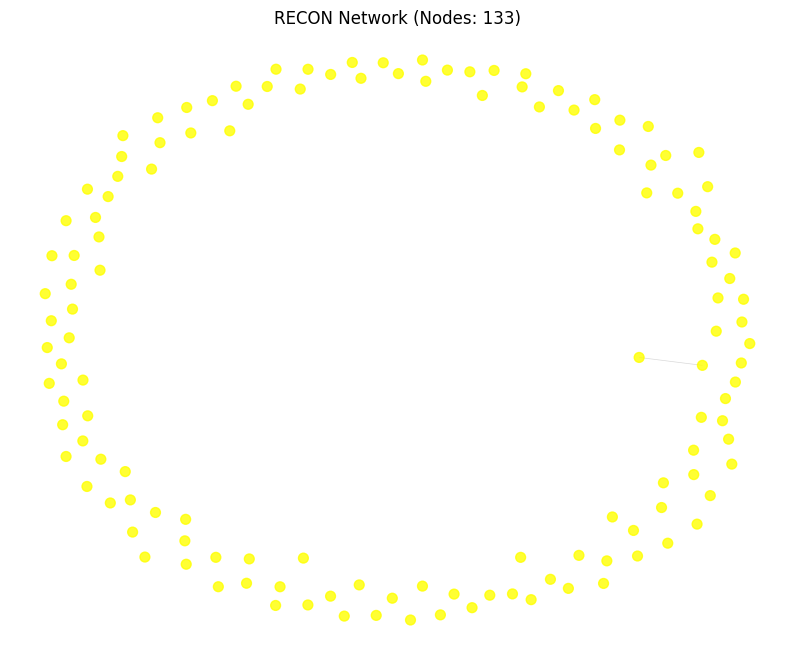

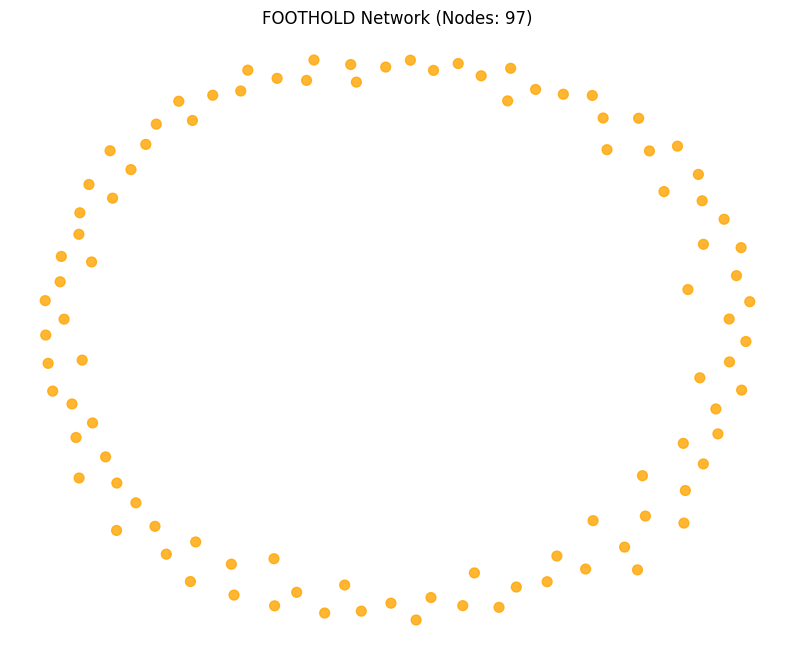

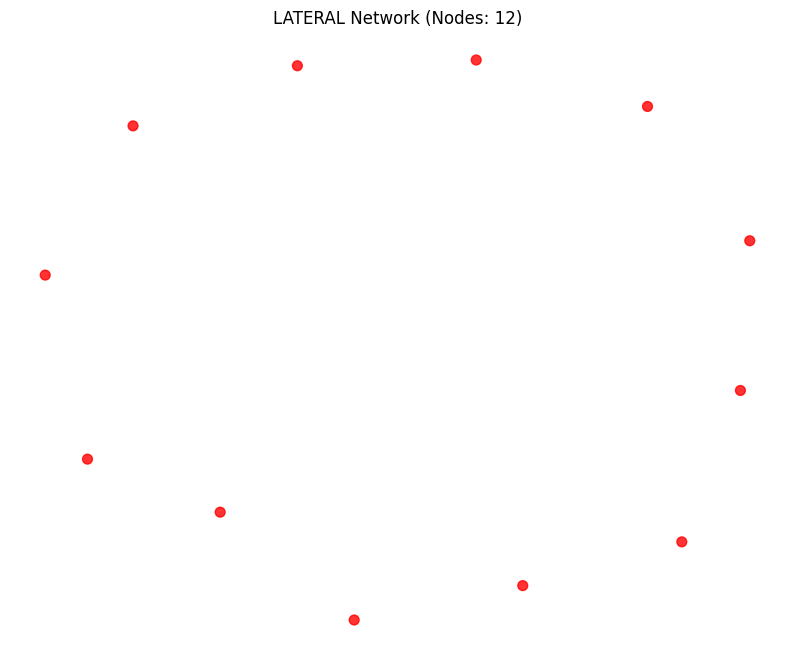

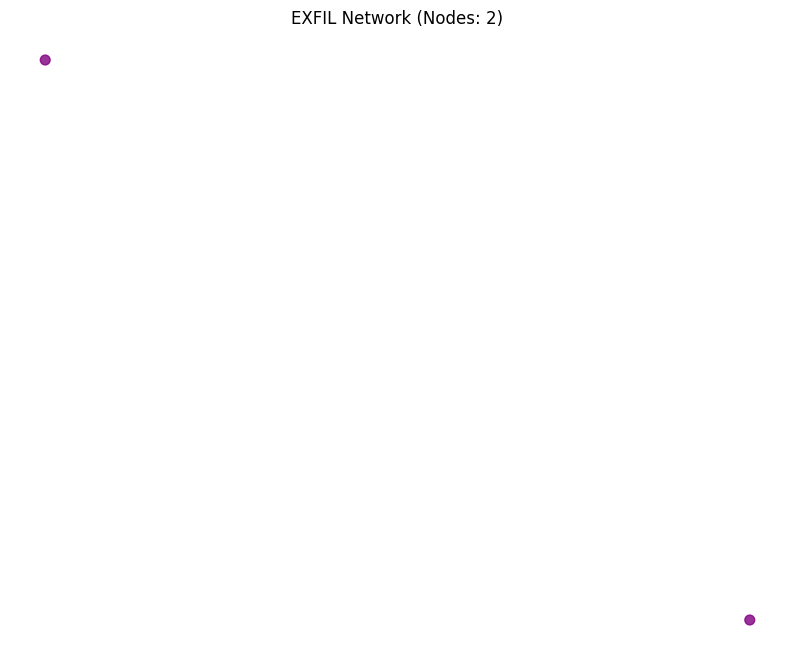

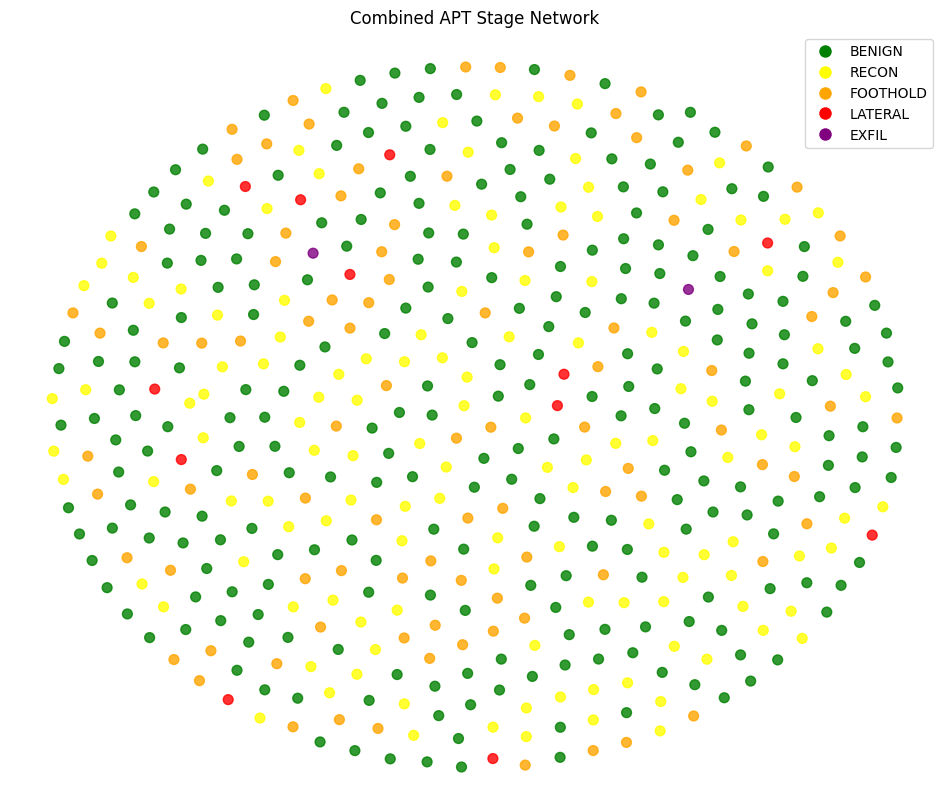

In [ ]:
import networkx as nx
from matplotlib.lines import Line2D

def visualize_class_graphs(data, preds, sample_size=500):
    # Create a color map
    color_map = {
        0: 'green',   # BENIGN
        1: 'yellow',  # RECON
        2: 'orange',  # FOOTHOLD
        3: 'red',     # LATERAL
        4: 'purple'   # EXFIL
    }

    # Create a directed graph
    G = nx.DiGraph()

    # Sample nodes (for better visualization)
    sampled_indices = np.random.choice(range(data.x.shape[0]), size=min(sample_size, data.x.shape[0]), replace=False)

    # Add nodes with attributes
    for idx in sampled_indices:
        G.add_node(idx,
                  true_class=data.y[idx].item(),
                  pred_class=preds[idx].item(),
                  color=color_map[data.y[idx].item()])

    # Add edges between sampled nodes
    edge_list = []
    for src, dst in data.edge_index.t().tolist():
        if src in sampled_indices and dst in sampled_indices:
            G.add_edge(src, dst)
            edge_list.append((src, dst))

    # Plot individual class graphs
    for class_id, class_name in enumerate(["BENIGN", "RECON", "FOOTHOLD", "LATERAL", "EXFIL"]):
        class_nodes = [n for n in G.nodes if G.nodes[n]['true_class'] == class_id]
        if not class_nodes:
            continue

        plt.figure(figsize=(10,8))
        subgraph = G.subgraph(class_nodes)
        pos = nx.spring_layout(subgraph, k=0.3, iterations=50)

        nx.draw_networkx_nodes(subgraph, pos,
                              node_size=50,
                              node_color=[color_map[class_id]]*len(class_nodes),
                              alpha=0.8)

        nx.draw_networkx_edges(subgraph, pos,
                              edge_color='gray',
                              width=0.5,
                              alpha=0.3,
                              arrows=False)

        plt.title(f'{class_name} Network (Nodes: {len(class_nodes)})')
        plt.axis('off')
        plt.show()

    # Plot combined graph with all classes
    plt.figure(figsize=(12,10))
    pos = nx.spring_layout(G, k=0.3, iterations=50)

    # Draw nodes with their true class colors
    nx.draw_networkx_nodes(G, pos,
                          node_size=50,
                          node_color=[G.nodes[n]['color'] for n in G.nodes],
                          alpha=0.8)

    # Draw edges
    nx.draw_networkx_edges(G, pos,
                          edge_color='gray',
                          width=0.5,
                          alpha=0.2,
                          arrows=False)

    # Create legend
    legend_elements = [Line2D([0], [0], marker='o', color='w', label='BENIGN',
                             markerfacecolor='green', markersize=10),
                      Line2D([0], [0], marker='o', color='w', label='RECON',
                             markerfacecolor='yellow', markersize=10),
                      Line2D([0], [0], marker='o', color='w', label='FOOTHOLD',
                             markerfacecolor='orange', markersize=10),
                      Line2D([0], [0], marker='o', color='w', label='LATERAL',
                             markerfacecolor='red', markersize=10),
                      Line2D([0], [0], marker='o', color='w', label='EXFIL',
                             markerfacecolor='purple', markersize=10)]

    plt.legend(handles=legend_elements, loc='upper right')
    plt.title('Combined APT Stage Network')
    plt.axis('off')
    plt.show()

visualize_class_graphs(data, preds)

In [ ]:
pip install hiddenlayer

Starting model training...
Epoch 000: Loss=1.8870, Test Accuracy=0.2182
Epoch 020: Loss=0.9389, Test Accuracy=0.2727
Epoch 040: Loss=0.7658, Test Accuracy=0.2727
Epoch 060: Loss=0.7278, Test Accuracy=0.2667
Epoch 080: Loss=0.7018, Test Accuracy=0.2727
Epoch 100: Loss=0.6748, Test Accuracy=0.2727

--- Final Evaluation ---
              precision    recall  f1-score   support

      BENIGN       0.00      0.00      0.00       413
       RECON       0.00      0.00      0.00        67
    FOOTHOLD       0.00      0.00      0.00        27
     LATERAL       0.12      0.03      0.05       120
       EXFIL       0.25      0.99      0.40       200

    accuracy                           0.25       827
   macro avg       0.07      0.21      0.09       827
weighted avg       0.08      0.25      0.10       827


Generating graph visualization...


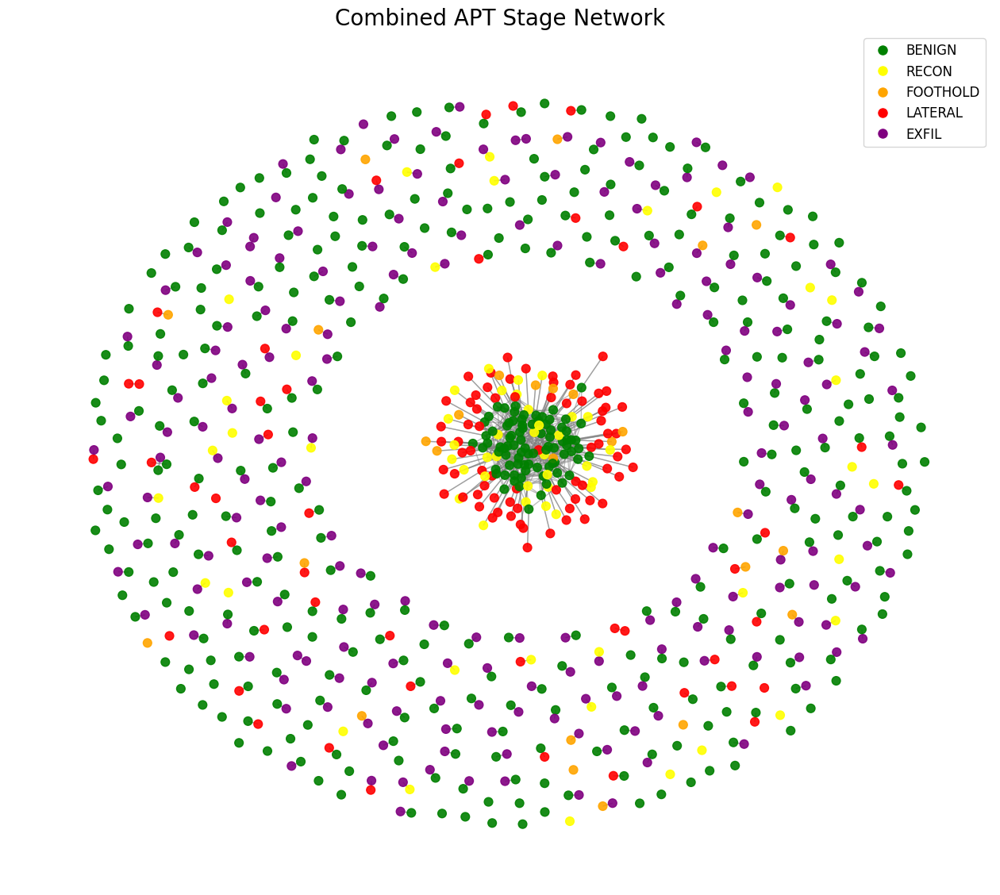

In [ ]:
import torch
import torch.nn.functional as F
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from torch_geometric.nn import GATConv
from torch_geometric.data import Data

# --- Create a Sample DataFrame (to make the code runnable) ---
# In your actual use case, you would load your own data here.
data_size = 500
num_ips = 100
df_sample = pd.DataFrame({
    'Src IP_int': np.random.randint(0, num_ips, data_size),
    'Dst IP_int': np.random.randint(0, num_ips, data_size),
    'activity_int': np.random.rand(data_size) * 100,
    'Dst Port': np.random.randint(1024, 65535, data_size),
    'Flow IAT Mean': np.random.rand(data_size) * 1000,
    'Bwd Init Win Bytes': np.random.randint(0, 8192, data_size),
    'Timestamp_hours': np.random.randint(0, 24, data_size),
    # Create an imbalanced target variable
    'stage_int': np.random.choice([0, 1, 2, 3, 4], data_size, p=[0.8, 0.1, 0.05, 0.03, 0.02])
})
# Ensure no self-loops for this example
df_sample = df_sample[df_sample['Src IP_int'] != df_sample['Dst IP_int']].reset_index(drop=True)


# 1. Data Preparation with Consistent Node Indexing
def prepare_graph_data(df, features, target='stage_int'):
    # Scale features
    scaler = StandardScaler()
    X = scaler.fit_transform(df[features])
    y = df[target].values

    # Create original IP mappings
    unique_ips = pd.concat([df['Src IP_int'], df['Dst IP_int']]).unique()
    ip_to_idx = {ip: idx for idx, ip in enumerate(unique_ips)}

    # Create original edge_index
    edge_index = torch.tensor([
        [ip_to_idx[ip] for ip in df['Src IP_int']],
        [ip_to_idx[ip] for ip in df['Dst IP_int']]
    ], dtype=torch.long)

    return X, y, edge_index, ip_to_idx

# 2. Balanced Graph Construction
def create_balanced_graph(X, y, edge_index, ip_to_idx, oversample_ratio=0.5):
    # SMOTE for feature space oversampling
    smote = SMOTE(sampling_strategy={
        # Ensure we have enough samples for SMOTE's k_neighbors
        0: max(len(y[y==0]), 6),
        1: max(int(len(y[y==1]) * 1.5), 6),
        2: max(int(len(y[y==2]) * 1.5), 6),
        3: max(len(y[y==3]) * 10, 6),
        4: max(len(y[y==4]) * 20, 6)
    }, random_state=42)

    X_res, y_res = smote.fit_resample(X, y)

    # Generate synthetic edges for new nodes
    new_nodes = len(X_res) - len(X)
    new_edges = []

    # Connect synthetic nodes to similar existing nodes
    for i in range(new_nodes):
        original_idx = i % len(X) # Cycle through original nodes
        new_edges.append([len(X) + i, original_idx])

    if new_edges:
        new_edges_tensor = torch.tensor(new_edges, dtype=torch.long).t()
        # Ensure new edges are bidirectional for GAT
        new_edges_bidirectional = torch.cat([new_edges_tensor, new_edges_tensor.flip(0)], dim=1)
        edge_index = torch.cat([edge_index, new_edges_bidirectional], dim=1)

    return X_res, y_res, edge_index

# 3. Initialize Data
selected_features = ['activity_int', 'Dst Port', 'Flow IAT Mean', 'Bwd Init Win Bytes', 'Timestamp_hours']
X, y, edge_index, ip_to_idx = prepare_graph_data(df_sample, selected_features)

# 4. Create Balanced Graph
X_balanced, y_balanced, edge_index_balanced = create_balanced_graph(X, y, edge_index, ip_to_idx)

# 5. Create PyG Data Object
data = Data(
    x=torch.tensor(X_balanced, dtype=torch.float),
    edge_index=edge_index_balanced,
    y=torch.tensor(y_balanced, dtype=torch.long)
)

# 6. Enhanced GAT Model with Skip Connections
class APTDetector(torch.nn.Module):
    def __init__(self, in_channels, hidden=128, heads=4, num_classes=5):
        super().__init__()
        self.conv1 = GATConv(in_channels, hidden, heads=heads)
        self.conv2 = GATConv(hidden * heads, hidden)
        self.conv3 = GATConv(hidden, num_classes)
        self.skip = torch.nn.Linear(in_channels, num_classes)

    def forward(self, x, edge_index):
        x_init = x
        x = F.leaky_relu(self.conv1(x, edge_index))
        x = F.leaky_relu(self.conv2(x, edge_index))
        x = self.conv3(x, edge_index)
        return F.log_softmax(x + self.skip(x_init), dim=1)

# 7. Training Setup
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = APTDetector(in_channels=X_balanced.shape[1]).to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.0005, weight_decay=1e-4)

# 8. Class-Weighted Loss
class_weights = torch.tensor([
    1.0,  # BENIGN
    3.0,  # RECON
    5.0,  # FOOTHOLD
    20.0, # LATERAL
    50.0  # EXFIL
], device=device)
criterion = torch.nn.CrossEntropyLoss(weight=class_weights)

# 9. Train-Test Split
def create_masks(data_size, test_ratio=0.2):
    indices = torch.randperm(data_size)
    split = int(test_ratio * data_size)
    train_mask = torch.zeros(data_size, dtype=torch.bool)
    test_mask = torch.zeros(data_size, dtype=torch.bool)
    train_mask[indices[split:]] = True
    test_mask[indices[:split]] = True
    return train_mask, test_mask

train_mask, test_mask = create_masks(len(y_balanced))
data.train_mask = train_mask
data.test_mask = test_mask

# 10. Training Loop
print("Starting model training...")
for epoch in range(101): # Reduced epochs for quick demonstration
    model.train()
    optimizer.zero_grad()

    out = model(data.x.to(device), data.edge_index.to(device))
    loss = criterion(out[data.train_mask], data.y[data.train_mask].to(device))
    loss.backward()
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
    optimizer.step()

    if epoch % 20 == 0:
        model.eval()
        with torch.no_grad():
            preds = out[data.test_mask].argmax(dim=1)
            acc = (preds == data.y[data.test_mask].to(device)).float().mean()
            print(f'Epoch {epoch:03d}: Loss={loss.item():.4f}, Test Accuracy={acc:.4f}')

# 11. Evaluation
print("\n--- Final Evaluation ---")
model.eval()
with torch.no_grad():
    final_preds = model(data.x.to(device), data.edge_index.to(device)).argmax(dim=1).cpu()
    print(classification_report(data.y.cpu(), final_preds,
                                target_names=["BENIGN", "RECON", "FOOTHOLD", "LATERAL", "EXFIL"],
                                zero_division=0))

# 12. Visualization Function (with fixes)
def visualize_class_graphs(data, preds, sample_size=1000):
    # Create a color map
    color_map = {
        0: 'green',  # BENIGN
        1: 'yellow', # RECON
        2: 'orange', # FOOTHOLD
        3: 'red',    # LATERAL
        4: 'purple'  # EXFIL
    }

    # Create a directed graph
    G = nx.DiGraph()

    # Sample nodes for better visualization
    num_nodes_to_sample = min(sample_size, data.x.shape[0])
    sampled_indices = np.random.choice(range(data.x.shape[0]), size=num_nodes_to_sample, replace=False)

    # Create a set for quick lookups
    sampled_set = set(sampled_indices)

    # Add sampled nodes with attributes
    for idx in sampled_indices:
        G.add_node(idx, color=color_map.get(data.y[idx].item(), 'gray'))

    # Add edges ONLY between the sampled nodes
    for src, dst in data.edge_index.t().tolist():
        if src in sampled_set and dst in sampled_set:
            G.add_edge(src, dst)

    # Plot combined graph with all classes
    plt.figure(figsize=(16, 14))
    if not G.nodes():
        print("No nodes were sampled, cannot draw graph.")
        return

    pos = nx.spring_layout(G, k=0.4, iterations=50)

    # Draw nodes
    nx.draw_networkx_nodes(G, pos,
                         node_size=60,
                         node_color=[G.nodes[n]['color'] for n in G.nodes],
                         alpha=0.9)

    # Draw edges with improved visibility
    nx.draw_networkx_edges(G, pos,
                         edge_color='gray',
                         width=1.0,      # Increased width
                         alpha=0.5,      # Increased alpha
                         arrows=False)

    # Create legend
    legend_elements = [Line2D([0], [0], marker='o', color='w', label='BENIGN', markerfacecolor='green', markersize=10),
                       Line2D([0], [0], marker='o', color='w', label='RECON', markerfacecolor='yellow', markersize=10),
                       Line2D([0], [0], marker='o', color='w', label='FOOTHOLD', markerfacecolor='orange', markersize=10),
                       Line2D([0], [0], marker='o', color='w', label='LATERAL', markerfacecolor='red', markersize=10),
                       Line2D([0], [0], marker='o', color='w', label='EXFIL', markerfacecolor='purple', markersize=10)]

    plt.legend(handles=legend_elements, loc='upper right', fontsize='large')
    plt.title('Combined APT Stage Network', fontsize=20)
    plt.axis('off')
    plt.show()

# Run the visualization
print("\nGenerating graph visualization...")
visualize_class_graphs(data, final_preds)

In [30]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATConv, GCNConv, BatchNorm, global_mean_pool
from torch_geometric.data import Data, Batch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.feature_selection import SelectKBest, mutual_info_classif, RFE
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE, BorderlineSMOTE, ADASYN
from imblearn.combine import SMOTEENN
import networkx as nx
from collections import defaultdict, Counter
import warnings
warnings.filterwarnings('ignore')

# Set style for better plots
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

class SuperOptimizedAPTDetectionPipeline:
    def __init__(self, data):
        self.data = data
        self.scaler = None
        self.selected_features = None
        self.model = None
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.class_names = ["BENIGN", "RECON", "FOOTHOLD", "LATERAL", "EXFIL"]
        print(f"Using device: {self.device}")

    def advanced_feature_engineering(self):
        """Enhanced feature engineering with domain-specific network security features"""
        print("Starting advanced feature engineering...")

        df = self.data.copy()

        # 1. Network behavior patterns
        df['bytes_per_packet'] = (df['Total Fwd Packets'] + df['Total Bwd Packets']) / (df['Fwd Packets'] + df['Bwd Packets'] + 1e-6)
        df['fwd_bwd_ratio'] = df['Fwd Packets'] / (df['Bwd Packets'] + 1e-6)
        df['packet_size_variation'] = df['Packet Length Std'] / (df['Packet Length Mean'] + 1e-6)

        # 2. Flow timing characteristics
        df['flow_efficiency'] = df['Flow Duration'] / (df['Total Fwd Packets'] + df['Total Bwd Packets'] + 1e-6)
        df['iat_consistency'] = df['Flow IAT Std'] / (df['Flow IAT Mean'] + 1e-6)
        df['bwd_fwd_iat_ratio'] = df['Bwd IAT Mean'] / (df['Fwd IAT Mean'] + 1e-6)

        # 3. Protocol-specific features
        df['window_scale_factor'] = df['Init Fwd Win Bytes'] / (df['Init Bwd Win Bytes'] + 1e-6)
        df['flag_anomaly_score'] = (df['FIN Flag Count'] + df['RST Flag Count'] + df['URG Flag Count']) / (df['Total Fwd Packets'] + 1e-6)

        # 4. Statistical distribution features
        df['packet_length_skewness'] = (df['Packet Length Mean'] - df['Packet Length Min']) / (df['Packet Length Std'] + 1e-6)
        df['flow_symmetry'] = abs(df['Fwd Packet Length Mean'] - df['Bwd Packet Length Mean']) / (df['Packet Length Mean'] + 1e-6)

        # 5. Attack-specific indicators
        df['reconnaissance_indicator'] = (df['Dst Port'] < 1024).astype(int) * df['Fwd Packets']
        df['lateral_movement_indicator'] = (df['Fwd Packets'] == df['Bwd Packets']).astype(int)
        df['exfiltration_indicator'] = (df['Total Length of Fwd Packets'] > df['Total Length of Bwd Packets'] * 2).astype(int)

        # 6. Temporal features
        if 'Timestamp_hours' in df.columns:
            df['is_business_hours'] = ((df['Timestamp_hours'] >= 9) & (df['Timestamp_hours'] <= 17)).astype(int)
            df['is_weekend'] = (df['Timestamp_hours'] > 120).astype(int)  # Assuming hours since start of week

        # 7. IP-based features
        if 'Src IP_int' in df.columns and 'Dst IP_int' in df.columns:
            df['ip_entropy'] = df.apply(lambda x: -np.log2(abs(x['Src IP_int'] - x['Dst IP_int']) + 1e-6), axis=1)
            df['same_subnet'] = ((df['Src IP_int'] // 256) == (df['Dst IP_int'] // 256)).astype(int)

        self.data = df
        return df

    def expert_feature_selection(self, k_best=15):
        """Expert-guided feature selection combining multiple techniques"""
        print("Starting expert feature selection...")

        # Define expert-selected important features based on network security domain knowledge
        expert_features = [
            'Dst Port', 'Flow Duration', 'Total Fwd Packets', 'Total Bwd Packets',
            'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std',
            'Fwd IAT Mean', 'Bwd IAT Mean', 'Packet Length Mean', 'Packet Length Std',
            'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count', 'PSH Flag Count',
            'Init Fwd Win Bytes', 'Init Bwd Win Bytes'
        ]

        # Add engineered features
        engineered_features = [
            'bytes_per_packet', 'fwd_bwd_ratio', 'packet_size_variation',
            'flow_efficiency', 'iat_consistency', 'window_scale_factor',
            'reconnaissance_indicator', 'exfiltration_indicator'
        ]

        # Exclude non-feature columns
        exclude_cols = ['stage_int', 'Flow ID', 'Src IP', 'Dst IP', 'Timestamp',
                       'Attack Type', 'Stage']

        available_features = [col for col in self.data.columns if col not in exclude_cols]

        # Combine expert and engineered features
        priority_features = [f for f in expert_features + engineered_features if f in available_features]

        X = self.data[available_features].fillna(0)
        y = self.data['stage_int']

        print(f"Starting with {len(available_features)} available features")

        # Step 1: Use priority features as base
        base_features = priority_features[:min(len(priority_features), k_best//2)]

        # Step 2: Add top mutual information features
        remaining_features = [f for f in available_features if f not in base_features]
        if remaining_features:
            mi_selector = SelectKBest(score_func=mutual_info_classif, k=min(len(remaining_features), k_best//2))
            mi_selector.fit(X[remaining_features], y)
            mi_features = [remaining_features[i] for i in range(len(remaining_features)) if mi_selector.get_support()[i]]

            # Combine base and MI features
            all_features = base_features + mi_features
        else:
            all_features = base_features

        # Step 3: Final Random Forest based selection
        if len(all_features) > k_best:
            rf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
            rf.fit(X[all_features], y)

            feature_importance = pd.DataFrame({
                'feature': all_features,
                'importance': rf.feature_importances_
            }).sort_values('importance', ascending=False)

            final_features = feature_importance.head(k_best)['feature'].tolist()
        else:
            final_features = all_features

        self.selected_features = final_features

        print(f"Final selected features ({len(final_features)}):")
        for i, feature in enumerate(final_features, 1):
            print(f"{i:2d}. {feature}")

        return final_features

    def create_hierarchical_graph(self, sample_size=8000):
        """Create a hierarchical graph structure with better node representations"""
        print(f"\nCreating hierarchical graph with {len(self.selected_features)} features...")

        # Use stratified sampling to preserve class distribution
        if len(self.data) > sample_size:
            df_sample = self.data.groupby('stage_int', group_keys=False).apply(
                lambda x: x.sample(min(len(x), sample_size // 5), random_state=42)
            ).reset_index(drop=True)
            print(f"Sampled {len(df_sample)} instances from {len(self.data)} total")
        else:
            df_sample = self.data.copy()

        # Prepare and scale features
        X_flows = df_sample[self.selected_features].fillna(0).values
        y_flows = df_sample['stage_int'].values

        self.scaler = RobustScaler()
        X_flows_scaled = self.scaler.fit_transform(X_flows)

        # Create IP-based aggregation with better grouping
        ip_data = defaultdict(lambda: {'features': [], 'labels': [], 'ports': set(), 'timestamps': []})

        for idx, (_, row) in enumerate(df_sample.iterrows()):
            src_ip = row['Src IP_int'] if 'Src IP_int' in row else idx
            dst_ip = row['Dst IP_int'] if 'Dst IP_int' in row else idx + 100000

            flow_features = X_flows_scaled[idx]
            flow_label = row['stage_int']
            dst_port = row['Dst Port'] if 'Dst Port' in row else 80

            # Aggregate for both source and destination IPs
            for ip in [src_ip, dst_ip]:
                ip_data[ip]['features'].append(flow_features)
                ip_data[ip]['labels'].append(flow_label)
                ip_data[ip]['ports'].add(dst_port)
                if 'Timestamp_hours' in row:
                    ip_data[ip]['timestamps'].append(row['Timestamp_hours'])

        # Create enhanced node features
        unique_ips = list(ip_data.keys())
        ip_to_idx = {ip: idx for idx, ip in enumerate(unique_ips)}

        node_features = []
        node_labels = []

        for ip in unique_ips:
            flows = np.array(ip_data[ip]['features'])
            labels = ip_data[ip]['labels']
            ports = ip_data[ip]['ports']

            # Statistical aggregation of features
            if len(flows) > 1:
                mean_features = np.mean(flows, axis=0)
                std_features = np.std(flows, axis=0)
                max_features = np.max(flows, axis=0)
                min_features = np.min(flows, axis=0)

                # Additional network-specific features
                num_flows = len(flows)
                num_unique_ports = len(ports)
                port_diversity = num_unique_ports / (num_flows + 1e-6)

                aggregated_features = np.concatenate([
                    mean_features,
                    std_features,
                    max_features - min_features,  # Range instead of min
                    [num_flows, num_unique_ports, port_diversity]
                ])
            else:
                # Single flow case
                base_features = flows[0]
                aggregated_features = np.concatenate([
                    base_features,
                    np.zeros_like(base_features),  # std = 0
                    np.zeros_like(base_features),  # range = 0
                    [1, len(ports), 1.0]  # single flow stats
                ])

            node_features.append(aggregated_features)

            # Node label: weighted most frequent label
            if labels:
                label_counts = Counter(labels)
                # Weight malicious classes higher
                weighted_counts = Counter()
                for label, count in label_counts.items():
                    weight = 1 if label == 0 else 3  # Higher weight for attack classes
                    weighted_counts[label] = count * weight

                node_labels.append(weighted_counts.most_common(1)[0][0])
            else:
                node_labels.append(0)  # Default to benign

        # Create enhanced edge structure
        edge_list = []
        edge_weights = []

        # Create edges based on communication patterns
        for idx, (_, row) in enumerate(df_sample.iterrows()):
            src_ip = row['Src IP_int'] if 'Src IP_int' in row else idx
            dst_ip = row['Dst IP_int'] if 'Dst IP_int' in row else idx + 100000

            if src_ip in ip_to_idx and dst_ip in ip_to_idx:
                src_idx = ip_to_idx[src_ip]
                dst_idx = ip_to_idx[dst_ip]

                if src_idx != dst_idx:  # Avoid self-loops
                    # Calculate edge weight based on multiple factors
                    base_weight = 1.0

                    # Weight by flow characteristics
                    if 'Flow Duration' in row:
                        duration_weight = min(row['Flow Duration'] / 1000.0, 2.0)
                        base_weight += duration_weight

                    if 'Total Fwd Packets' in row:
                        packet_weight = min(row['Total Fwd Packets'] / 100.0, 2.0)
                        base_weight += packet_weight

                    # Add both directions for undirected graph
                    edge_list.extend([[src_idx, dst_idx], [dst_idx, src_idx]])
                    edge_weights.extend([base_weight, base_weight])

        # Add k-nearest neighbor edges if graph is too sparse
        if len(edge_list) < len(unique_ips) * 2:
            print("Graph too sparse, adding k-NN edges...")
            node_features_array = np.array(node_features)

            for i in range(len(unique_ips)):
                # Find 3 nearest neighbors
                distances = np.sum((node_features_array - node_features_array[i])**2, axis=1)
                nearest_indices = np.argsort(distances)[1:4]  # Exclude self

                for j in nearest_indices:
                    if i != j:
                        edge_list.extend([[i, j], [j, i]])
                        edge_weights.extend([0.5, 0.5])  # Lower weight for k-NN edges

        if not edge_list:
            # Fallback: create chain structure
            for i in range(len(unique_ips) - 1):
                edge_list.extend([[i, i+1], [i+1, i]])
                edge_weights.extend([1.0, 1.0])

        edge_index = torch.tensor(edge_list, dtype=torch.long).t()
        edge_weights = torch.tensor(edge_weights, dtype=torch.float)

        node_features = np.array(node_features)
        node_labels = np.array(node_labels)

        print(f"Enhanced graph created: {len(unique_ips)} nodes, {edge_index.shape[1]} edges")
        print(f"Node feature dimensions: {node_features.shape}")
        print(f"Class distribution in graph: {Counter(node_labels)}")

        return node_features, node_labels, edge_index, edge_weights, ip_to_idx, df_sample

    def advanced_data_balancing(self, X, y):
        """Advanced data balancing with multiple techniques"""
        print("\nApplying advanced data balancing...")

        unique, counts = np.unique(y, return_counts=True)
        print("Original class distribution:")
        for cls, count in zip(unique, counts):
            if cls < len(self.class_names):
                print(f"  {self.class_names[cls]}: {count}")

        try:
            # Use SMOTEENN which combines SMOTE with Edited Nearest Neighbours
            # This both oversamples minority classes and cleans overlapping samples

            # First, determine reasonable target sizes
            total_samples = len(y)
            max_class_size = max(counts)

            # More conservative sampling strategy
            sampling_strategy = {}
            for cls in unique:
                current_count = counts[list(unique).index(cls)]
                if cls == 0:  # BENIGN
                    sampling_strategy[cls] = min(current_count, int(total_samples * 0.3))
                elif cls in [1, 3]:  # RECON, LATERAL (very rare)
                    sampling_strategy[cls] = min(current_count * 50, int(total_samples * 0.2))
                else:  # FOOTHOLD, EXFIL
                    sampling_strategy[cls] = min(current_count * 5, int(total_samples * 0.25))

            # Use ADASYN for better synthetic sample generation
            balancer = ADASYN(
                sampling_strategy=sampling_strategy,
                random_state=42,
                n_neighbors=min(5, len(y) - 1)
            )

            X_balanced, y_balanced = balancer.fit_resample(X, y)

        except Exception as e:
            print(f"ADASYN failed ({e}), trying BorderlineSMOTE...")
            try:
                # Fallback to BorderlineSMOTE
                sampling_strategy = {}
                for cls in unique:
                    if cls in [1, 3]:  # Very rare classes
                        sampling_strategy[cls] = min(counts[list(unique).index(cls)] * 20, 200)
                    elif cls in [2, 4]:  # Moderately rare classes
                        sampling_strategy[cls] = min(counts[list(unique).index(cls)] * 3, 300)

                balancer = BorderlineSMOTE(
                    sampling_strategy=sampling_strategy,
                    random_state=42,
                    k_neighbors=min(3, len(y) - 1)
                )

                X_balanced, y_balanced = balancer.fit_resample(X, y)

            except Exception as e2:
                print(f"BorderlineSMOTE also failed ({e2}), using original data with class weights")
                X_balanced, y_balanced = X, y

        # Print balanced distribution
        unique_bal, counts_bal = np.unique(y_balanced, return_counts=True)
        print("Balanced class distribution:")
        for cls, count in zip(unique_bal, counts_bal):
            if cls < len(self.class_names):
                print(f"  {self.class_names[cls]}: {count}")

        return X_balanced, y_balanced

class SuperOptimizedAPTDetector(torch.nn.Module):
    def __init__(self, in_channels, hidden=96, num_classes=5, dropout=0.25):
        super().__init__()

        # Multi-scale feature extraction
        self.conv1 = GATConv(in_channels, hidden//3, heads=6, dropout=dropout, concat=True)
        self.bn1 = BatchNorm(hidden * 2)

        self.conv2 = GATConv(hidden * 2, hidden//2, heads=4, dropout=dropout, concat=True)
        self.bn2 = BatchNorm(hidden * 2)

        # Add a GCN layer for global structure learning
        self.conv3 = GCNConv(hidden * 2, hidden)
        self.bn3 = BatchNorm(hidden)

        # Attention mechanism for feature importance
        self.attention = torch.nn.Sequential(
            torch.nn.Linear(hidden, hidden//2),
            torch.nn.Tanh(),
            torch.nn.Linear(hidden//2, 1),
            torch.nn.Sigmoid()
        )

        # Multi-layer classifier with residual connections
        self.classifier = torch.nn.Sequential(
            torch.nn.Linear(hidden, hidden//2),
            torch.nn.ReLU(),
            torch.nn.Dropout(dropout),
            torch.nn.Linear(hidden//2, hidden//4),
            torch.nn.ReLU(),
            torch.nn.Dropout(dropout//2),
            torch.nn.Linear(hidden//4, num_classes)
        )

        # Skip connections
        self.skip1 = torch.nn.Linear(in_channels, hidden * 2)
        self.skip2 = torch.nn.Linear(hidden * 2, hidden)

        self.dropout = torch.nn.Dropout(dropout)

    def forward(self, x, edge_index):
        x_init = x

        # First GAT layer with skip connection
        x1 = self.conv1(x, edge_index)
        x1 = self.bn1(x1)
        x1 = F.elu(x1)
        x1 = x1 + self.skip1(x_init)
        x1 = self.dropout(x1)

        # Second GAT layer with skip connection
        x2 = self.conv2(x1, edge_index)
        x2 = self.bn2(x2)
        x2 = F.elu(x2)
        x2 = x2 + x1  # Residual connection
        x2 = self.dropout(x2)

        # GCN layer with skip connection
        x3 = self.conv3(x2, edge_index)
        x3 = self.bn3(x3)
        x3 = F.elu(x3)
        x3 = x3 + self.skip2(x2)

        # Apply attention mechanism
        attention_weights = self.attention(x3)
        x3 = x3 * attention_weights

        # Classification
        out = self.classifier(x3)

        return F.log_softmax(out, dim=1)

class FocalLoss(torch.nn.Module):
    """Focal Loss for handling class imbalance"""
    def __init__(self, alpha=None, gamma=2.0, reduction='mean'):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, weight=self.alpha, reduction='none')
        pt = torch.exp(-ce_loss)
        focal_loss = (1 - pt) ** self.gamma * ce_loss

        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

def plot_comprehensive_results(train_history, y_true, y_pred, class_names):
    """Plot comprehensive results with more insights"""
    fig = plt.figure(figsize=(20, 15))

    # Training curves
    ax1 = plt.subplot(2, 4, 1)
    if train_history['train_losses']:
        plt.plot(train_history['train_losses'], 'b-', label='Training Loss', alpha=0.7)
        plt.title('Training Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True, alpha=0.3)

    ax2 = plt.subplot(2, 4, 2)
    if train_history['val_f1_scores']:
        plt.plot(train_history['val_f1_scores'], 'r-', label='Validation F1', alpha=0.7)
        plt.title('Validation F1-Score')
        plt.xlabel('Epoch')
        plt.ylabel('F1-Score')
        plt.legend()
        plt.grid(True, alpha=0.3)

    # Confusion Matrix
    ax3 = plt.subplot(2, 4, 3)
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=ax3)
    ax3.set_title('Confusion Matrix')
    ax3.set_ylabel('True Label')
    ax3.set_xlabel('Predicted Label')

    # Per-class precision, recall, f1
    ax4 = plt.subplot(2, 4, 4)
    report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)

    metrics = ['precision', 'recall', 'f1-score']
    x = np.arange(len(class_names))
    width = 0.25

    for i, metric in enumerate(metrics):
        values = [report[class_name][metric] for class_name in class_names]
        ax4.bar(x + i*width, values, width, label=metric.capitalize(), alpha=0.8)

    ax4.set_xlabel('Classes')
    ax4.set_ylabel('Score')
    ax4.set_title('Per-class Metrics')
    ax4.set_xticks(x + width)
    ax4.set_xticklabels(class_names, rotation=45)
    ax4.legend()
    ax4.set_ylim(0, 1)

    # Class distribution
    ax5 = plt.subplot(2, 4, 5)
    unique_true, counts_true = np.unique(y_true, return_counts=True)
    unique_pred, counts_pred = np.unique(y_pred, return_counts=True)

    true_counts = [counts_true[list(unique_true).index(i)] if i in unique_true else 0
                   for i in range(len(class_names))]
    pred_counts = [counts_pred[list(unique_pred).index(i)] if i in unique_pred else 0
                   for i in range(len(class_names))]

    x = np.arange(len(class_names))
    width = 0.35
    ax5.bar(x - width/2, true_counts, width, label='True', alpha=0.8)
    ax5.bar(x + width/2, pred_counts, width, label='Predicted', alpha=0.8)
    ax5.set_xlabel('Classes')
    ax5.set_ylabel('Count')
    ax5.set_title('True vs Predicted Distribution')
    ax5.set_xticks(x)
    ax5.set_xticklabels(class_names, rotation=45)
    ax5.legend()

    # ROC-like analysis (per class accuracy)
    ax6 = plt.subplot(2, 4, 6)
    class_accuracies = []
    for i, class_name in enumerate(class_names):
        mask = (y_true == i)
        if mask.any():
            class_acc = (y_pred[mask] == i).mean()
            class_accuracies.append(class_acc)
        else:
            class_accuracies.append(0)

    bars = ax6.bar(class_names, class_accuracies, alpha=0.8,
                   color=['green', 'yellow', 'orange', 'red', 'purple'])
    ax6.set_title('Per-class Accuracy')
    ax6.set_ylabel('Accuracy')
    ax6.set_ylim(0, 1)
    plt.setp(ax6.get_xticklabels(), rotation=45)

    # Add value labels on bars
    for bar, acc in zip(bars, class_accuracies):
        ax6.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                f'{acc:.3f}', ha='center', va='bottom')

    # Overall metrics
    ax7 = plt.subplot(2, 4, 7)
    overall_metrics = {
        'Accuracy': report['accuracy'],
        'Macro F1': report['macro avg']['f1-score'],
        'Weighted F1': report['weighted avg']['f1-score']
    }

    bars = ax7.bar(overall_metrics.keys(), overall_metrics.values(), alpha=0.8)
    ax7.set_title('Overall Performance')
    ax7.set_ylabel('Score')
    ax7.set_ylim(0, 1)

    for bar, value in zip(bars, overall_metrics.values()):
        ax7.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                f'{value:.3f}', ha='center', va='bottom')

    # Error analysis
    ax8 = plt.subplot(2, 4, 8)
    errors = (y_true != y_pred)
    error_by_class = [errors[y_true == i].sum() for i in range(len(class_names))]

    ax8.bar(class_names, error_by_class, alpha=0.8, color='red')
    ax8.set_title('Errors by True Class')
    ax8.set_ylabel('Number of Errors')
    plt.setp(ax8.get_xticklabels(), rotation=45)

    plt.tight_layout()
    plt.show()

def super_optimized_training_pipeline(pipeline, test_size=0.2, epochs=300):
    """Super optimized training pipeline with advanced techniques"""
    print("="*70)
    print("STARTING SUPER-OPTIMIZED APT DETECTION TRAINING PIPELINE")
    print("="*70)

    # Step 1: Advanced Feature Engineering
    pipeline.advanced_feature_engineering()

    # Step 2: Expert Feature Selection
    selected_features = pipeline.expert_feature_selection(k_best=18)

    # Step 3: Create Hierarchical Graph
    X, y, edge_index, edge_weights, ip_to_idx, df_sample = pipeline.create_hierarchical_graph()

    # Step 4: Advanced Data Balancing
    X_balanced, y_balanced = pipeline.advanced_data_balancing(X, y)

    # Step 5: Stratified splitting
    # First split: train+val vs test
    X_temp, X_test, y_temp, y_test = train_test_split(
        X_balanced, y_balanced, test_size=test_size,
        stratify=y_balanced, random_state=42
    )

    # Second split: train vs val
    X_train, X_val, y_train, y_val = train_test_split(
        X_temp, y_temp, test_size=0.25,
        stratify=y_temp, random_state=42
    )

    print(f"Data splits - Train: {len(X_train)}, Val: {len(X_val)}, Test: {len(X_test)}")

    # Step 6: Extend graph for synthetic nodes
    original_nodes = len(X)
    new_nodes = len(X_balanced) - original_nodes

    if new_nodes > 0:
        print(f"Adding edges for {new_nodes} synthetic nodes...")
        new_edges = []
        new_weights = []

        for i in range(new_nodes):
            new_node_idx = original_nodes + i
            synthetic_class = y_balanced[new_node_idx]

            # Connect to nodes of same class preferentially
            same_class_nodes = np.where(y_balanced[:original_nodes] == synthetic_class)[0]

            if len(same_class_nodes) > 0:
                # Connect to 2-4 nodes of same class
                n_same = min(len(same_class_nodes), np.random.randint(2, 5))
                connected_same = np.random.choice(same_class_nodes, n_same, replace=False)

                for node in connected_same:
                    new_edges.extend([[new_node_idx, node], [node, new_node_idx]])
                    new_weights.extend([2.0, 2.0])  # Higher weight for same class

            # Connect to some random nodes for diversity
            n_random = np.random.randint(1, 3)
            random_nodes = np.random.choice(original_nodes, n_random, replace=False)

            for node in random_nodes:
                new_edges.extend([[new_node_idx, node], [node, new_node_idx]])
                new_weights.extend([1.0, 1.0])

        if new_edges:
            new_edges = torch.tensor(new_edges, dtype=torch.long).t()
            new_weights = torch.tensor(new_weights, dtype=torch.float)
            edge_index = torch.cat([edge_index, new_edges], dim=1)
            edge_weights = torch.cat([edge_weights, new_weights])

    # Step 7: Create PyG Data Objects
    def create_data_splits(X_full, y_full, train_idx, val_idx, test_idx):
        train_mask = torch.zeros(len(X_full), dtype=torch.bool)
        val_mask = torch.zeros(len(X_full), dtype=torch.bool)
        test_mask = torch.zeros(len(X_full), dtype=torch.bool)

        train_mask[train_idx] = True
        val_mask[val_idx] = True
        test_mask[test_idx] = True

        return train_mask, val_mask, test_mask

    # Create indices for full balanced dataset
    train_indices = list(range(len(X_train)))
    val_indices = list(range(len(X_train), len(X_train) + len(X_val)))
    test_indices = list(range(len(X_train) + len(X_val), len(X_balanced)))

    # Combine all data
    X_full = np.vstack([X_train, X_val, X_test])
    y_full = np.hstack([y_train, y_val, y_test])

    # Create masks
    train_mask, val_mask, test_mask = create_data_splits(X_full, y_full, train_indices, val_indices, test_indices)

    # Create single data object
    data = Data(
        x=torch.tensor(X_full, dtype=torch.float),
        edge_index=edge_index,
        edge_attr=edge_weights,
        y=torch.tensor(y_full, dtype=torch.long),
        train_mask=train_mask,
        val_mask=val_mask,
        test_mask=test_mask
    )

    print(f"Final graph: {data.x.shape[0]} nodes, {data.edge_index.shape[1]} edges")

    # Step 8: Initialize Super Optimized Model
    model = SuperOptimizedAPTDetector(
        in_channels=X_full.shape[1],
        hidden=128,
        num_classes=5,
        dropout=0.15
    ).to(pipeline.device)

    print(f"Model parameters: {sum(p.numel() for p in model.parameters()):,}")

    # Step 9: Advanced Training Setup
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.005, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
        optimizer, T_0=50, T_mult=2, eta_min=1e-5
    )

    # Use Focal Loss for better class imbalance handling
    class_counts = np.bincount(y_full)
    total_samples = len(y_full)
    alpha_weights = torch.tensor([
        total_samples / (len(class_counts) * count) if count > 0 else 1.0
        for count in class_counts
    ], device=pipeline.device, dtype=torch.float)

    # Clip extreme weights
    alpha_weights = torch.clamp(alpha_weights, min=0.5, max=20.0)

    criterion = FocalLoss(alpha=alpha_weights, gamma=2.0)

    print(f"Class weights: {alpha_weights}")

    # Step 10: Enhanced Training Loop
    print(f"\nStarting enhanced training for {epochs} epochs...")

    train_history = {
        'train_losses': [],
        'val_accuracies': [],
        'val_f1_scores': [],
        'learning_rates': []
    }

    best_val_f1 = 0
    best_model_state = None
    patience = 40
    no_improve = 0

    data = data.to(pipeline.device)

    for epoch in range(epochs):
        # Training phase
        model.train()
        optimizer.zero_grad()

        out = model(data.x, data.edge_index)
        train_out = out[data.train_mask]
        train_target = data.y[data.train_mask]

        loss = criterion(train_out, train_target)
        loss.backward()

        # Gradient clipping
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        scheduler.step()

        train_history['train_losses'].append(loss.item())
        train_history['learning_rates'].append(scheduler.get_last_lr()[0])

        # Validation phase (every 5 epochs)
        if epoch % 5 == 0:
            model.eval()
            with torch.no_grad():
                val_out = model(data.x, data.edge_index)
                val_pred = val_out[data.val_mask].argmax(dim=1).cpu()
                val_true = data.y[data.val_mask].cpu()

                val_acc = (val_pred == val_true).float().mean().item()
                val_f1 = f1_score(val_true, val_pred, average='weighted', zero_division=0)

                train_history['val_accuracies'].append(val_acc)
                train_history['val_f1_scores'].append(val_f1)

                # Save best model
                if val_f1 > best_val_f1:
                    best_val_f1 = val_f1
                    best_model_state = model.state_dict().copy()
                    no_improve = 0
                else:
                    no_improve += 1

                if epoch % 25 == 0:
                    print(f'Epoch {epoch:3d}: Loss={loss.item():.4f}, Val_Acc={val_acc:.4f}, '
                          f'Val_F1={val_f1:.4f}, Best_F1={best_val_f1:.4f}, LR={scheduler.get_last_lr()[0]:.6f}')

                # Early stopping
                if no_improve >= patience:
                    print(f"Early stopping at epoch {epoch} (no improvement for {patience} validations)")
                    break

    # Step 11: Final evaluation with best model
    if best_model_state is not None:
        model.load_state_dict(best_model_state)

    model.eval()
    with torch.no_grad():
        final_out = model(data.x, data.edge_index)

        # Get predictions for all splits
        train_pred = final_out[data.train_mask].argmax(dim=1).cpu().numpy()
        val_pred = final_out[data.val_mask].argmax(dim=1).cpu().numpy()
        test_pred = final_out[data.test_mask].argmax(dim=1).cpu().numpy()

        train_true = data.y[data.train_mask].cpu().numpy()
        val_true = data.y[data.val_mask].cpu().numpy()
        test_true = data.y[data.test_mask].cpu().numpy()

    # Step 12: Comprehensive Results
    train_acc = accuracy_score(train_true, train_pred)
    val_acc = accuracy_score(val_true, val_pred)
    test_acc = accuracy_score(test_true, test_pred)

    train_f1 = f1_score(train_true, train_pred, average='weighted', zero_division=0)
    val_f1 = f1_score(val_true, val_pred, average='weighted', zero_division=0)
    test_f1 = f1_score(test_true, test_pred, average='weighted', zero_division=0)

    print("\n" + "="*70)
    print("SUPER-OPTIMIZED TRAINING RESULTS")
    print("="*70)
    print(f"Training   - Accuracy: {train_acc:.4f}, F1-Score: {train_f1:.4f}")
    print(f"Validation - Accuracy: {val_acc:.4f}, F1-Score: {val_f1:.4f}")
    print(f"Test       - Accuracy: {test_acc:.4f}, F1-Score: {test_f1:.4f}")

    print("\nDetailed Test Set Classification Report:")
    print(classification_report(test_true, test_pred,
                              target_names=pipeline.class_names, digits=4))

    # Class-wise performance analysis
    print("\nPer-class Test Performance:")
    for i, class_name in enumerate(pipeline.class_names):
        mask = (test_true == i)
        if mask.any():
            class_acc = (test_pred[mask] == i).mean()
            class_precision = precision_score(test_true == i, test_pred == i, zero_division=0)
            class_recall = recall_score(test_true == i, test_pred == i, zero_division=0)
            print(f"  {class_name:<10}: Acc={class_acc:.4f}, Prec={class_precision:.4f}, Rec={class_recall:.4f}")

    # Plot comprehensive results
    plot_comprehensive_results(train_history, test_true, test_pred, pipeline.class_names)

    # Feature importance analysis (approximate)
    print("\nComputing feature importance...")
    model.eval()
    data.x.requires_grad_(True)

    importance_scores = np.zeros(len(pipeline.selected_features))

    for class_id in range(5):
        out = model(data.x, data.edge_index)
        class_out = out[:, class_id].sum()
        model.zero_grad()
        class_out.backward(retain_graph=True)

        if data.x.grad is not None:
            importance_scores += np.abs(data.x.grad.mean(dim=0).cpu().numpy())

    # Plot feature importance
    plt.figure(figsize=(12, 8))
    indices = np.argsort(importance_scores)[::-1]

    plt.barh(range(len(pipeline.selected_features)), importance_scores[indices])
    plt.yticks(range(len(pipeline.selected_features)),
               [pipeline.selected_features[i] for i in indices])
    plt.xlabel('Importance Score (Gradient-based)')
    plt.title('Feature Importance Analysis')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

    pipeline.model = model
    return model, test_acc, test_f1, test_pred, test_true, train_history

# Additional utility functions
from sklearn.metrics import precision_score, recall_score

def analyze_model_performance(y_true, y_pred, class_names):
    """Detailed performance analysis"""
    print("\n" + "="*50)
    print("DETAILED PERFORMANCE ANALYSIS")
    print("="*50)

    # Overall metrics
    overall_acc = accuracy_score(y_true, y_pred)
    overall_f1_macro = f1_score(y_true, y_pred, average='macro', zero_division=0)
    overall_f1_weighted = f1_score(y_true, y_pred, average='weighted', zero_division=0)

    print(f"Overall Accuracy: {overall_acc:.4f}")
    print(f"Macro F1-Score: {overall_f1_macro:.4f}")
    print(f"Weighted F1-Score: {overall_f1_weighted:.4f}")

    # Per-class detailed analysis
    print("\nPer-class Analysis:")
    print("-" * 80)
    print(f"{'Class':<12} {'Precision':<10} {'Recall':<10} {'F1-Score':<10} {'Support':<10}")
    print("-" * 80)

    for i, class_name in enumerate(class_names):
        mask = (y_true == i)
        support = mask.sum()

        if support > 0:
            precision = precision_score(y_true == i, y_pred == i, zero_division=0)
            recall = recall_score(y_true == i, y_pred == i, zero_division=0)
            f1 = f1_score(y_true == i, y_pred == i, zero_division=0)

            print(f"{class_name:<12} {precision:<10.4f} {recall:<10.4f} {f1:<10.4f} {support:<10}")
        else:
            print(f"{class_name:<12} {'N/A':<10} {'N/A':<10} {'N/A':<10} {support:<10}")

    # Confusion matrix analysis
    cm = confusion_matrix(y_true, y_pred)
    print(f"\nConfusion Matrix:")
    print("True\\Pred", end="")
    for name in class_names:
        print(f"{name[:8]:>8}", end="")
    print()

    for i, true_name in enumerate(class_names):
        print(f"{true_name[:8]:<8}", end="")
        for j in range(len(class_names)):
            if i < len(cm) and j < len(cm[i]):
                print(f"{cm[i][j]:>8}", end="")
            else:
                print(f"{'0':>8}", end="")
        print()

    return overall_acc, overall_f1_macro, overall_f1_weighted

# Usage example with enhanced error handling
"""
# Load your APT dataset
try:
    data = pd.read_csv('your_apt_dataset.csv')

    # Initialize super-optimized pipeline
    pipeline = SuperOptimizedAPTDetectionPipeline(data)

    # Run super-optimized training
    model, test_acc, test_f1, predictions, true_labels, history = super_optimized_training_pipeline(
        pipeline, test_size=0.2, epochs=250
    )

    # Detailed analysis
    analyze_model_performance(true_labels, predictions, pipeline.class_names)

    print(f"\nFinal Super-Optimized Results:")
    print(f"Test Accuracy: {test_acc:.4f}")
    print(f"Test F1-Score: {test_f1:.4f}")

except Exception as e:
    print(f"Error in pipeline execution: {e}")
    import traceback
    traceback.print_exc()
"""

'\n# Load your APT dataset\ntry:\n    data = pd.read_csv(\'your_apt_dataset.csv\')\n    \n    # Initialize super-optimized pipeline\n    pipeline = SuperOptimizedAPTDetectionPipeline(data)\n    \n    # Run super-optimized training\n    model, test_acc, test_f1, predictions, true_labels, history = super_optimized_training_pipeline(\n        pipeline, test_size=0.2, epochs=250\n    )\n    \n    # Detailed analysis\n    analyze_model_performance(true_labels, predictions, pipeline.class_names)\n    \n    print(f"\nFinal Super-Optimized Results:")\n    print(f"Test Accuracy: {test_acc:.4f}")\n    print(f"Test F1-Score: {test_f1:.4f}")\n    \nexcept Exception as e:\n    print(f"Error in pipeline execution: {e}")\n    import traceback\n    traceback.print_exc()\n'

Using device: cpu
STARTING APT DETECTION TRAINING PIPELINE
Starting feature selection...
Step 1: Applying Variance Threshold...
Features after VarianceThreshold: 63
Step 2: Removing highly correlated features...
Dropped 28 highly correlated features
Step 3: Selecting top features by mutual information...
Final selected features (10):
 1. Dst Port
 2. Total Length of Bwd Packet
 3. Bwd Packet Length Max
 4. Flow Packets/s
 5. Flow IAT Mean
 6. Fwd Packets/s
 7. Bwd Init Win Bytes
 8. Src IP_int
 9. activity_int
10. Timestamp_hours

Preparing graph data with 10 features...
Sampled 5000 instances from 82578 total
Graph created: 290 nodes, 10000 edges


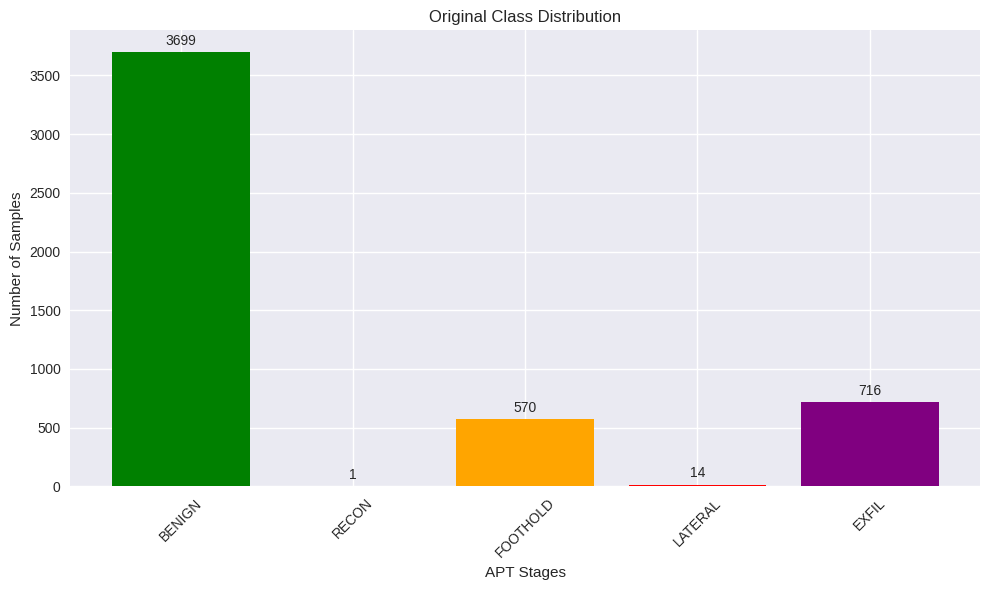


Balancing dataset...
Original class distribution:
  BENIGN: 3699
  RECON: 1
  FOOTHOLD: 570
  LATERAL: 14
  EXFIL: 716
Balanced class distribution:
  BENIGN: 2000
  RECON: 500
  FOOTHOLD: 800
  LATERAL: 600
  EXFIL: 1000


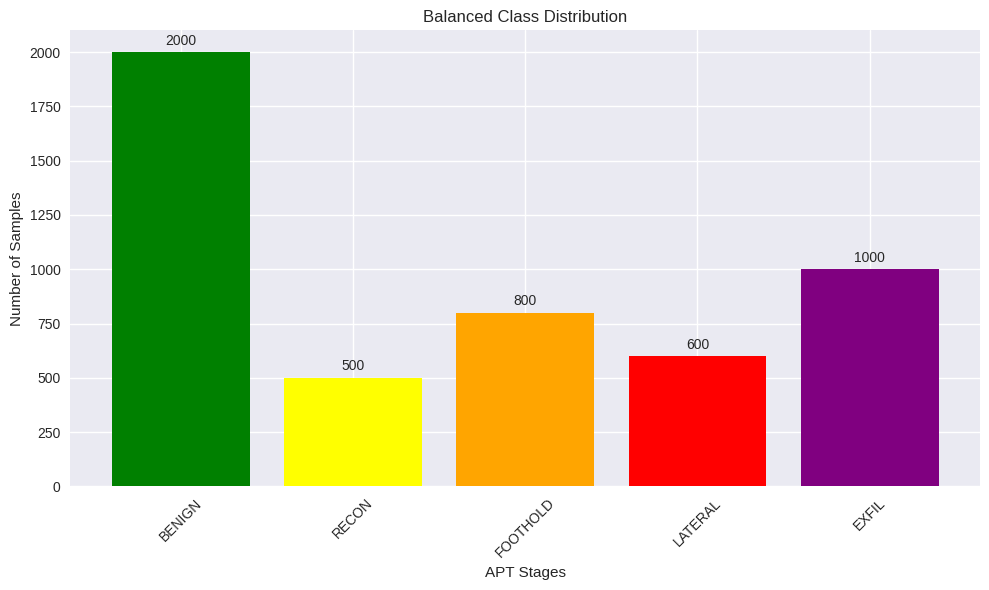


Starting training for 300 epochs...
Epoch   0: Loss=1.6202, Val_Acc=0.2279, Best=0.2279
Epoch  10: Loss=1.5558, Val_Acc=0.2361, Best=0.2361
Epoch  20: Loss=1.5037, Val_Acc=0.1803, Best=0.2361
Epoch  30: Loss=1.4598, Val_Acc=0.5565, Best=0.5565
Epoch  40: Loss=1.4205, Val_Acc=0.5381, Best=0.5565
Epoch  50: Loss=1.7141, Val_Acc=0.5864, Best=0.5864
Epoch  60: Loss=1.8881, Val_Acc=0.5422, Best=0.5864
Epoch  70: Loss=1.5202, Val_Acc=0.5912, Best=0.5912
Epoch  80: Loss=1.4419, Val_Acc=0.5735, Best=0.5912
Epoch  90: Loss=1.4173, Val_Acc=0.5721, Best=0.5912
Epoch 100: Loss=1.4158, Val_Acc=0.5122, Best=0.5912
Epoch 110: Loss=1.3981, Val_Acc=0.5279, Best=0.5912
Epoch 120: Loss=1.4133, Val_Acc=0.5871, Best=0.5912
Epoch 130: Loss=1.4039, Val_Acc=0.5884, Best=0.5912
Epoch 140: Loss=1.3999, Val_Acc=0.5878, Best=0.5912
Epoch 150: Loss=1.3975, Val_Acc=0.5884, Best=0.5912
Epoch 160: Loss=1.3947, Val_Acc=0.5878, Best=0.5912
Epoch 170: Loss=1.4010, Val_Acc=0.5878, Best=0.5912
Epoch 180: Loss=1.3801, Val

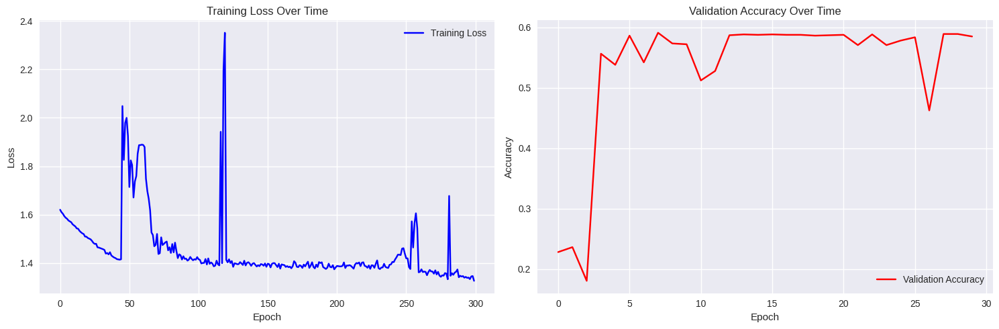

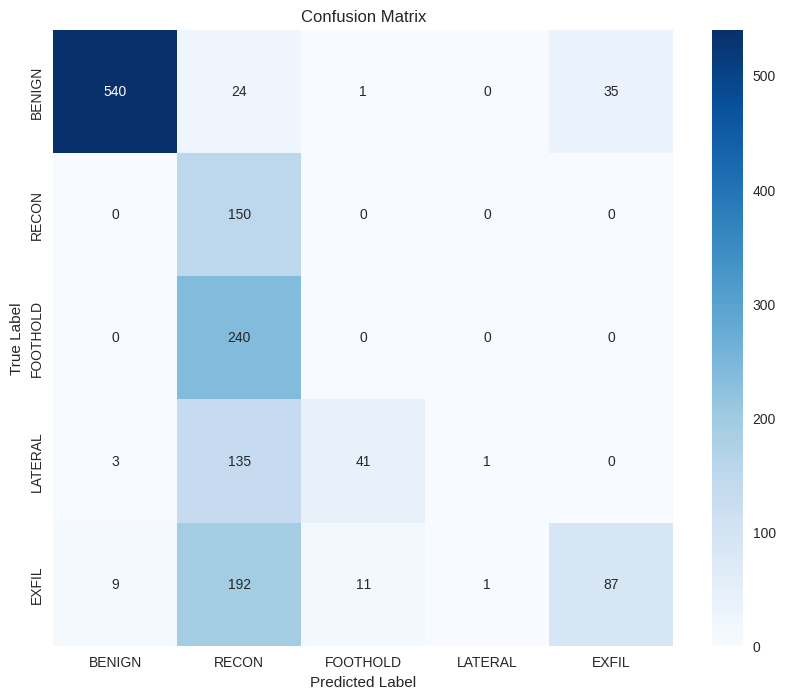

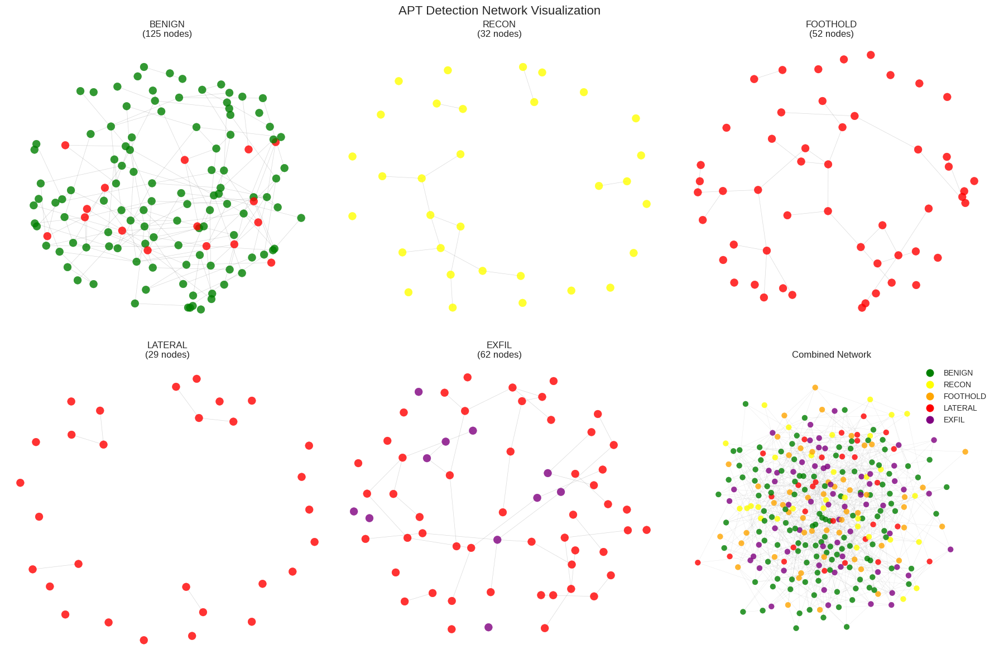

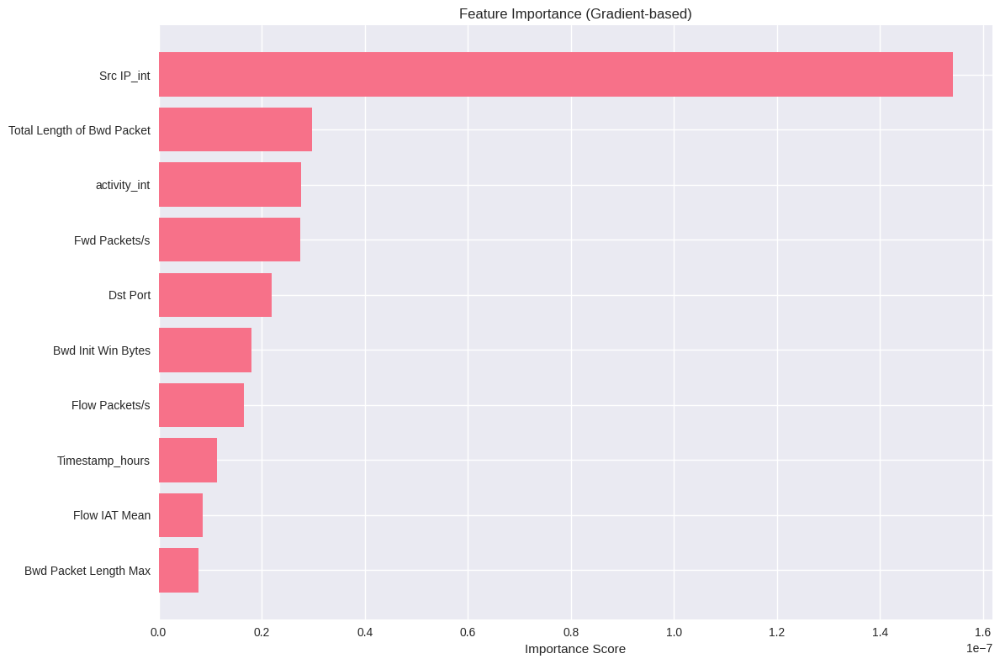

Final Results:
Training Accuracy: 0.5259
Test Accuracy: 0.5293


In [31]:

# Load your data
data = data.copy()

# Initialize pipeline
pipeline = APTDetectionPipeline(data)

# Run complete pipeline
model, train_acc, test_acc, predictions, true_labels = main_training_pipeline(pipeline)

print(f"Final Results:")
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
